<a href="https://colab.research.google.com/github/Pooret/drug-discovery-ml/blob/main/Copy_of_decoder_smiles_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.1/33.1 MB 42.5 MB/s eta 0:00:00


In [2]:
# imports

import pandas as pd
import numpy as np
from tqdm import tqdm

import ast

from sklearn.model_selection import train_test_split
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
from rdkit import Chem, RDLogger
from rdkit.Chem import BondType, Draw
from rdkit.Chem.Draw import MolsToGridImage
from rdkit.Chem import PandasTools

In [3]:
# mount your drive to access your data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## In your google drive, there should be a `chembl_33_data.tar.gz` file. Locate that in the files tab on the left and copy and paste it's path into the line below.

 ### e.g. If the file pathway is `/content/drive/MyDrive/Datasets/chemdata/Chembl_33_db/chembl_33_data.tar.gz` the the code below will look this this:

 ### `!tar -xzf /content/drive/MyDrive/Datasets/chemdata/Chembl_33_db/chembl_33_data.tar.gz -C /content/`

In [4]:
!tar -xzf  /content/drive/MyDrive/Datasets/chemdata/Chembl_33_db/chembl_33_data.tar.gz -C /content/

tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.quarantine'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.provenance'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.metadata:kMDItemWhereFroms'
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.apple.macl'


In [5]:
# load data into pandas dataframe
df = pd.read_csv("/content/data.csv")

# examine first 5 rows of data
df.head()

,molregno,canonical_smiles,activity_id,standard_type,standard_value,standard_units,assay_id,tid,target_chembl_id,organism,...,qed_weighted,mw_monoisotopic,hba_lipinski,hbd_lipinski,num_lipinski_ro5_violations,np_likeness_score,bei,le,lle,sei
0,10,c1cc2cc(c1)-c1cccc(c1)C[n+]1ccc(c3ccccc31)NCCC...,492214,IC50,110.0,nM,200081,104828,CHEMBL2547,Rattus norvegicus,...,0.17,606.3712,4.0,2.0,2.0,0.13,NaN,NaN,NaN,NaN
1,23,O=C1O/C(=C/Br)CCC1c1cccc2ccccc12,14394768,Potency,73078.0,nM,1301803,104173,CHEMBL6152,Trypanosoma brucei,...,0.72,316.0099,2.0,0.0,0.0,0.52,21.61,0.49,2.35,26.06
2,24,O=C1O/C(=C/I)CCC1c1cccc2ccccc12,294832,IC50,30.0,nM,156048,11934,CHEMBL3213,Homo sapiens,...,0.55,363.9960,2.0,0.0,0.0,0.49,20.66,0.54,2.98,28.60
3,25,C#C/C=C1\CCC(c2cccc3ccccc23)C(=O)O1,280316,IC50,95.0,nM,156048,11934,CHEMBL3213,Homo sapiens,...,0.58,262.0994,2.0,0.0,0.0,0.52,26.77,0.48,3.24,26.70
4,26,O=C1O/C(=C\I)CCC1c1cccc2ccccc12,271844,IC50,190.0,nM,156048,11934,CHEMBL3213,Homo sapiens,...,0.55,363.9960,2.0,0.0,0.0,0.49,18.46,0.48,2.18,25.56


In [6]:
new_df = df[df['num_lipinski_ro5_violations'] < 1]

In [7]:
new_df['standard_type'].unique()

array(['Potency', 'IC50', 'Kd', 'Ki', 'Solubility', 'Km', 'MIC', 'XC50',
       'Selectivity', 'Cmax', 'MIC80', 'MIC50', 'Kp', 'LC50', 'Kinact',
       'GI50', 'MCC', 'CC50', 'Kb', 'pKi', 'TGI', 'pA2', 'IC95', 'TC50',
       'EC50', 'Inhibition', 'ID50', 'fCmax', 'Ratio', 'IC90', 'AC50',
       'ED50', 'Relative IC50', 'T50', 'Kieq', 'K bind', 'P-450 loss',
       'Kis', 'Activity', 'IC30', 'dP/dt', 'MIC90', 'fIC30', 'Protection',
       'Stability', 'Kd2', 'KiAH', 'C50', 'Ri', 'MEC', 'Rate',
       'Binding affinity', 'Plasma level', 'cKi', 'K0.5', 'fEC50',
       'Log Ki', 'Ke', 'CIC', 'Ka', 'IP', 'Ke naloxone', 'pKb', 'INH',
       'Plasma concentration', 'Residual activity', 'MI0.5', 'Ks',
       'K 0.5', 'Cytotoxicity', 'K app', 'KL', 'IC60', 'Log IC50', 'Kif',
       'SC200', 'EC20', 'KiH', 'Ca2+ elevation', 'Ratio Ki', 'K2',
       'alphaKi', 'MIC100', 'XI50', 'Inhibitory activity', 'Affinity',
       'Inflection point', 'Mortality', 'LD50', 'Fluorescence',
       'Ki app (inact

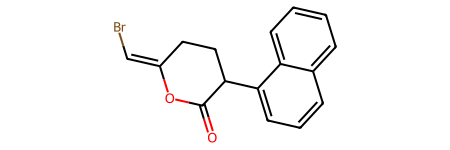

In [8]:
Chem.MolFromSmiles(df['canonical_smiles'].iloc[1])

In [9]:
(new_df['canonical_smiles'].iloc[0])

'O=C1O/C(=C/Br)CCC1c1cccc2ccccc12'

In [10]:
new_df.columns

Index(['molregno', 'canonical_smiles', 'activity_id', 'standard_type',
       'standard_value', 'standard_units', 'assay_id', 'tid',
       'target_chembl_id', 'organism', 'pref_name', 'mw_freebase', 'alogp',
       'hba', 'hbd', 'psa', 'rtb', 'ro3_pass', 'num_ro5_violations',
       'cx_most_apka', 'cx_most_bpka', 'cx_logp', 'cx_logd',
       'molecular_species', 'full_molformula', 'full_mwt', 'aromatic_rings',
       'heavy_atoms', 'qed_weighted', 'mw_monoisotopic', 'hba_lipinski',
       'hbd_lipinski', 'num_lipinski_ro5_violations', 'np_likeness_score',
       'bei', 'le', 'lle', 'sei'],
      dtype='object')

In [11]:
new_df['standard_type'].unique()

array(['Potency', 'IC50', 'Kd', 'Ki', 'Solubility', 'Km', 'MIC', 'XC50',
       'Selectivity', 'Cmax', 'MIC80', 'MIC50', 'Kp', 'LC50', 'Kinact',
       'GI50', 'MCC', 'CC50', 'Kb', 'pKi', 'TGI', 'pA2', 'IC95', 'TC50',
       'EC50', 'Inhibition', 'ID50', 'fCmax', 'Ratio', 'IC90', 'AC50',
       'ED50', 'Relative IC50', 'T50', 'Kieq', 'K bind', 'P-450 loss',
       'Kis', 'Activity', 'IC30', 'dP/dt', 'MIC90', 'fIC30', 'Protection',
       'Stability', 'Kd2', 'KiAH', 'C50', 'Ri', 'MEC', 'Rate',
       'Binding affinity', 'Plasma level', 'cKi', 'K0.5', 'fEC50',
       'Log Ki', 'Ke', 'CIC', 'Ka', 'IP', 'Ke naloxone', 'pKb', 'INH',
       'Plasma concentration', 'Residual activity', 'MI0.5', 'Ks',
       'K 0.5', 'Cytotoxicity', 'K app', 'KL', 'IC60', 'Log IC50', 'Kif',
       'SC200', 'EC20', 'KiH', 'Ca2+ elevation', 'Ratio Ki', 'K2',
       'alphaKi', 'MIC100', 'XI50', 'Inhibitory activity', 'Affinity',
       'Inflection point', 'Mortality', 'LD50', 'Fluorescence',
       'Ki app (inact

In [12]:
wanted_values = ['Potency', 'IC50', 'Kd', 'Ki', 'Solubility', 'Km', 'MIC', 'XC50',
       'Selectivity', 'Cmax', 'MIC80', 'MIC50', 'Kp', 'LC50', 'Kinact',
       'GI50', 'MCC', 'CC50', 'Kb', 'pKi', 'TGI', 'pA2', 'IC95', 'TC50',
       'EC50', 'Inhibition', 'ID50', 'fCmax', 'Ratio', 'IC90', 'AC50']

In [13]:
lip_df = new_df[(new_df['num_lipinski_ro5_violations'] == 0) & (new_df['hba_lipinski'] <= 10) & (new_df['mw_monoisotopic'] < 480) & (new_df['le']>0.3) & (new_df['lle']>3)]
print(lip_df.shape)
lip_df.head()

(118542, 38)


,molregno,canonical_smiles,activity_id,standard_type,standard_value,standard_units,assay_id,tid,target_chembl_id,organism,...,qed_weighted,mw_monoisotopic,hba_lipinski,hbd_lipinski,num_lipinski_ro5_violations,np_likeness_score,bei,le,lle,sei
3,25,C#C/C=C1\CCC(c2cccc3ccccc23)C(=O)O1,280316,IC50,95.0000,nM,156048,11934,CHEMBL3213,Homo sapiens,...,0.58,262.0994,2.0,0.0,0.0,0.52,26.77,0.48,3.24,26.70
5,31,COc1cc2nc(N3CCN(C(=O)C4CC4c4ccccc4)CC3)nc(N)c2...,325753,IC50,0.5129,nM,33572,104304,CHEMBL1907610,Rattus norvegicus,...,0.66,433.2114,8.0,2.0,0.0,-0.89,21.43,0.40,6.61,9.90
6,33,COc1cc2nc(N3CCN(S(=O)(=O)c4cccs4)CC3)nc(N)c2cc1OC,343861,IC50,33.8800,nM,33572,104304,CHEMBL1907610,Rattus norvegicus,...,0.65,435.1035,9.0,2.0,0.0,-1.78,17.15,0.35,5.67,6.74
20,59,COc1cc2nc(N3CCN(C(=O)CCc4ccccc4)CC3)nc(N)c2cc1OC,331005,IC50,3.3880,nM,33572,104304,CHEMBL1907610,Rattus norvegicus,...,0.65,421.2114,8.0,2.0,0.0,-0.91,20.10,0.37,5.96,9.03
21,60,COc1ccc(/C=C/C(=O)N2CCN(c3nc(N)c4cc(OC)c(OC)cc...,331003,IC50,3.3880,nM,33574,104304,CHEMBL1907610,Rattus norvegicus,...,0.57,449.2063,9.0,2.0,0.0,-0.67,18.84,0.35,5.87,8.22


In [74]:
# Number of training tokens
# Model params 2,390,574
len("".join(smiles for smiles in lip_df['canonical_smiles'].tolist()))

5145963

In [75]:
# Preprocessing

import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Embedding, MultiHeadAttention, LayerNormalization, Dense, Dropout, Add, TimeDistributed
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Constants for the model
MODEL_DIM = 128
NUM_HEADS = 4
DROPOUT = 0.1
EPOCHS = 60
BATCH_SIZE = 256  # Adjust based on memory availability
LEARNING_RATE = 1e-3
NUM_LAYERS = 8
TEMPERATURE = 1.0  # Temperature for generation
CLIPVALUE = 1.0  # Gradient clipping value

# Prepare SMILES strings
smiles_list = lip_df['canonical_smiles'].tolist()

# Add special tokens with reserved indices
special_tokens = ['<PAD>', '<SOS>', '<EOS>']
vocab = special_tokens + list(set("".join(smiles_list)))  # Ensure special tokens are at the beginning

# Create character-to-index and index-to-character mappings
chars_to_index = {char: index for index, char in enumerate(vocab)}
index_to_chars = {index: char for index, char in enumerate(vocab)}

# Define the maximum length for padding (adding 2 for the <SOS> and <EOS> tokens)
max_length = max(len(smiles) for smiles in smiles_list) + 2

# Encode all SMILES strings
encoded_smiles_list = [
    [chars_to_index['<SOS>']] + [chars_to_index[char] for char in smiles] + [chars_to_index['<EOS>']]
    for smiles in smiles_list
]

# Pad sequences to the same length using <PAD> token
padded_smiles_list = pad_sequences(encoded_smiles_list, maxlen=max_length, padding='post', value=chars_to_index['<PAD>'])

# Convert to numpy array
X = np.array(padded_smiles_list)

# Create the target sequences (shifted by one time step)
y = np.zeros_like(X)
y[:, :-1] = X[:, 1:]
y[:, -1] = chars_to_index['<PAD>']

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

Epoch 1/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 543s 540ms/step - accuracy: 0.8045 - loss: 0.7222 - val_accuracy: 0.8976 - val_loss: 0.3053
Epoch 2/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.8980 - loss: 0.3043 - val_accuracy: 0.9131 - val_loss: 0.2541
Epoch 3/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9108 - loss: 0.2610 - val_accuracy: 0.9206 - val_loss: 0.2299
Epoch 4/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9168 - loss: 0.2407 - val_accuracy: 0.9240 - val_loss: 0.2184
Epoch 5/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 28s 75ms/step - accuracy: 0.9206 - loss: 0.2282 - val_accuracy: 0.9262 - val_loss: 0.2112
Epoch 6/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.9233 - loss: 0.2201 - val_accuracy: 0.9285 - val_loss: 0.2039
Epoch 7/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9256 - loss: 0.2129 - val_accuracy: 0.9304 - val_loss: 0.1993
Epoch 8/60
371/371 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.9273 - loss: 0.2076 

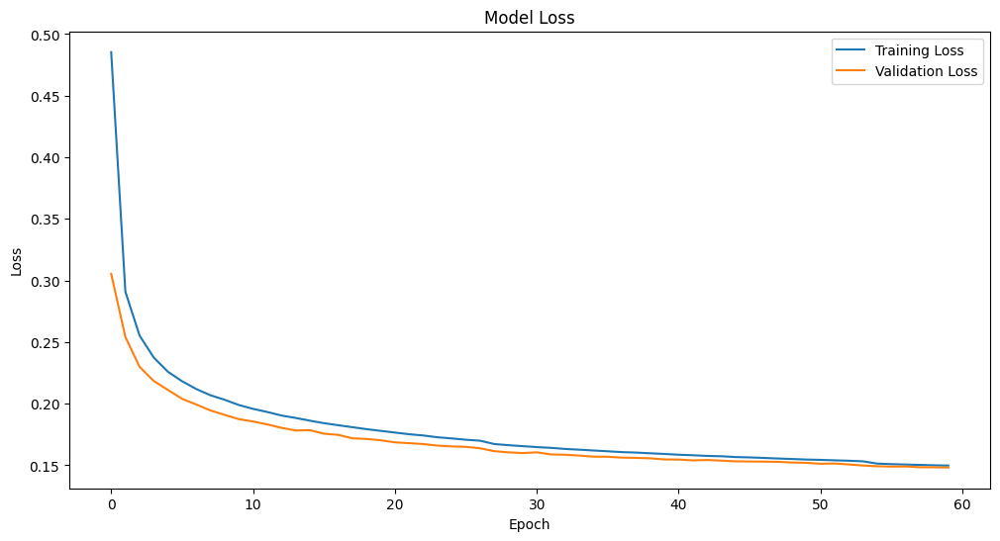

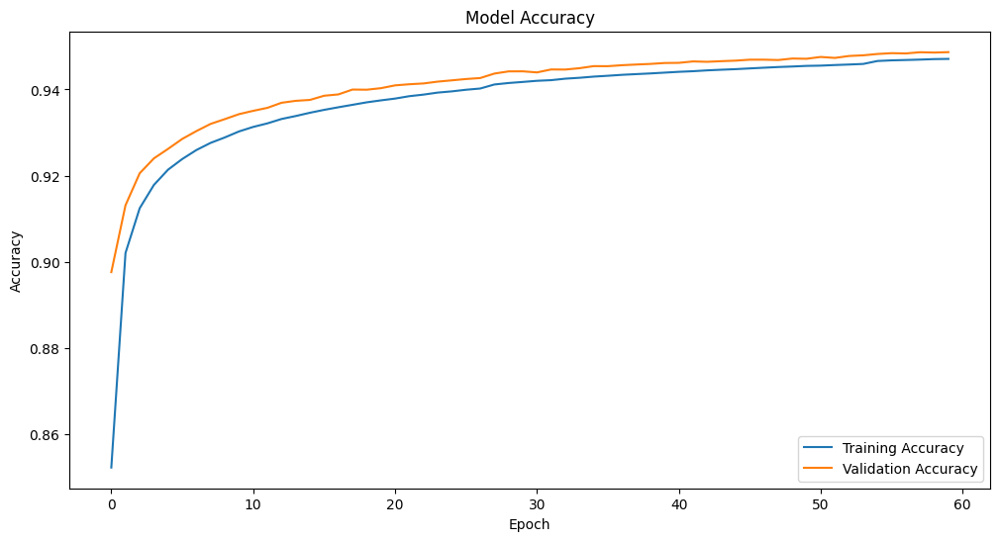

In [76]:
# Decoder only

# Positional Encoding Function
def positional_encoding(position, d_model):
    angle_rads = np.arange(position)[:, np.newaxis] / np.power(10000, (2 * (np.arange(d_model)[np.newaxis, :] // 2)) / np.float32(d_model))
    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    pos_encoding = angle_rads[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

# Build the GPT-like decoder-only model
def build_decoder_only_model(input_shape, vocab_size, model_dim, num_heads, dropout_rate, num_layers):
    inputs = Input(shape=input_shape)
    x = Embedding(input_dim=vocab_size, output_dim=model_dim, mask_zero=True)(inputs)

    # Add positional encoding
    pos_encoding = positional_encoding(input_shape[0], model_dim)
    x = Add()([x, pos_encoding[:, :input_shape[0], :]])

    for _ in range(num_layers):
        # Decoder block
        attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=model_dim)(x, x, attention_mask=tf.linalg.band_part(tf.ones((input_shape[0], input_shape[0])), -1, 0))
        attn_output = Dropout(dropout_rate)(attn_output)
        out1 = LayerNormalization(epsilon=1e-6)(x + attn_output)

        ffn_output = Dense(model_dim, activation='relu')(out1)
        ffn_output = Dense(model_dim)(ffn_output)
        ffn_output = Dropout(dropout_rate)(ffn_output)
        x = LayerNormalization(epsilon=1e-6)(out1 + ffn_output)

    outputs = TimeDistributed(Dense(vocab_size, activation='softmax'))(x)
    model = Model(inputs, outputs)
    return model

# Instantiate the model
decoder_only_model = build_decoder_only_model(
    input_shape=(max_length,),
    vocab_size=len(vocab),
    model_dim=MODEL_DIM,
    num_heads=NUM_HEADS,
    dropout_rate=DROPOUT,
    num_layers=NUM_LAYERS
)

# Compile the model with gradient clipping
optimizer = Adam(learning_rate=ExponentialDecay(
    initial_learning_rate=LEARNING_RATE,
    decay_steps=10000,
    decay_rate=0.9,
    staircase=True
), clipvalue=CLIPVALUE)

decoder_only_model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])

# Configure early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Train the model with early stopping
history = decoder_only_model.fit(X_train, y_train, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=(X_val, y_val), callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()


In [77]:
# Function to generate SMILES strings with temperature scaling
def generate_smiles(model, start_token, max_length, chars_to_index, index_to_chars, temperature=1.0):
    # Initialize the input sequence with the start token
    input_seq = [chars_to_index[start_token]]
    for _ in range(max_length - 1):
        # Pad the sequence
        padded_seq = pad_sequences([input_seq], maxlen=max_length, padding='post', value=chars_to_index['<PAD>'])
        # Predict the next character
        pred = model.predict(padded_seq, verbose=0)
        pred = pred[0][len(input_seq) - 1]

        # Apply temperature scaling
        pred = np.log(pred + 1e-9) / temperature
        exp_pred = np.exp(pred)
        pred = exp_pred / np.sum(exp_pred)
        next_char = np.random.choice(len(pred), p=pred)

        # Append the next character to the sequence
        input_seq.append(next_char)

        # If EOS token is generated, stop the generation
        if next_char == chars_to_index['<EOS>']:
            break

    # Convert the sequence of indices to characters
    smiles = ''.join([index_to_chars[i] for i in input_seq if i != chars_to_index['<PAD>'] and i != chars_to_index['<EOS>']])
    print(smiles.split("<SOS>")[-1])
    return smiles.split("<SOS>")[-1]

def evaluate_generated_smiles(generated_smiles_list, training_smiles_list):
    from rdkit import Chem
    from rdkit import RDLogger

    # Function to check the validity of generated SMILES strings using RDKit
    def is_valid_smiles(smiles):
        mol = Chem.MolFromSmiles(smiles)
        return mol is not None

    # Suppress RDKit warnings
    RDLogger.DisableLog('rdApp.*')

    valid_smiles = []

    for smiles in generated_smiles_list:
        if is_valid_smiles(smiles) and len(smiles) > 0:
            valid_smiles.append(smiles)

    validity = len(valid_smiles) / len(generated_smiles_list) * 100
    unique_smiles = list(set(valid_smiles))
    not_unique = 0
    for smiles in training_smiles_list:
      if smiles in unique_smiles:
        not_unique += 1

    # percent unique = number found in training set - unique smiles / total valid smiles
    unique = (len(unique_smiles)-not_unique)/len(valid_smiles) * 100

    # Re-enable RDKit warnings if needed
    RDLogger.EnableLog('rdApp.*')

    return validity, unique, list(set(valid_smiles))

# Generate a new SMILES string
new_smiles = generate_smiles(decoder_only_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=TEMPERATURE)
print(f"Generated SMILES: {new_smiles}")
generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(decoder_only_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=TEMPERATURE)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles)

1c1cc(OCCN2CCC(c3c[nH]cn3)CC2)cc1Br
Generated SMILES: 1c1cc(OCCN2CCC(c3c[nH]cn3)CC2)cc1Br


  1%|          | 1/100 [00:02<04:13,  2.56s/it]

Cc1c(Cc2cccc(=O)n2CO)nn(-c2cccc3cnccc23)c1C


  2%|▏         | 2/100 [00:05<04:27,  2.73s/it]

CCOc1cc2nccc(N3CC[C@@H](OC)C3)c2cc1OCCCOc1ccccc1C


  3%|▎         | 3/100 [00:09<05:03,  3.13s/it]

COc1cc(C[C@](O)(c2cccc(CC(=O)N3Cc4ccccc4CC3)c2)C(F)(F)F)ccc1OC


  4%|▍         | 4/100 [00:12<05:08,  3.21s/it]

NC(=O)c1cccc2c3c(cccc12)[S+]([O-])[C@@H](O)[C@H](CO)NC3=O


  5%|▌         | 5/100 [00:14<04:29,  2.83s/it]

Cl.OCCCCCN1CCN(c2ncc3cc(F)ccc3n2)CC1


  6%|▌         | 6/100 [00:16<03:54,  2.49s/it]

Nc1nc(N)c2cc(CNc3ccccc3)ccc2n1


  7%|▋         | 7/100 [00:19<04:22,  2.83s/it]

O=C(O)c1ccc(N(CC(=O)NS(=O)(=O)c2ccc3c(c2)OCCO3)c2ccccc2)cc1


  8%|▊         | 8/100 [00:23<04:43,  3.09s/it]

CCOC(=O)N1CC2(CCN(C(=O)[C@](OC(C)(C)C)c3ccc(C)cc3)CC2)c2ccccc21


  9%|▉         | 9/100 [00:26<04:27,  2.94s/it]

COc1ccc(Cl)cc1-c1nc2c(cnn2C2CCOCC2)c(=O)[nH]1


 10%|█         | 10/100 [00:29<04:25,  2.95s/it]

CCc1sc2nc(N)[nH]c(=O)c2c1S(=O)(=O)c1ccc(Cl)c(Cl)c1


 11%|█         | 11/100 [00:32<04:22,  2.95s/it]

CCOc1ncnc(Cl)c1CN1CCN(CCOc2ccc3c(c2)NC(=O)CC3)CC1


 12%|█▏        | 12/100 [00:34<03:56,  2.69s/it]

NC(=O)c1cnc(N)c2c1[nH]c1cc(O)ccc12


 13%|█▎        | 13/100 [00:35<03:27,  2.38s/it]

COc1cc2nc(-c3ccccc3)cn2cc1OC


 14%|█▍        | 14/100 [00:37<03:04,  2.15s/it]

COc1ccccc1/N=C(\N)Nc1ccccn1


 15%|█▌        | 15/100 [00:40<03:18,  2.33s/it]

COc1nc2nc(C)c(N(C)C)nc2cc1-c1ccnc(NC2CCCOCC2)n1


 16%|█▌        | 16/100 [00:42<03:25,  2.44s/it]

NCc1cnc(O)c2c1[nH]c1cc(OCCCN3CC4CCC3CC4)ccc12


 17%|█▋        | 17/100 [00:45<03:36,  2.60s/it]

CCCn1nc(Cc2cc(C)cc(OCC)c2)c2cnc(C(=O)N3CCCC3)nc21


 18%|█▊        | 18/100 [00:48<03:34,  2.61s/it]

COc1cc2c(Nc3ccc(F)c(Cl)c3)ncnc2cc1N1CCN(C)CC1


 19%|█▉        | 19/100 [00:49<02:57,  2.19s/it]

Nc1ncnc2c1ncn2C1CCC1


 20%|██        | 20/100 [00:52<03:10,  2.38s/it]

Cn1cc(-c2ccc3c(c2)OCO3)c(-c2cnnn2-c2ccc(F)cc2)n1


 21%|██        | 21/100 [00:54<03:09,  2.40s/it]

Cc1ccc(C(=O)N2CCCC2C(=O)OCC(O)CNC(C)C)cc1


 22%|██▏       | 22/100 [00:58<03:29,  2.68s/it]

CCN1CCN(CCOc2ccc(-c3cc(C(F)(F)F)ccc3C#N)c3c2C(C)C=C3)CC1


 23%|██▎       | 23/100 [00:59<02:55,  2.28s/it]

CC(C)CC(=O)O)[PH](=O)O


 24%|██▍       | 24/100 [01:01<02:40,  2.11s/it]

Cl.c1ccc2c(c1)CCC(C1=NCCN1)C2


 25%|██▌       | 25/100 [01:03<02:48,  2.25s/it]

CC(=O)C1CCCN1CCc1ccc(C(=O)N(C)Cc2ccccc2)cc1


 26%|██▌       | 26/100 [01:07<03:04,  2.50s/it]

O=C(Nc1cc(-c2cn[nH]c2)cc(-c2ccccc2)c1)C(=O)Nc1cccnc1


 27%|██▋       | 27/100 [01:08<02:38,  2.16s/it]

Nc1nc2ccccc2nc1N1CCCCC1


 28%|██▊       | 28/100 [01:10<02:37,  2.19s/it]

COc1ccc(C(=O)NNC(=O)C(CS)c2ccccc2)cc1


 29%|██▉       | 29/100 [01:13<02:59,  2.53s/it]

CS(=O)(=O)Nc1cccc2c1Cc1c-2nc(O)c2nc(C(=O)NC(C)C)[nH]c12


 30%|███       | 30/100 [01:15<02:40,  2.29s/it]

O=c1cc(Cl)c2cnc3ccccc3c2[nH]1


 31%|███       | 31/100 [01:17<02:37,  2.29s/it]

CC1(C)Cc2nc(O)n3c(-c4ccc(O)cc4)nc3c2C1


 32%|███▏      | 32/100 [01:20<02:43,  2.40s/it]

CC(C)(NCCc1ccc(CCCN)cc1)c1ccc2c(c1)C(=O)NC2=O


 33%|███▎      | 33/100 [01:23<02:54,  2.60s/it]

COc1ccc(CNC(=O)C(=O)c2c[nH]c3ccccc23)cc1[N+](=O)[O-]


 34%|███▍      | 34/100 [01:27<03:11,  2.90s/it]

Cc1cccc(C(=O)c2sc(N)nc2-c2ccc(P(=O)(O)O)o2)c1.O=C(O)C(F)(F)F


 35%|███▌      | 35/100 [01:30<03:09,  2.91s/it]

OCCCCOc1ccc(CN2Cc3ccccc3OC2c2cnc3ccc(F)nc3c2)cc1F


 36%|███▌      | 36/100 [01:32<02:49,  2.65s/it]

O=C(Nc1ccc(Cl)cc1)Nc1ccc2c(c1)OCO2


 37%|███▋      | 37/100 [01:34<02:37,  2.50s/it]

COc1cccc(/C=N/Nc2ncnc3c2nnn3C(C)C)c1


 38%|███▊      | 38/100 [01:38<03:00,  2.92s/it]

CC[C@@H](Nc1c(Nc2cccc(C(=O)N(C)C)c2O)c(=O)c1=O)c1ccc(C(F)(F)F)cc1


 39%|███▉      | 39/100 [01:41<03:04,  3.02s/it]

O=C(Cn1c(=O)[nH]c2ncccc21)NCC(=O)N1CCC(c2ccc(F)cc2)CC1


 40%|████      | 40/100 [01:43<02:39,  2.66s/it]

CC1(C)SC(NC2=NC(=O)CCS2)=NC1=O


 41%|████      | 41/100 [01:44<02:17,  2.33s/it]

CC(=O)Nc1ccc2c(c1)CNC(C)C2


 42%|████▏     | 42/100 [01:47<02:21,  2.45s/it]

CCc1nn(C)c2c(=O)n3c(=O)n(Cc4ccc(N)nc4)ccc3nc12


 43%|████▎     | 43/100 [01:50<02:20,  2.46s/it]

COCC(O)c1ccn2c1Cc1c-2nc(O)c2nc(C(N)=O)cn12


 44%|████▍     | 44/100 [01:52<02:14,  2.40s/it]

O=C(CCN1CCCCC1)Nc1ccc(C(=O)N2CCCC2)cc1


 45%|████▌     | 45/100 [01:54<02:02,  2.23s/it]

c1cnccc1C1(c2ccc(Br)cc2)CCNCC1


 46%|████▌     | 46/100 [01:57<02:13,  2.48s/it]

NS(=O)(=O)c1ccc(CN/C=C2\C(=O)Nc3ccc4[nH]ncc4c32)cc1


 47%|████▋     | 47/100 [02:00<02:14,  2.53s/it]

CC(C)(CC(=O)N1CCC[C@H]1C(=O)NCC(=O)O)CCC(=O)O


 48%|████▊     | 48/100 [02:02<02:08,  2.47s/it]

CS(=O)(=O)c1ccc(NC(=O)CCn2ccnc2)c(Cl)c1


 49%|████▉     | 49/100 [02:03<01:41,  1.99s/it]

Cc1ccc(CCN)cc1


 50%|█████     | 50/100 [02:05<01:42,  2.04s/it]

O=C1c2ccccc2S(=O)(=O)N1CSc1cccc(F)c1


 51%|█████     | 51/100 [02:06<01:27,  1.78s/it]

c1ccc(Cc2ccncc2)cc1


 52%|█████▏    | 52/100 [02:09<01:40,  2.09s/it]

CC(C)OC(=O)[C@@H]1CNC[C@H]1c1ccc(-c2ccccc2)cc1


 53%|█████▎    | 53/100 [02:11<01:37,  2.07s/it]

CN1C2CCC1C(NC(=O)c1cnn3cccnc13)C2


 54%|█████▍    | 54/100 [02:15<01:59,  2.60s/it]

CC(C)[C@@]1(O)C[C@H](NS(=O)(=O)c2nc3cc(F)ccc3[nH]2)CCCCC(=O)N1


 55%|█████▌    | 55/100 [02:17<01:47,  2.40s/it]

O=C(Cc1ccccc1)NC[C@@H]1C[C@@H]1O


 56%|█████▌    | 56/100 [02:20<01:52,  2.56s/it]

CC(=O)N[C@@H]1[C@@H](N)C=C(C(=O)O)O[C@H]1c1ccccc1


 57%|█████▋    | 57/100 [02:21<01:41,  2.35s/it]

COc1ccc(Cl)cc1NC(=O)NNC(=O)CCCN


 58%|█████▊    | 58/100 [02:23<01:27,  2.08s/it]

Fc1cccc(CCCc2ccccc2)c1O


 59%|█████▉    | 59/100 [02:26<01:34,  2.31s/it]

Nc1nc(C(F)(F)F)sc1-c1ccc(CN[C@H]2CCC[C@H]2O)cc1


 60%|██████    | 60/100 [02:27<01:25,  2.13s/it]

CN1C(=O)CCCC1C(=O)NCc1ccccc1F


 61%|██████    | 61/100 [02:30<01:31,  2.34s/it]

O=C(O)C[C@H]1N[C@@H](C(=O)O)[C@H](Cl)CCc2ccccc21


 62%|██████▏   | 62/100 [02:33<01:34,  2.50s/it]

N#Cc1ccc(-c2cnnc(-c3ccc(OCc4ccccc4)c(F)c3)c2)cc1


 63%|██████▎   | 63/100 [02:37<01:48,  2.93s/it]

CN1CCN(S(=O)(=O)c2cc(Cl)cc3[nH]c(-c4ccc([N+](=O)[O-])cc4)cc23)CC1


 64%|██████▍   | 64/100 [02:41<01:58,  3.30s/it]

COC(=O)O[C@H]1C[C@H](NC(=O)C(=O)c2ccc(OCc3cc(Cl)ccc3Cl)c(C)c2)CC(=O)O1


 65%|██████▌   | 65/100 [02:44<01:53,  3.24s/it]

CCCOc1ccc(N2CCN(C(=O)/C=C/c3ccc(CN4CCCC4)cc3)CC2)cc1


 66%|██████▌   | 66/100 [02:46<01:31,  2.69s/it]

CCCCCn1ncc2c1C(=O)NCC2O


 67%|██████▋   | 67/100 [02:47<01:12,  2.19s/it]

CCCC(CC)Nc1nsnc1N


 68%|██████▊   | 68/100 [02:50<01:17,  2.42s/it]

CCc1n[nH]c2ncnc(N3CC4CN(C(=O)Cc5ccccc5Cl)CC4C3)c12


 69%|██████▉   | 69/100 [02:51<01:05,  2.12s/it]

O=C(/C=N/O)c1ccc(Cl)cc1


 70%|███████   | 70/100 [02:54<01:06,  2.23s/it]

O=C(CCCCl)Nc1ccc(Nc2nccc(N(CCO)CCO)n2)cc1


 71%|███████   | 71/100 [02:55<00:59,  2.05s/it]

C=CCn1c(=O)sc2c1ncn1n3CCCC2


 72%|███████▏  | 72/100 [02:59<01:08,  2.43s/it]

Cc1ccc(S(=O)(=O)Nc2ncc(Cl)c(-c3ccc(S(N)(=O)=O)cc3)n2)cc1


 73%|███████▎  | 73/100 [03:03<01:19,  2.96s/it]

Cl.O=C1Cc2ccc3c4[nH]c5c(O)cccc5c4cc4n(c3c2N2C[C@H](CN3CCc5ccccc4C3)C3)C1


 74%|███████▍  | 74/100 [03:05<01:13,  2.82s/it]

CC(C)C(/N=C(\S)Nc1ccc2c(c1)CCC2)NC1=NCCO1


 75%|███████▌  | 75/100 [03:08<01:06,  2.66s/it]

NC(CNC(=O)c1cc2cc(Cl)ccc2[nH]1)C(=O)O


 76%|███████▌  | 76/100 [03:10<00:59,  2.49s/it]

Nc1nc2ccccc2n2c(=O)n(-c3ccccc3)nc12


 77%|███████▋  | 77/100 [03:12<00:54,  2.39s/it]

CN1CCC(N(C)S(=O)(=O)c2ccc(Cl)cc2)CC1


 78%|███████▊  | 78/100 [03:14<00:50,  2.29s/it]

Cc1ccc(-c2nn(C(C)C)c3ncnc(N)c23)cc1


 79%|███████▉  | 79/100 [03:16<00:47,  2.28s/it]

CCCCN1CCC[C@H]1CNC(=O)c1c(OCCF)cccc1OC


 80%|████████  | 80/100 [03:18<00:41,  2.08s/it]

O=C(O)CC1CC(c2ncco2)=CCC1=O


 81%|████████  | 81/100 [03:21<00:44,  2.37s/it]

Cn1c2c(c3cc(C(=O)N4CCC(C4)O)ccc31)CN(Cc1ccncc1)CC2


 82%|████████▏ | 82/100 [03:24<00:45,  2.53s/it]

O=C(C(=O)Nc1ccc(OCc2ccccc2)cc1)c1ccc(C(F)(F)F)cc1


 83%|████████▎ | 83/100 [03:26<00:42,  2.51s/it]

COC(=O)[C@H](CCCCNC(=O)NC)NC(=O)CSc1ccccc1


 84%|████████▍ | 84/100 [03:30<00:47,  2.99s/it]

C[C@@H](c1ccc(-c2ccccc2)n1)[C@H](N)C(=O)N1CC[C@H](F)C1.O=C(O)C(F)(F)F


 85%|████████▌ | 85/100 [03:33<00:44,  2.94s/it]

O=C(CC1c2cccc3cccc1c2c2c(c21)C(=O)NC2=O)N1CCCC1


 86%|████████▌ | 86/100 [03:35<00:37,  2.65s/it]

C1CCCC12NC(=O)Nc1ncc(Cl)c(Cl)n12


 87%|████████▋ | 87/100 [03:39<00:40,  3.13s/it]

CN[C@H]1C[C@H](C(=O)NO)N(S(=O)(=O)c2ccc(Cl)cc2)C1


 88%|████████▊ | 88/100 [03:42<00:35,  2.99s/it]

CFc1cccc(Nc2ncnc3cnc(NC(=O)c4ccccc4)cc23)c1


 89%|████████▉ | 89/100 [03:44<00:28,  2.63s/it]

CCCCCOc1cc2c3ccccc3cc-2c[nH]1


 90%|█████████ | 90/100 [03:45<00:21,  2.14s/it]

CC(C)(C)NC(=O)NO


 91%|█████████ | 91/100 [03:49<00:24,  2.69s/it]

Cc1ccc(C(=O)NC2CC2)cc1-c1cc2cnnc(-c3cc(F)ccc3OC(C)C)c2c(=O)[nH]1


 92%|█████████▏| 92/100 [03:51<00:20,  2.51s/it]

Cl.Fc1ccc2[nH]cc(C[C@H]3CCCN3)c2c1


 93%|█████████▎| 93/100 [03:53<00:16,  2.37s/it]

CCS(=O)(=O)O.Nc1ccc(Oc2ccccc2)cc1


 94%|█████████▍| 94/100 [03:56<00:14,  2.46s/it]

CCCCCCOc1ccc2ncn(-c3cc(CC(=O)O)cc(OC)c3)c2c1


 95%|█████████▌| 95/100 [03:59<00:13,  2.67s/it]

CCN1CCN(c2ccc3[nH]c(-c4c(N)c5ccccc5[nH]c4=O)nc3c2)CC1


 96%|█████████▌| 96/100 [03:59<00:08,  2.08s/it]

Cn1nc(O)nn1


 97%|█████████▋| 97/100 [04:02<00:06,  2.18s/it]

O=C(NO)Nc1nc2c(F)cccc2c(-c2ccc(F)cc2)n1


 98%|█████████▊| 98/100 [04:05<00:04,  2.34s/it]

Cc1c[nH]nc1N1CCN(CCC2c3ccccc3Cc3ccccc32)CC1


 99%|█████████▉| 99/100 [04:08<00:02,  2.73s/it]

N[C@H]1CN(c2ccc(Cl)cn2)C[C@@H]1c1cc(F)c(F)cc1F.O=C(O)C(F)(F)F


100%|██████████| 100/100 [04:10<00:00,  2.51s/it]

CN1CC(=O)c2cnn(C2Cc3ccccc32)c2ccccc21

Percent valid: 90.000%
Percent unique: 92.222%
['Cn1cc(-c2ccc3c(c2)OCO3)c(-c2cnnn2-c2ccc(F)cc2)n1', 'CCOc1cc2nccc(N3CC[C@@H](OC)C3)c2cc1OCCCOc1ccccc1C', 'CS(=O)(=O)c1ccc(NC(=O)CCn2ccnc2)c(Cl)c1', 'CS(=O)(=O)Nc1cccc2c1Cc1c-2nc(O)c2nc(C(=O)NC(C)C)[nH]c12', 'O=C(NO)Nc1nc2c(F)cccc2c(-c2ccc(F)cc2)n1', 'c1cnccc1C1(c2ccc(Br)cc2)CCNCC1', 'Cc1ccc(-c2nn(C(C)C)c3ncnc(N)c23)cc1', 'CC(C)(C)NC(=O)NO', 'CCCCCCOc1ccc2ncn(-c3cc(CC(=O)O)cc(OC)c3)c2c1', 'O=C1c2ccccc2S(=O)(=O)N1CSc1cccc(F)c1', 'CN1CCN(S(=O)(=O)c2cc(Cl)cc3[nH]c(-c4ccc([N+](=O)[O-])cc4)cc23)CC1', 'O=C(Cc1ccccc1)NC[C@@H]1C[C@@H]1O', 'CC(=O)N[C@@H]1[C@@H](N)C=C(C(=O)O)O[C@H]1c1ccccc1', 'CCCC(CC)Nc1nsnc1N', 'N[C@H]1CN(c2ccc(Cl)cn2)C[C@@H]1c1cc(F)c(F)cc1F.O=C(O)C(F)(F)F', 'COCC(O)c1ccn2c1Cc1c-2nc(O)c2nc(C(N)=O)cn12', 'CN1C2CCC1C(NC(=O)c1cnn3cccnc13)C2', 'CN1C(=O)CCCC1C(=O)NCc1ccccc1F', 'COc1nc2nc(C)c(N(C)C)nc2cc1-c1ccnc(NC2CCCOCC2)n1', 'COc1cc2nc(-c3ccccc3)cn2cc1OC', 'CC(=O)C1CCCN1CCc1ccc(C(=O)N(C)Cc2ccccc

In [79]:
decoder_only_model.save("/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras")
decoder_only_model.save("/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.h5")

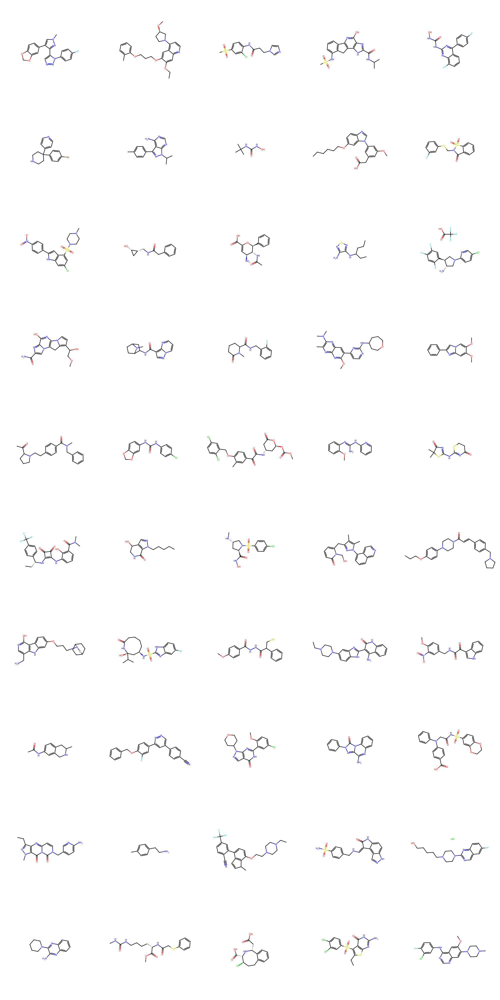

In [111]:
# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles[:50]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

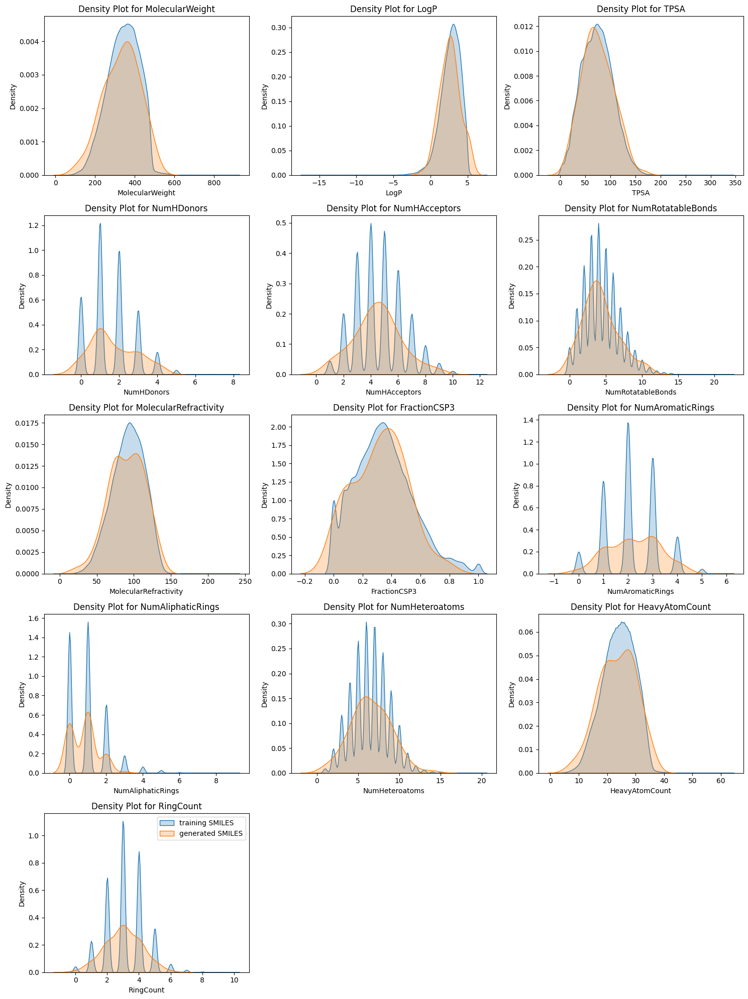

In [112]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import pandas as pd
from rdkit import Chem
from rdkit.Chem import Descriptors


# Define a function to compute descriptors for a given SMILES string
def compute_descriptors(smiles):
    molecule = Chem.MolFromSmiles(smiles)
    if molecule is not None:
        return {
            # Molecular Weight: The sum of atomic weights in the molecule.
            'MolecularWeight': Descriptors.MolWt(molecule),

            # LogP: The logarithm of the octanol-water partition coefficient, indicating hydrophobicity.
            'LogP': Descriptors.MolLogP(molecule),

            # Topological Polar Surface Area (TPSA): The surface area of polar atoms, associated with drug absorption.
            'TPSA': Descriptors.TPSA(molecule),

            # Number of Hydrogen Bond Donors: Atoms in the molecule that can donate hydrogen bonds (e.g., -OH, -NH).
            'NumHDonors': Descriptors.NumHDonors(molecule),

            # Number of Hydrogen Bond Acceptors: Atoms in the molecule that can accept hydrogen bonds (e.g., O, N).
            'NumHAcceptors': Descriptors.NumHAcceptors(molecule),

            # Number of Rotatable Bonds: Single bonds that allow free rotation, contributing to molecular flexibility.
            'NumRotatableBonds': Descriptors.NumRotatableBonds(molecule),

            # Molecular Refractivity: Related to the molecule's polarizability and volume.
            'MolecularRefractivity': Descriptors.MolMR(molecule),

            # Fraction of sp3 Carbons (Csp3): The ratio of sp3-hybridized carbons to the total number of carbons.
            'FractionCSP3': Descriptors.FractionCSP3(molecule),

            # Number of Aromatic Rings: Counts the number of rings with delocalized pi-electron systems.
            'NumAromaticRings': Descriptors.NumAromaticRings(molecule),

            # Number of Aliphatic Rings: Counts the number of non-aromatic cyclic structures.
            'NumAliphaticRings': Descriptors.NumAliphaticRings(molecule),

            # Number of Heteroatoms: Atoms other than carbon and hydrogen (e.g., N, O, S).
            'NumHeteroatoms': Descriptors.NumHeteroatoms(molecule),

            # Number of Heavy Atoms: Atoms in the molecule that are not hydrogen.
            'HeavyAtomCount': Descriptors.HeavyAtomCount(molecule),

            # Total Number of Rings: Counts all rings in the molecule, both aromatic and aliphatic.
            'RingCount': Descriptors.RingCount(molecule),
        }
    else:
        # Return NaNs or a default value for invalid SMILES strings
        return {
            'MolecularWeight': float('nan'),
            'LogP': float('nan'),
            'TPSA': float('nan'),
            'NumHDonors': float('nan'),
            'NumHAcceptors': float('nan'),
            'NumRotatableBonds': float('nan'),
            'MolecularRefractivity': float('nan'),
            'FractionCSP3': float('nan'),
            'NumAromaticRings': float('nan'),
            'NumAliphaticRings': float('nan'),
            'NumHeteroatoms': float('nan'),
            'HeavyAtomCount': float('nan'),
            'RingCount': float('nan'),
        }

# Create dataframes from generated SMILES data to store molecular descriptors
training_df = pd.DataFrame(smiles_list, columns=['SMILES'])
generated_df = pd.DataFrame(unique_valid_smiles, columns=['SMILES'])

# Apply the descriptor function to each row in the dataframe
descriptor_columns = training_df['SMILES'].apply(compute_descriptors)
descriptor_columns_gen = generated_df['SMILES'].apply(compute_descriptors)

# Convert the series of dictionaries into a DataFrame
descriptors_df = pd.DataFrame(descriptor_columns.tolist())
descriptors_gen_df = pd.DataFrame(descriptor_columns_gen.tolist())

# Merge the descriptors back into the original dataframe
training_data = pd.concat([training_df, descriptors_df], axis=1)
gen_data = pd.concat([generated_df, descriptors_gen_df], axis=1)

# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(training_data[column], fill=True, label='training SMILES')
    sns.kdeplot(gen_data[column], fill=True, label='generated SMILES')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()


  1%|          | 1/100 [00:14<24:00, 14.55s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


  2%|▏         | 2/100 [00:17<12:23,  7.58s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


  3%|▎         | 3/100 [00:20<08:42,  5.38s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


  4%|▍         | 4/100 [00:21<06:17,  3.93s/it]

CC(C)(C)C(=O)NCCCCCCCC(=O)NO


  5%|▌         | 5/100 [00:24<05:32,  3.50s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


  6%|▌         | 6/100 [00:27<05:12,  3.32s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


  7%|▋         | 7/100 [00:29<04:22,  2.82s/it]

CC(C)(C)C(=O)NCCCCCCCC(=O)NO


  8%|▊         | 8/100 [00:31<03:57,  2.58s/it]

CC(C)(C)OC(=O)N[C@H](C=O)Cc1ccccc1


  9%|▉         | 9/100 [00:32<03:29,  2.30s/it]

CC(C)(C)C(=O)NCCCCCCCC(=O)NO


 10%|█         | 10/100 [00:35<03:45,  2.50s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 11%|█         | 11/100 [00:38<03:40,  2.48s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 12%|█▏        | 12/100 [00:41<03:58,  2.71s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(COP(=O)(O)O)P(=O)(O)O


 13%|█▎        | 13/100 [00:44<04:00,  2.77s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 14%|█▍        | 14/100 [00:47<03:55,  2.74s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1


 15%|█▌        | 15/100 [00:49<03:37,  2.56s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 16%|█▌        | 16/100 [00:52<03:44,  2.67s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(CO)COP(=O)(O)O


 17%|█▋        | 17/100 [00:54<03:28,  2.51s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 18%|█▊        | 18/100 [00:57<03:36,  2.63s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 19%|█▉        | 19/100 [01:00<03:36,  2.68s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1


 20%|██        | 20/100 [01:02<03:19,  2.49s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 21%|██        | 21/100 [01:04<03:22,  2.57s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 22%|██▏       | 22/100 [01:06<03:07,  2.41s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 23%|██▎       | 23/100 [01:09<03:13,  2.52s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 24%|██▍       | 24/100 [01:12<03:18,  2.61s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 25%|██▌       | 25/100 [01:15<03:19,  2.66s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 26%|██▌       | 26/100 [01:17<03:03,  2.47s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 27%|██▋       | 27/100 [01:19<02:48,  2.31s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 28%|██▊       | 28/100 [01:21<02:41,  2.24s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 29%|██▉       | 29/100 [01:24<02:51,  2.41s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1


 30%|███       | 30/100 [01:26<02:43,  2.34s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 31%|███       | 31/100 [01:28<02:37,  2.28s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 32%|███▏      | 32/100 [01:31<02:45,  2.43s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1


 33%|███▎      | 33/100 [01:34<02:56,  2.63s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 34%|███▍      | 34/100 [01:36<02:42,  2.47s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 35%|███▌      | 35/100 [01:38<02:40,  2.46s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 36%|███▌      | 36/100 [01:41<02:44,  2.56s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 37%|███▋      | 37/100 [01:45<02:57,  2.81s/it]

CC(C)(C)C(=O)Nc1ccc(S(=O)(=O)N2CCN(C(=O)N3CCCC3)CC2)cc1


 38%|███▊      | 38/100 [01:47<02:53,  2.79s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 39%|███▉      | 39/100 [01:49<02:37,  2.58s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 40%|████      | 40/100 [01:51<02:25,  2.42s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 41%|████      | 41/100 [01:54<02:29,  2.54s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 42%|████▏     | 42/100 [01:57<02:28,  2.57s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 43%|████▎     | 43/100 [02:00<02:31,  2.65s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(CO)COP(=O)(O)O


 44%|████▍     | 44/100 [02:02<02:17,  2.46s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 45%|████▌     | 45/100 [02:04<02:19,  2.54s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 46%|████▌     | 46/100 [02:07<02:21,  2.61s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 47%|████▋     | 47/100 [02:10<02:24,  2.73s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 48%|████▊     | 48/100 [02:13<02:19,  2.68s/it]

CC(C)CC(C(=O)NCCCCCC(=O)O)C(=O)NCCCc1ccccc1


 49%|████▉     | 49/100 [02:15<02:15,  2.67s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 50%|█████     | 50/100 [02:18<02:17,  2.75s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 51%|█████     | 51/100 [02:21<02:18,  2.83s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 52%|█████▏    | 52/100 [02:24<02:15,  2.82s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 53%|█████▎    | 53/100 [02:26<02:01,  2.58s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 54%|█████▍    | 54/100 [02:28<01:50,  2.40s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 55%|█████▌    | 55/100 [02:30<01:41,  2.25s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 56%|█████▌    | 56/100 [02:33<01:41,  2.30s/it]

CC(C)(C)C(=O)Nc1ccc(S(=O)(=O)N2CCCC2)cc1


 57%|█████▋    | 57/100 [02:35<01:36,  2.25s/it]

CC(C)CC(C(=O)NCC(=O)O)C(=O)NCC(=O)O


 58%|█████▊    | 58/100 [02:37<01:41,  2.41s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 59%|█████▉    | 59/100 [02:40<01:42,  2.51s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1


 60%|██████    | 60/100 [02:43<01:42,  2.57s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 61%|██████    | 61/100 [02:50<02:36,  4.02s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 62%|██████▏   | 62/100 [02:53<02:16,  3.58s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 63%|██████▎   | 63/100 [02:56<02:09,  3.50s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 64%|██████▍   | 64/100 [03:00<02:04,  3.45s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 65%|██████▌   | 65/100 [03:03<01:57,  3.37s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 66%|██████▌   | 66/100 [03:05<01:45,  3.11s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 67%|██████▋   | 67/100 [03:08<01:36,  2.94s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 68%|██████▊   | 68/100 [03:10<01:31,  2.86s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 69%|██████▉   | 69/100 [03:14<01:33,  3.02s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 70%|███████   | 70/100 [03:16<01:26,  2.88s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 71%|███████   | 71/100 [03:20<01:28,  3.04s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 72%|███████▏  | 72/100 [03:23<01:28,  3.16s/it]

CC(C)(C)CC(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 73%|███████▎  | 73/100 [03:27<01:26,  3.20s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 74%|███████▍  | 74/100 [03:29<01:14,  2.86s/it]

CCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 75%|███████▌  | 75/100 [03:31<01:09,  2.76s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 76%|███████▌  | 76/100 [03:35<01:12,  3.04s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 77%|███████▋  | 77/100 [03:37<01:05,  2.87s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 78%|███████▊  | 78/100 [03:41<01:08,  3.12s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(COP(=O)(O)O)P(=O)(O)O


 79%|███████▉  | 79/100 [03:44<01:05,  3.10s/it]

CC(C)CC(C(=O)NCCCCCC(=O)O)C(=O)NCCCc1ccccc1


 80%|████████  | 80/100 [03:47<01:03,  3.17s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 81%|████████  | 81/100 [03:51<01:01,  3.22s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 82%|████████▏ | 82/100 [03:53<00:53,  3.00s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 83%|████████▎ | 83/100 [03:57<00:56,  3.31s/it]

CC(C)(C)C(=O)Nc1ccc(S(=O)(=O)N2CCN(C(=O)N3CCCC3)CC2)cc1


 84%|████████▍ | 84/100 [04:00<00:51,  3.24s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 85%|████████▌ | 85/100 [04:04<00:48,  3.23s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 86%|████████▌ | 86/100 [04:07<00:45,  3.23s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 87%|████████▋ | 87/100 [04:10<00:42,  3.24s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 88%|████████▊ | 88/100 [04:13<00:39,  3.26s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 89%|████████▉ | 89/100 [04:17<00:36,  3.28s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(CO)COP(=O)(O)O


 90%|█████████ | 90/100 [04:20<00:32,  3.23s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 91%|█████████ | 91/100 [04:22<00:26,  2.96s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 92%|█████████▏| 92/100 [04:26<00:24,  3.10s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 93%|█████████▎| 93/100 [04:29<00:21,  3.11s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1


 94%|█████████▍| 94/100 [04:31<00:18,  3.02s/it]

COc1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1


 95%|█████████▌| 95/100 [04:34<00:15,  3.02s/it]

CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 96%|█████████▌| 96/100 [04:38<00:12,  3.13s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1


 97%|█████████▋| 97/100 [04:40<00:08,  2.77s/it]

CC(C)(C)C(=O)NCCCCCCCC(=O)NO


 98%|█████████▊| 98/100 [04:42<00:05,  2.65s/it]

CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO


 99%|█████████▉| 99/100 [04:45<00:02,  2.57s/it]

CC(C)(C)OC(=O)N[C@H](C=O)Cc1ccccc1


100%|██████████| 100/100 [04:48<00:00,  2.88s/it]

CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1

Percent valid: 100.000%
Percent unique: 20.000%
['CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(CO)COP(=O)(O)O', 'CCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(COP(=O)(O)O)P(=O)(O)O', 'CC(C)(C)C(=O)Nc1ccc(S(=O)(=O)N2CCN(C(=O)N3CCCC3)CC2)cc1', 'CCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO', 'CCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO', 'CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1', 'CC(C)(C)c1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1', 'CC(C)(C)c1ccc(C(=O)Nc2ccc(S(N)(=O)=O)cc2)cc1', 'COc1ccc(C(=O)Nc2ccc(C(=O)N3CCCC3)cc2)cc1', 'CCCCCCCCCCCCCCCCCCCCCCC(=O)NO', 'CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(COP(=O)(O)O)P(=O)(O)O', 'CC(C)(C)C(=O)Nc1ccc(S(=O)(=O)N2CCCC2)cc1', 'CCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO', 'CC(C)CC(C(=O)NCCCCCC(=O)O)C(=O)NCCCc1ccccc1', 'CC(C)CC(C(=O)NCC(=O)O)C(=O)NCC(=O)O', 'CC(C)(C)OC(=O)N[C@H](C=O)Cc1ccccc1', 'CC(C)(C)C(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1', 'CC(C)(C)CC(=O)Nc1ccc(C(=O)Nc2ccc(C(=N)N)cc2)cc1', 'CCCCCCCCCCCCCCCCCCCCCCCCCCCCC(=O)NO', 'CCCCCCCCCCCCCCCCCCCCCCCCCCCCCC(N)(C

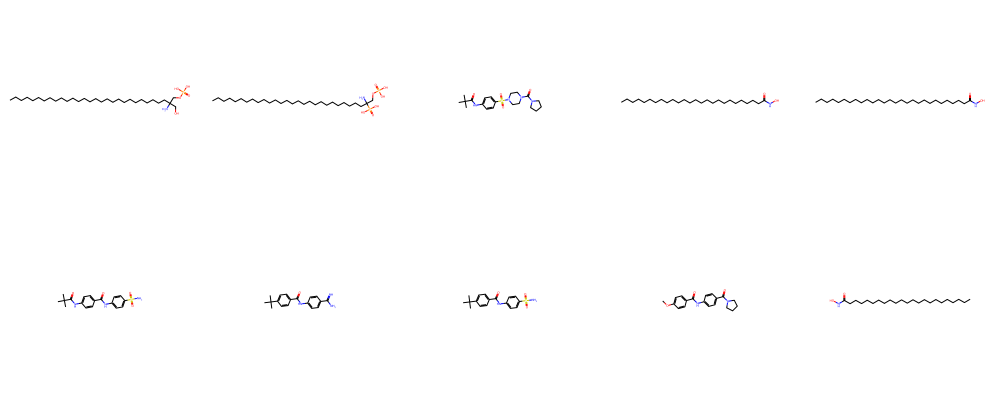

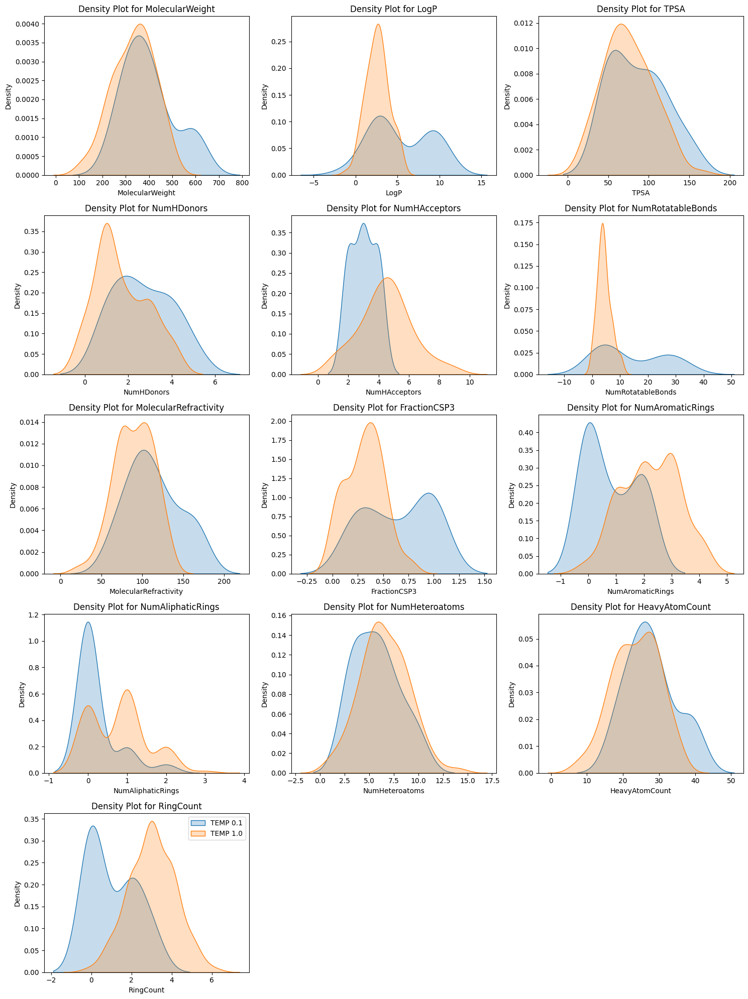

In [193]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=0.1)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 0.1')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()


  1%|          | 1/100 [00:16<26:55, 16.32s/it]

N[C@@H](CC(=O)N1CCN(C(=O)c2ccc(Cl)cc2)CC1)Cc1cc(F)c(F)cc1F


  2%|▏         | 2/100 [00:20<14:42,  9.00s/it]

COc1ccccc1N1CCN(CCCCNC(=O)c2ccc(-c3ccccc3)cc2)CC1.O=C(O)CCC(=O)O


  3%|▎         | 3/100 [00:23<10:09,  6.28s/it]

COc1ccccc1N1CCN(CCCCNC(=O)c2ccc(-n3ccnc3)cc2)CC1


  4%|▍         | 4/100 [00:25<07:31,  4.70s/it]

CN1CCC(N(C)S(=O)(=O)c2ccc(C#N)cc2)CC1


  5%|▌         | 5/100 [00:27<06:06,  3.85s/it]

COc1ccccc1N1CCN(CCCCNC(=O)c2ccccn2)CC1


  6%|▌         | 6/100 [00:30<05:27,  3.48s/it]

CCCCN1CCC[C@@H]1CNC(=O)c1cc(S(N)(=O)=O)ccc1OC


  7%|▋         | 7/100 [00:34<05:35,  3.61s/it]

CC(C)(C)OC(=O)C1C(=O)N2C(C(=O)[O-])=C(C)S(=O)(=O)[C@H]12.[Na+]


  8%|▊         | 8/100 [00:36<04:38,  3.02s/it]

CC(C)(C)NC(=O)NCCCCCC(=O)NO


  9%|▉         | 9/100 [00:38<04:11,  2.76s/it]

CCCN1CCC(COc2nc3ccccc3n3cccc23)CC1


 10%|█         | 10/100 [00:41<04:15,  2.84s/it]

COc1ccc(C(=O)Nc2ccc(C(=O)Nc3ccccc3C(=O)O)cc2)cc1


 11%|█         | 11/100 [00:44<04:25,  2.98s/it]

Cc1cccc(COc2ccc(C(=O)N[C@@H]3CCC[C@@H]3C(=O)NO)cc2)c1


 12%|█▏        | 12/100 [00:47<04:25,  3.02s/it]

COCCOc1ccc(S(=O)(=O)N2CCN(c3ncccn3)CC2C(=O)NO)cc1


 13%|█▎        | 13/100 [00:50<04:11,  2.89s/it]

C[C@@H]1CCCN1CCc1ccc2nc(-c3ccccc3)ccc2c1


 14%|█▍        | 14/100 [00:53<04:10,  2.91s/it]

CCN1CCC(c2ccc(Cl)c(Cl)c2)C(C(=O)NCC(=O)N(C)C)C1


 15%|█▌        | 15/100 [00:57<04:38,  3.28s/it]

CC(C)S(=O)(=O)NC[C@H]1CC[C@H](NC(=O)CN2CCN(c3cccc(Cl)c3Cl)CC2)CC1


 16%|█▌        | 16/100 [01:00<04:21,  3.12s/it]

CCN1CCN(CCCOc2ccc(C(=O)N(C)CCCC(=O)O)cc2)CC1


 17%|█▋        | 17/100 [01:02<03:48,  2.76s/it]

CCCN(CCC)[C@H]1CCc2ccc(O)cc2C1


 18%|█▊        | 18/100 [01:04<03:40,  2.68s/it]

COc1ccc2c(c1)CCN(CCCc1ccccc1)C2c1ccccc1


 19%|█▉        | 19/100 [01:07<03:50,  2.84s/it]

CC(C)(C)OC(=O)N1CCC(NC(=O)NC23CC4CC(CC(C4)C2)C3)CC1


 20%|██        | 20/100 [01:11<03:57,  2.97s/it]

CCCCCCCCCCCCCCCCCCC(CC(C)O)N1C(=O)[C@@H](N)C[C@H]1CO


 21%|██        | 21/100 [01:14<04:02,  3.07s/it]

CCCN(CCC)[C@@H]1CCc2cccc(C(=O)N3CCC[C@H]3C(=O)NO)c2C1


 22%|██▏       | 22/100 [01:17<03:50,  2.96s/it]

CN1CCC(c2c[nH]c3ccc(NC(=O)c4ccccc4)nc23)CC1


 23%|██▎       | 23/100 [01:21<04:08,  3.23s/it]

CCCCCCCCCC[C@H](O)/C=C/[C@H]1CCC(=O)N1CCCCCCCCCCCCCCCCC(=O)O


 24%|██▍       | 24/100 [01:23<03:49,  3.02s/it]

COc1ccc(C2(O)CCN(Cc3ccc4c(c3)OCO4)CC2)cc1


 25%|██▌       | 25/100 [01:25<03:18,  2.65s/it]

CC(C)CC(C(=O)NO)C(=O)NCC(C)C


 26%|██▌       | 26/100 [01:29<03:46,  3.06s/it]

CC(C)(Oc1ccc(Cl)cc1Cl)C(=O)N[C@H]1C2CC3CC1C[C@](S(N)(=O)=O)(C3)C2


 27%|██▋       | 27/100 [01:31<03:20,  2.74s/it]

CC(C)(C)OC(=O)NCCCCCCCCCC(=O)NO


 28%|██▊       | 28/100 [01:34<03:15,  2.72s/it]

CCN(CC)C(=O)c1ccc(C(c2ccccc2)N2CCNCC2)cc1


 29%|██▉       | 29/100 [01:36<03:08,  2.66s/it]

COc1ccc(C(C#Cc2ccc(C)cc2)c2ccc(C)cc2)cc1


 30%|███       | 30/100 [01:39<03:05,  2.65s/it]

CCCCNC(=O)OCCCc1c[nH]cn1.O=C(O)/C=C/C(=O)O


 31%|███       | 31/100 [01:40<02:42,  2.35s/it]

CC(C)(C)CC(=O)NCCn1ccnc1


 32%|███▏      | 32/100 [01:43<02:46,  2.45s/it]

CCN1CCN(CCCc2c[nH]c3ccc(-n4cnnc4)cc23)CC1


 33%|███▎      | 33/100 [01:47<03:08,  2.81s/it]

CC(C)[C@H](NS(=O)(=O)c1ccc2c(c1)oc1cc(Cl)c(Cl)cc12)C(=O)O


 34%|███▍      | 34/100 [01:50<03:13,  2.93s/it]

CCCCCOc1ccc(C(=O)C[n+]2ccc(OCCCOCCCOC)cc2)cc1.[Br-]


 35%|███▌      | 35/100 [01:53<03:17,  3.04s/it]

CCCn1c(=O)c2c(nc(/C=C/c3ccc(OC)c(OC)c3)n2C)n(CCC)c1=O


 36%|███▌      | 36/100 [01:57<03:24,  3.20s/it]

O=C(O)CN1C(=O)[C@@H](N[C@@H](CCc2ccccc2)C(=O)O)CSS1(=O)=O


 37%|███▋      | 37/100 [02:00<03:17,  3.14s/it]

CS(=O)(=O)Nc1ccc(Oc2ccc(S(=O)(=O)CC3CS3)cc2)cc1


 38%|███▊      | 38/100 [02:03<03:18,  3.20s/it]

CC(C)(C)CN(Cc1ccc(F)cc1Cl)C1CCNCC1.O=C(O)/C=C/C(=O)O


 39%|███▉      | 39/100 [02:06<03:05,  3.05s/it]

COc1ccc(Nc2nc(C)cn([C@H](C)C3CC3)c2=O)cc1OC


 40%|████      | 40/100 [02:08<02:52,  2.87s/it]

CN1CCN(c2ccc(Nc3ncc4ccccc4n3)c(N)c2)CC1


 41%|████      | 41/100 [02:11<02:37,  2.67s/it]

COc1ccc(CN2CCc3cc(OC)c(OC)cc3C2)cc1


 42%|████▏     | 42/100 [02:13<02:38,  2.72s/it]

CC(=O)N1CCC(NC(=O)NC2CCC(Oc3ccc(F)cc3)CC2)CC1


 43%|████▎     | 43/100 [02:16<02:25,  2.56s/it]

CCCc1nc(CC)c2c(C)nc3ccc(OC)nc3n12


 44%|████▍     | 44/100 [02:19<02:30,  2.69s/it]

COC(=O)[C@@H]1C[C@H](N(C)C(=O)CC(C)C)C(=O)C(C)C


 45%|████▌     | 45/100 [02:21<02:25,  2.65s/it]

CC(C)(C)c1ccc(C(=O)Nc2cc(C3CC3)[nH]n2)cc1


 46%|████▌     | 46/100 [02:24<02:26,  2.71s/it]

COc1ccccc1N1CCN(CCCCN2C(=O)CC3(CCCC3)CC2=O)CC1


 47%|████▋     | 47/100 [02:26<02:18,  2.61s/it]

CC(C)CCCNC(=O)c1ccc(NC(=O)c2ccccc2)cc1


 48%|████▊     | 48/100 [02:29<02:17,  2.64s/it]

CCCCCCCCCCCC(C(=O)NO)S(=O)(=O)c1ccc(OC)cc1


 49%|████▉     | 49/100 [02:32<02:18,  2.72s/it]

CCCOCCn1c(=O)c(NCCO)nc2cnc(-c3ccc(OC)nc3)cc21


 50%|█████     | 50/100 [02:34<02:06,  2.53s/it]

Cc1ccc(C)c(C(=O)NCC(=O)N2CCCC2)c1


 51%|█████     | 51/100 [02:37<02:09,  2.65s/it]

CCCCCCCOc1ccc(NC(=O)NC2CCN(Cc3ccc(F)cc3)CC2)cc1


 52%|█████▏    | 52/100 [02:39<01:58,  2.48s/it]

CC(C)(C)NCC(O)COc1cccc2ccc(O)cc12


 53%|█████▎    | 53/100 [02:41<01:46,  2.27s/it]

CCCCCCCCCCCCCOC(=O)C(F)(F)F


 54%|█████▍    | 54/100 [02:43<01:40,  2.19s/it]

CCCCCOc1ccc(NC(=O)NC2CCCCC2)cc1


 55%|█████▌    | 55/100 [02:46<01:54,  2.54s/it]

CC(C)(C)c1ccc(S(=O)(=O)N2CCC(C(=O)NCc3ccccc3)CC2)cc1


 56%|█████▌    | 56/100 [02:49<01:52,  2.55s/it]

Nc1nc2c(cnn2CCN2CCOCC2)c2nc(-c3ccco3)nn12


 57%|█████▋    | 57/100 [02:51<01:49,  2.56s/it]

CCCCN(CC)c1nc(C)nc2c1nnn2-c1c(C)cc(C)cc1C


 58%|█████▊    | 58/100 [02:53<01:41,  2.42s/it]

CC(C)(C)OC(=O)N[C@H](C=O)C(F)(F)F


 59%|█████▉    | 59/100 [02:56<01:42,  2.49s/it]

CCC(CC)Nc1nc(C)nc2c1nnn2-c1ccc(C(C)C)cc1Br


 60%|██████    | 60/100 [02:59<01:42,  2.56s/it]

CC(C)(C)OC(=O)C1C(c2ccc(O)cc2)CC2CCC1N2CCCF


 61%|██████    | 61/100 [03:01<01:39,  2.56s/it]

COc1ccc(CN2CCC(N(C)C(=O)C3CCCCC3)CC2)cc1


 62%|██████▏   | 62/100 [03:04<01:34,  2.49s/it]

CCCCCOc1cc(Cc2cnc(N)nc2N)cc(OCCC)c1OC


 63%|██████▎   | 63/100 [03:07<01:46,  2.88s/it]

COc1ccccc1N1CCN(CCCNC(=O)/C=C/c2ccc(Cl)cc2)CC1.O=C(O)CCC(=O)O


 64%|██████▍   | 64/100 [03:11<01:52,  3.12s/it]

CC(C)CN(C(=O)c1ccc(C(=N)N)cc1)C(C)(C)C(=O)N(CC(=O)O)CC1CCC1


 65%|██████▌   | 65/100 [03:14<01:49,  3.14s/it]

COc1ccc(CN(C)C(=O)c2ccc(-c3ccc(C(=O)O)cc3)cc2)cc1


 66%|██████▌   | 66/100 [03:17<01:40,  2.94s/it]

CC(C)CC1(C(=O)NCc2ccc(F)cc2)CCCN1CC1CC1


 67%|██████▋   | 67/100 [03:19<01:29,  2.70s/it]

CC(C)NC(=O)N1CCC(C#N)(c2ccccc2)CC1


 68%|██████▊   | 68/100 [03:21<01:23,  2.60s/it]

N#Cc1ccc(C(=O)N2CCC(CNc3ccccn3)CC2)cc1


 69%|██████▉   | 69/100 [03:24<01:22,  2.67s/it]

COc1cccc(NC(=O)NCCN2CCN(c3cccc(Cl)c3Cl)CC2)c1


 70%|███████   | 70/100 [03:27<01:21,  2.70s/it]

CC(C)(C)N(Cc1ccccc1)c1ccc(C(C)(C)C(=O)O)cc1


 71%|███████   | 71/100 [03:30<01:25,  2.96s/it]

CC(C)(C)c1cc(NC(=O)NCc2ccc(Cl)cc2)cc(S(=O)(=O)N2CCOCC2)c1


 72%|███████▏  | 72/100 [03:34<01:24,  3.02s/it]

CC(C)(C)c1ccc(S(=O)(=O)N2CCC(C(=O)NC3CCCCC3)CC2)cc1


 73%|███████▎  | 73/100 [03:37<01:22,  3.04s/it]

CC(C)C[C@H](NC(=O)[C@@H](S)Cc1ccccc1)C(=O)NCC(=O)O


 74%|███████▍  | 74/100 [03:40<01:16,  2.95s/it]

Cc1cccc(Nc2ncnc3ccc(OCCCN4CCC(O)CC4)cc23)c1


 75%|███████▌  | 75/100 [03:42<01:13,  2.93s/it]

CC(C)CN1CCC(N(C)C(=O)NCc2ccc(Cl)c(Cl)c2)CC1


 76%|███████▌  | 76/100 [03:44<01:03,  2.65s/it]

COc1ccc(C(=O)NCCCCCCC(=O)NO)cc1


 77%|███████▋  | 77/100 [03:47<01:02,  2.72s/it]

COc1ccccc1N1CCN(CCCCN2C(=O)CC3(CCCC3)CC2=O)CC1


 78%|███████▊  | 78/100 [03:50<01:00,  2.73s/it]

O=C(Nc1ccccc1)Nc1ccc2c(c1)CC(CC(=O)O)C(=O)N2


 79%|███████▉  | 79/100 [03:52<00:54,  2.57s/it]

CN1CCN(Cc2ccc(C(=O)N3CCCCC3)cc2)CC1


 80%|████████  | 80/100 [03:55<00:50,  2.55s/it]

COc1ccc(Nc2nc(N)n(-c3ccccc3)n2)c(OC)c1


 81%|████████  | 81/100 [03:59<00:57,  3.03s/it]

CCc1ccc(Cc2cc([C@@H]3S[C@H](CO)[C@@H](O)[C@H](O)[C@H]3O)ccc2Cl)cc1


 82%|████████▏ | 82/100 [04:01<00:51,  2.89s/it]

O=C1CCCC(=O)N1CCCCN1CCN(c2cccc(Cl)c2)CC1


 83%|████████▎ | 83/100 [04:04<00:46,  2.74s/it]

CC(=O)N1CCC(c2nc(-c3ccc(Cl)cc3)no2)CC1


 84%|████████▍ | 84/100 [04:07<00:45,  2.85s/it]

COc1ccc(N2CCN(CCCCCCN3C(=O)CC4(CCCC4)CC3=O)CC2)cc1


 85%|████████▌ | 85/100 [04:10<00:41,  2.79s/it]

CCCCN(CC)c1nc(C)nc2c1nnn2-c1c(C)cc(C)cc1C


 86%|████████▌ | 86/100 [04:13<00:39,  2.84s/it]

CC(C)C(NC(=O)CNC(=O)c1cc2cc(Cl)ccc2[nH]1)C(=O)O


 87%|████████▋ | 87/100 [04:14<00:32,  2.51s/it]

CCC(=O)NCCCc1cccc2nc(C)oc12


 88%|████████▊ | 88/100 [04:17<00:30,  2.55s/it]

CN(C)C(=O)c1ccc(-c2cnc(N)c(N3CCCCC3)c2)cc1


 89%|████████▉ | 89/100 [04:19<00:25,  2.35s/it]

COc1ccc(N2C(=O)CC(=O)NC2=O)cc1


 90%|█████████ | 90/100 [04:21<00:23,  2.30s/it]

COc1cccc(CN2CCN(c3cccc(Cl)c3)CC2)c1


 91%|█████████ | 91/100 [04:23<00:19,  2.21s/it]

CC(C)(C)NC(=O)C(=O)NCCCCC(=O)NO


 92%|█████████▏| 92/100 [04:28<00:23,  2.96s/it]

COc1ccccc1N1CCN(CCCCNC(=O)/C=C/c2ccc(/C=C/C(=O)NO)cc2)CC1.O=C(O)CCC(=O)O


 93%|█████████▎| 93/100 [04:31<00:22,  3.19s/it]

CCCCN1CCC(COC(=O)c2cc(C(=O)NCc3ccccc3Cl)c(OC)c3ccccc23)CC1


 94%|█████████▍| 94/100 [04:33<00:16,  2.82s/it]

CC(C)(C)NCC(O)CON=C(C1CC1)C1CC1


 95%|█████████▌| 95/100 [04:36<00:14,  2.87s/it]

CCOC(=O)c1cc(C)c(Oc2ccc(C(=O)N3CCCC3)cc2)c(C)c1


 96%|█████████▌| 96/100 [04:41<00:13,  3.28s/it]

CC(=O)Oc1ccc(N2C(=O)[C@H]3[C@H](O)[C@H](c4ccc(O)cc4)[C@H]3C2=O)cc1


 97%|█████████▋| 97/100 [04:43<00:08,  2.90s/it]

COc1ccc(C(=O)NN2C(=O)C=CC2=O)cc1


 98%|█████████▊| 98/100 [04:46<00:06,  3.02s/it]

Cc1ccc2c(c1)CN(C(=O)Nc1ccc(OCc3cccc(C(=N)N)c3)cc1)C2


 99%|█████████▉| 99/100 [04:50<00:03,  3.25s/it]

COc1ccc(S(=O)(=O)N(Cc2ccc(C(=N)N)cc2)[C@@H](C(=O)NO)C(C)C)cc1


100%|██████████| 100/100 [04:52<00:00,  2.92s/it]

CN1CCN(C2=Nc3ccccc3Oc3ccccc32)CC1



Percent valid: 99.000%
Percent unique: 80.808%
['COc1ccc(N2C(=O)CC(=O)NC2=O)cc1', 'COc1ccc(CN(C)C(=O)c2ccc(-c3ccc(C(=O)O)cc3)cc2)cc1', 'CCOC(=O)c1cc(C)c(Oc2ccc(C(=O)N3CCCC3)cc2)c(C)c1', 'CCCCCCCCCC[C@H](O)/C=C/[C@H]1CCC(=O)N1CCCCCCCCCCCCCCCCC(=O)O', 'CCCCCCCCCCCC(C(=O)NO)S(=O)(=O)c1ccc(OC)cc1', 'CC(C)CN1CCC(N(C)C(=O)NCc2ccc(Cl)c(Cl)c2)CC1', 'CC(C)(Oc1ccc(Cl)cc1Cl)C(=O)N[C@H]1C2CC3CC1C[C@](S(N)(=O)=O)(C3)C2', 'CC(=O)N1CCC(NC(=O)NC2CCC(Oc3ccc(F)cc3)CC2)CC1', 'CCCCCOc1ccc(NC(=O)NC2CCCCC2)cc1', 'CC(C)(C)c1ccc(S(=O)(=O)N2CCC(C(=O)NCc3ccccc3)CC2)cc1', 'COc1ccc(C(=O)NCCCCCCC(=O)NO)cc1', 'CCN1CCC(c2ccc(Cl)c(Cl)c2)C(C(=O)NCC(=O)N(C)C)C1', 'Cc1cccc(Nc2ncnc3ccc(OCCCN4CCC(O)CC4)cc23)c1', 'CCCCCOc1cc(Cc2cnc(N)nc2N)cc(OCCC)c1OC', 'COc1ccc(C(C#Cc2ccc(C)cc2)c2ccc(C)cc2)cc1', 'CCN1CCN(CCCc2c[nH]c3ccc(-n4cnnc4)cc23)CC1', 'COc1ccc(N2CCN(CCCCCCN3C(=O)CC4(CCCC4)CC3=O)CC2)cc1', 'COc1ccccc1N1CCN(CCCCNC(=O)/C=C/c2ccc(/C=C/C(=O)NO)cc2)CC1.O=C(O)CCC(=O)O', 'CCCCN1CCC[C@@H]1CNC(=O)c1cc(S(N)(=O)=O)ccc1OC', 'CCc1

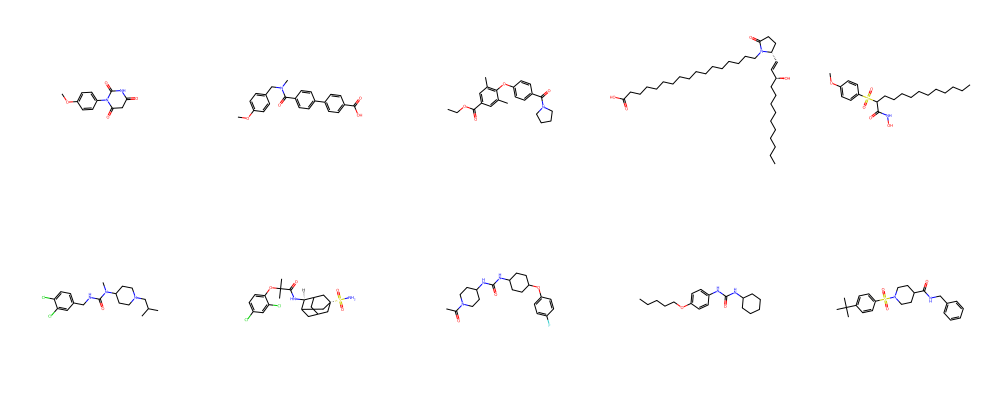

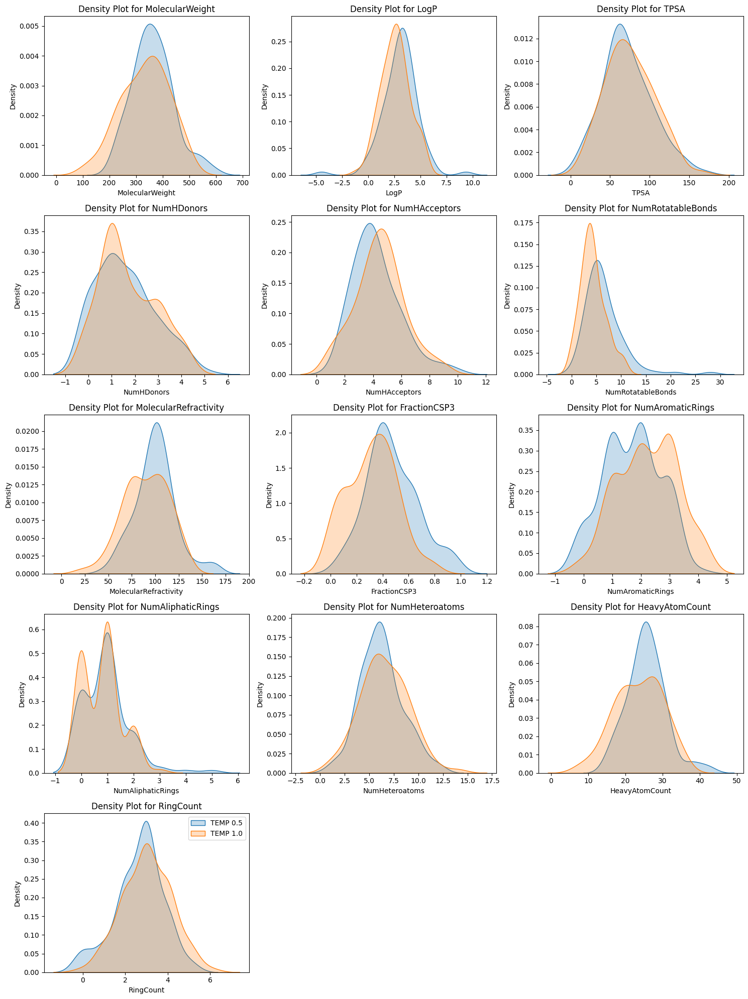

In [194]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=0.5)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 0.5')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()


  1%|          | 1/100 [00:14<24:44, 15.00s/it]

COc1ccc(CC2=NNC(=O)/C2=N\Nc2ccc(Cl)cc2)cc1


  2%|▏         | 2/100 [00:17<12:09,  7.44s/it]

COc1ccc2oc(-c3cccc(C#N)c3)cc(=O)c2c1


  3%|▎         | 3/100 [00:19<08:09,  5.04s/it]

Oc1ccc(-c2nnc3ccc(OCc4ccccc4)nn23)cc1


  4%|▍         | 4/100 [00:21<06:05,  3.80s/it]

CC(C)CCC(NCCc1c[nH]cn1)P(=O)(O)O


  5%|▌         | 5/100 [00:24<05:26,  3.43s/it]

CCCCn1c(=O)c2nc(-c3ccc(N(C)C)cc3)[nH]c2n(C)c1=O


  6%|▌         | 6/100 [00:26<04:58,  3.17s/it]

CC(C)(C)c1nc(C(=O)NCc2ccc(F)cc2)c(O)c(=O)n1C


  7%|▋         | 7/100 [00:29<04:40,  3.01s/it]

COc1ccc(S(=O)(=O)N2CCC(C)(COc3ccccc3)CC2)cc1


  8%|▊         | 8/100 [00:31<04:03,  2.65s/it]

O=C1COc2cc(C(=O)N3CCOCC3)ccc2N1


  9%|▉         | 9/100 [00:33<03:55,  2.59s/it]

CC(C)(C)NCC(O)COC(=O)c1c[nH]c2ccc(Cl)cc12


 10%|█         | 10/100 [00:35<03:39,  2.44s/it]

COc1ccc(CN2CCC3(CCc4ccccc43)CC2)cc1


 11%|█         | 11/100 [00:38<03:33,  2.40s/it]

Cc1nc(N2CCCCC2)c2[nH]c(-c3ccccc3)cc2n1


 12%|█▏        | 12/100 [00:39<03:07,  2.14s/it]

O=C(CC(O)C(=O)O)c1ccccc1


 13%|█▎        | 13/100 [00:42<03:19,  2.29s/it]

Cc1ccc(CC(=O)N2CCN(c3ncnc4[nH]ccc34)CC2)cc1


 14%|█▍        | 14/100 [00:45<03:52,  2.71s/it]

CCCc1nc2cc(CC(=O)O)ccc2c(=O)n1Cc1ccc(-c2ccccc2-c2nn[nH]n2)cc1


 15%|█▌        | 15/100 [00:49<04:10,  2.95s/it]

O=C(O)CN1C(=O)[C@@H](N[C@@H](CCc2ccccc2)C(=O)O)CCc2ccccc21


 16%|█▌        | 16/100 [00:50<03:26,  2.46s/it]

CC(CO)NCc1cc(Cl)ccc1O


 17%|█▋        | 17/100 [00:53<03:23,  2.45s/it]

Cc1cc(=O)oc2cc(OCc3nc4ccccc4[nH]3)ccc12


 18%|█▊        | 18/100 [00:55<03:25,  2.50s/it]

CC(C(=O)NC(C)(C)c1ccccc1)NCC(O)c1cc(Br)cs1


 19%|█▉        | 19/100 [00:57<03:09,  2.34s/it]

Cc1ccc(S(=O)(=O)NCCCCC(=O)NO)cc1


 20%|██        | 20/100 [01:01<03:39,  2.74s/it]

COc1ccc(Cl)cc1N1CCN(CCN(C(=O)Cc2cc(Cl)cc(Cl)c2OC)c2ccccn2)CC1


 21%|██        | 21/100 [01:04<03:33,  2.71s/it]

CN1CCN(c2ccc(NC(=O)c3ccc(C#N)[nH]c3)cc2)CC1


 22%|██▏       | 22/100 [01:06<03:27,  2.66s/it]

COC(=O)C1C2CC3CCC1N3C/C2=C\c1ccc(F)c(Cl)c1


 23%|██▎       | 23/100 [01:08<03:09,  2.45s/it]

CCCc1cc(Cc2cnc(N)nc2N)cc(CC)c1OC


 24%|██▍       | 24/100 [01:10<02:59,  2.36s/it]

C[C@H](N)Cc1c2c(c(Br)c3c1OCC3)OCC2


 25%|██▌       | 25/100 [01:11<02:25,  1.93s/it]

CCCC(CCC)C(=O)O


 26%|██▌       | 26/100 [01:13<02:29,  2.02s/it]

COc1ccc(Cn2c(=O)cc(N3CCOCC3)nc2C)cc1


 27%|██▋       | 27/100 [01:16<02:42,  2.23s/it]

CCCOCCn1c(=O)c(NCCN2CCCC2)c(=O)[nH]c2ncccc21


 28%|██▊       | 28/100 [01:19<02:58,  2.48s/it]

CCCC[C@@H]1C(=O)NCCN1C(=O)C[C@H](N)Cc1cc(F)c(F)cc1F


 29%|██▉       | 29/100 [01:22<03:04,  2.60s/it]

O=C(O)CNC(=O)c1ccc(-c2cnc(Oc3cccc(F)c3)cc2)cc1


 30%|███       | 30/100 [01:26<03:33,  3.05s/it]

CC1(c2nc(C(=O)NCc3ccc(F)cc3)c(O)c(=O)n2C)CCN(CC(=O)N(C)c2ccccc2)CC1


 31%|███       | 31/100 [01:28<03:02,  2.65s/it]

CN1CCC[C@@H](c2cccc(Cl)c2)C1


 32%|███▏      | 32/100 [01:30<02:47,  2.46s/it]

COc1cc[nH]c1/C=C1\C(=O)Nc2ccccc21


 33%|███▎      | 33/100 [01:33<03:05,  2.77s/it]

Cc1ccc(C(=O)N2CCN(c3ncc(C(O)(C(F)(F)F)C(F)(F)F)s3)CC2)cc1C


 34%|███▍      | 34/100 [01:35<02:44,  2.49s/it]

CCC(=O)Nc1ccc(Sc2ccc(F)cc2)cc1


 35%|███▌      | 35/100 [01:38<02:52,  2.65s/it]

Cc1cc(C)cc(S(=O)(=O)N2CCC(C(=O)NCc3ccccc3)CC2)c1


 36%|███▌      | 36/100 [01:40<02:41,  2.52s/it]

O=C(Nc1cccc(O)c1)Nc1cccc(N2CCOCC2)c1


 37%|███▋      | 37/100 [01:44<02:59,  2.85s/it]

CCCn1c(=O)c2[nH]c(-c3ccc(OCC(=O)Nc4ccccc4C)cc3)cc2n(CCC)c1=O


 38%|███▊      | 38/100 [01:46<02:45,  2.67s/it]

Cc1ccc(Nc2nc(Nc3ccccc3)ncc2C(N)=O)cc1


 39%|███▉      | 39/100 [01:50<03:05,  3.04s/it]

CC1(C)CC(NC(N)=O)C(=O)N1Cc1nc(C(=O)NCc2ccc(F)cc2)c(O)c(=O)n1C


 40%|████      | 40/100 [01:52<02:43,  2.72s/it]

CCN1c2ncccc2C(=O)N(C)c2cccnc21


 41%|████      | 41/100 [01:54<02:22,  2.42s/it]

CCOc1ncc(C(=O)OC)cc1C(=O)OC


 42%|████▏     | 42/100 [01:57<02:36,  2.70s/it]

CCN(CC)S(=O)(=O)NCCc1cccc2nc(NC(=O)c3ccc4ccccc4c3)oc12


 43%|████▎     | 43/100 [02:01<02:42,  2.85s/it]

CCc1cc(C)c(OCC(OC)CC2CCN(C(=O)CCc3ccccc3)CC2)c(C)c1


 44%|████▍     | 44/100 [02:03<02:38,  2.83s/it]

Cc1ccc(Nc2nccc(-c3c(N)nc(N)nc3CC4CCCC4)n2)cc1


 45%|████▌     | 45/100 [02:06<02:33,  2.79s/it]

CSCC[C@@H](NC(=O)[C@@H](CS)Cc1ccccc1)C(=O)O


 46%|████▌     | 46/100 [02:08<02:22,  2.64s/it]

O=C(NCc1cccc(C(F)(F)F)c1)[C@@H]1CCCS1


 47%|████▋     | 47/100 [02:12<02:31,  2.86s/it]

Cc1c2c([nH]c(=O)n(C)c1=O)CC(=O)N(Cc1ccc(Oc3ccccc3)cc1)C2


 48%|████▊     | 48/100 [02:15<02:38,  3.05s/it]

CC(C)[C@H](NC(=O)Cc1cccc2ccccc12)C(=O)N[C@H](C=O)Cc1ccccc1


 49%|████▉     | 49/100 [02:18<02:36,  3.07s/it]

CCOC(=O)c1ccc2nc(-c3ccc(C)c([N+](=O)[O-])c3)ccc2c1


 50%|█████     | 50/100 [02:20<02:20,  2.82s/it]

CN(CCOc1ccc(S(=O)(=O)O)cc1)CCN1CCCC1


 51%|█████     | 51/100 [02:22<02:01,  2.48s/it]

COc1ccc2scc(CCCNC(C)=O)c2c1


 52%|█████▏    | 52/100 [02:25<01:58,  2.47s/it]

O=C(O)c1cc(F)c2cnccc2c1Oc1ccc2c(c1)CCCC2


 53%|█████▎    | 53/100 [02:28<02:08,  2.72s/it]

CC[C@@H](C)[C@H](Nc1nc(N)nc2c1ncn2-c1ccc(F)cc1)C(=O)NC


 54%|█████▍    | 54/100 [02:30<02:01,  2.65s/it]

Nc1nc(N)c2cc(COCc3cccc(C(F)(F)F)c3)ccc2n1


 55%|█████▌    | 55/100 [02:33<01:54,  2.53s/it]

O=C(O)c1ccc(Nc2nnc(S)n2Nc2ccccc2F)cc1


 56%|█████▌    | 56/100 [02:36<02:07,  2.90s/it]

COc1ccc(S(=O)(=O)N(Cc2ccc(C(=N)N)cc2)[C@H](C(=O)NO)C(C)C)cc1


 57%|█████▋    | 57/100 [02:40<02:13,  3.10s/it]

COc1ccccc1N1CCN(CCCCNC(=O)C2CCCc3ccccc32)CC1.O=C(O)CCC(=O)O


 58%|█████▊    | 58/100 [02:42<01:57,  2.81s/it]

O=C1NCC2(CNC2)c2c(ccc3ccc(F)cc32)O1


 59%|█████▉    | 59/100 [02:45<01:51,  2.71s/it]

C[C@@H](NC(=O)c1cc2cc(Cl)ccc2[nH]1)C(=O)O


 60%|██████    | 60/100 [02:48<01:52,  2.81s/it]

O=C(NCc1ccc([N+](=O)[O-])cc1)c1cnc2ccc(Cl)cn2c1=O


 61%|██████    | 61/100 [02:50<01:46,  2.72s/it]

CCOc1ccc(C(=O)Nc2oc3ccccc3c2C(=O)NCC)cc1


 62%|██████▏   | 62/100 [02:53<01:47,  2.84s/it]

CN1CC[C@@]2(C)c3cc(OC(=O)Nc4ccccc4)ccc3N(C)[C@@H]12


 63%|██████▎   | 63/100 [02:56<01:40,  2.71s/it]

NC(=O)c1ccc(-c2cncc(O[C@@H]3CCNC3)c2)cc1


 64%|██████▍   | 64/100 [02:59<01:41,  2.83s/it]

COc1cccc(Nc2ncc(CN3CCC(N(Cc4ccccc4)CCO)CC3)cc2Cl)c1


 65%|██████▌   | 65/100 [03:02<01:44,  2.99s/it]

O=C(NC1C2CC3CC(C2)CC1C3)C(O)(c1ccccc1)C1CCN(CC2CCC2)CC1


 66%|██████▌   | 66/100 [03:03<01:23,  2.46s/it]

COc1ccc(CCC(C)N)cc1


 67%|██████▋   | 67/100 [03:05<01:13,  2.21s/it]

COc1cccc2c1CC[C@H](N)C2.Cl


 68%|██████▊   | 68/100 [03:07<01:12,  2.26s/it]

CN1C(=O)C(NC(=O)Cc2ccc(Cl)cc2)c2ccccc21


 69%|██████▉   | 69/100 [03:10<01:17,  2.49s/it]

Cc1nc(COc2ccc(S(=O)(=O)c3ccc(OC(F)(F)F)cc3)cc2)cs1


 70%|███████   | 70/100 [03:13<01:14,  2.48s/it]

CC(C)[C@H](NS(=O)(=O)CCCCc1ccccc1)C(=O)NO


 71%|███████   | 71/100 [03:15<01:10,  2.42s/it]

Cc1cccc(-c2c[nH]c(SCCc3c[nH]cn3)n2)n1


 72%|███████▏  | 72/100 [03:18<01:09,  2.47s/it]

COc1ccc(CSc2cc(C)ccc2C(=O)NCCCCC(=O)O)cc1


 73%|███████▎  | 73/100 [03:21<01:13,  2.73s/it]

Cn1cc(Nc2ncc3cnn([C@@H]4C[C@H]5C[C@H]5C4)c3n2)cc1C(N)=O


 74%|███████▍  | 74/100 [03:28<01:43,  3.97s/it]

COc1ccc(C(=O)Nc2nnc(S(N)(=O)=O)s2)cc1


 75%|███████▌  | 75/100 [03:32<01:41,  4.06s/it]

CCc1c(Oc2ccc(C)cc2)n(CCS(=O)(=O)c2ccc(Cl)cc2)c(=O)[nH]c1=O


 76%|███████▌  | 76/100 [03:36<01:36,  4.01s/it]

Cc1cccc(C#Cc2cncc(SCC(=O)N2C[C@@H]3CCN3C2)c2ccccc2)n1


 77%|███████▋  | 77/100 [03:39<01:27,  3.81s/it]

CC(C)C[C@@H](C=O)NC(=O)[C@@H](C)NC(=O)CN(O)C=O


 78%|███████▊  | 78/100 [03:44<01:28,  4.00s/it]

N#C[C@@H]1CCCN1C(=O)[C@@H](N)CC(=O)N1CCC[C@H]1C(=O)NCc1ccccc1


 79%|███████▉  | 79/100 [03:48<01:21,  3.89s/it]

Br.Cl.Fc1ccc(CN2CCC(NC(=O)c3ccc(C)c(C)c3)CC2)cc1


 80%|████████  | 80/100 [03:51<01:14,  3.73s/it]

O=C(NCC1CCN(CC[C@H](O)C3CCCCC3)CC1)c1ccc(F)cc1


 81%|████████  | 81/100 [03:55<01:15,  3.98s/it]

C[C@@H](NC(=O)c1cc(C(=O)O)[nH]c1-c1nc(-c2ccccn2)no1)c1ccc(F)cc1


 82%|████████▏ | 82/100 [04:00<01:13,  4.07s/it]

Cc1ccc(S(=O)(=O)Nc2ccc(-c3cccc(C(=O)N4CCC(CN)C4)c3)cc2)cc1


 83%|████████▎ | 83/100 [04:01<00:56,  3.33s/it]

CC(C)(C)NCC(O)c1cccs1


 84%|████████▍ | 84/100 [04:04<00:49,  3.12s/it]

COc1ccc(C2=C(c3cccnc3)CC3CCC2N3C)cc1


 85%|████████▌ | 85/100 [04:07<00:45,  3.04s/it]

CC(C)(C)NCC(=O)N1[C@@H](C#N)CC[C@H]1C#N


 86%|████████▌ | 86/100 [04:11<00:48,  3.47s/it]

CN1C(=O)N(c2nncc(-c3ccc(N4CCCCC4)nc3)n2)C[C@H]1C(=O)NCc1ccccc1


 87%|████████▋ | 87/100 [04:15<00:45,  3.50s/it]

CCOC(=O)c1cccc(-c2ccc(C(=N)N)c(C(F)(F)F)c2)c1.Cl


 88%|████████▊ | 88/100 [04:20<00:48,  4.02s/it]

Cc1cnc2[nH]c(Cc3cc([C@@H]4O[C@H](CO)[C@@H](O)[C@H](O)[C@H]4O)cc3C)nc2c1


 89%|████████▉ | 89/100 [04:22<00:37,  3.42s/it]

Oc1nc2ccccc2n1-c1nc2ccccc2o1


 90%|█████████ | 90/100 [04:25<00:33,  3.39s/it]

CC(C)(C)[C@H](NC(=O)Cc1ccccc1)C(=O)N(C)N1CCCC1


 91%|█████████ | 91/100 [04:29<00:30,  3.42s/it]

O=C(NO)[C@@H]1CCC[C@H]1S(=O)(=O)Nc1ccc2c(c1)OCO2


 92%|█████████▏| 92/100 [04:32<00:26,  3.29s/it]

CN1CCc2cc(O)cc3c2[C@H]1Cc1ccc(O)c(O)c1-3


 93%|█████████▎| 93/100 [04:35<00:23,  3.37s/it]

CCCCOc1ccc(CNC(=O)NCC(O)COc2ccc3[nH]c(OC)cc3c2)cc1


 94%|█████████▍| 94/100 [04:38<00:18,  3.09s/it]

CC1(C)CC1C(=O)N/C(=C\CCCCCO)C(=O)O


 95%|█████████▌| 95/100 [04:41<00:14,  2.97s/it]

O=c1cc(C(F)(F)F)cc(Nc2ccc(F)cc2F)[nH]1


 96%|█████████▌| 96/100 [04:44<00:12,  3.20s/it]

O=C(Nc1ccccc1)Nc1ccc2c(c1)C(=O)c1c-2nc(O)c2ccccc12


 97%|█████████▋| 97/100 [04:48<00:10,  3.49s/it]

CC(C)[C@@H](Nc1c(Nc2cccc(C(=O)N3CCCC3)c2O)c(=O)c1=O)C(N)=O


 98%|█████████▊| 98/100 [04:52<00:07,  3.53s/it]

COc1ccc(S(=O)(=O)N(Cc2cccs2)[C@H](C(=O)NO)C(C)C)cc1


 99%|█████████▉| 99/100 [04:54<00:03,  3.09s/it]

COc1ccc2c(c1)CCC(CNC(C)=O)C2


100%|██████████| 100/100 [04:57<00:00,  2.98s/it]

CC(C)Cc1ccc(-c2nc(C#N)cc(C#N)c2C(F)(F)F)cc1

Percent valid: 95.000%
Percent unique: 88.421%
['COc1cccc2c1CC[C@H](N)C2.Cl', 'O=C(NCC1CCN(CC[C@H](O)C3CCCCC3)CC1)c1ccc(F)cc1', 'O=C1COc2cc(C(=O)N3CCOCC3)ccc2N1', 'COc1ccc(CC2=NNC(=O)/C2=N\\Nc2ccc(Cl)cc2)cc1', 'COc1ccc2oc(-c3cccc(C#N)c3)cc(=O)c2c1', 'CCCC[C@@H]1C(=O)NCCN1C(=O)C[C@H](N)Cc1cc(F)c(F)cc1F', 'CC[C@@H](C)[C@H](Nc1nc(N)nc2c1ncn2-c1ccc(F)cc1)C(=O)NC', 'CC(C)CCC(NCCc1c[nH]cn1)P(=O)(O)O', 'Cc1nc(COc2ccc(S(=O)(=O)c3ccc(OC(F)(F)F)cc3)cc2)cs1', 'CC(C)(C)NCC(O)c1cccs1', 'COc1ccc2c(c1)CCC(CNC(C)=O)C2', 'O=C(Nc1ccccc1)Nc1ccc2c(c1)C(=O)c1c-2nc(O)c2ccccc12', 'CCCC(CCC)C(=O)O', 'NC(=O)c1ccc(-c2cncc(O[C@@H]3CCNC3)c2)cc1', 'COc1ccc(Cn2c(=O)cc(N3CCOCC3)nc2C)cc1', 'CCC(=O)Nc1ccc(Sc2ccc(F)cc2)cc1', 'CC(C(=O)NC(C)(C)c1ccccc1)NCC(O)c1cc(Br)cs1', 'CCN(CC)S(=O)(=O)NCCc1cccc2nc(NC(=O)c3ccc4ccccc4c3)oc12', 'CN1CCc2cc(O)cc3c2[C@H]1Cc1ccc(O)c(O)c1-3', 'CN1CCC[C@@H](c2cccc(Cl)c2)C1', 'CC1(c2nc(C(=O)NCc3ccc(F)cc3)c(O)c(=O)n2C)CCN(CC(=O)N(C)c2ccccc2)CC1', 'CC

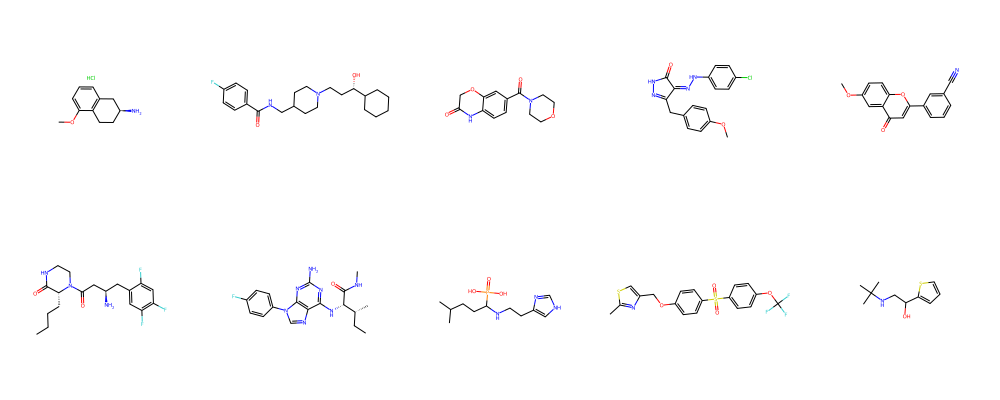

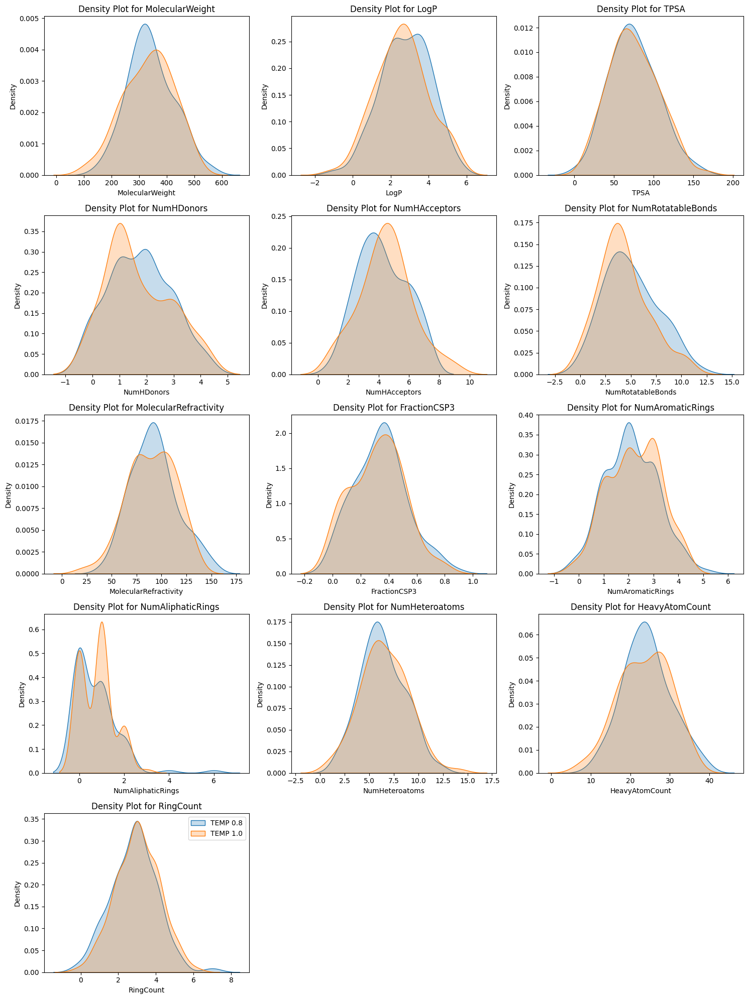

In [196]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=0.8)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 0.8')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

  1%|          | 1/100 [00:15<24:54, 15.09s/it]

O=C1C(=O)N(c2ccc3c(c2)OCCO3)c2ccccc21


  2%|▏         | 2/100 [00:17<12:03,  7.38s/it]

COC(=O)c1ccc(O)c(Oc2ccc(OC)cc2)c1


  3%|▎         | 3/100 [00:18<07:33,  4.68s/it]

COc1cc(C[C@H](N)CO)ccc1O


  4%|▍         | 4/100 [00:22<06:55,  4.32s/it]

COc1ccccc1CN1CCN([C@H]2Cc3ccccc3C[C@@H](c3ccc(CCN)cc3)NC2=O)CC1


  5%|▌         | 5/100 [00:24<05:45,  3.63s/it]

CC(C)N1CCC(Oc2ccc(C(=O)c3ccccc3)cc2)CC1


  6%|▌         | 6/100 [00:27<05:27,  3.49s/it]

O=C(c1nc2ccccc2[nH]1)N1CCC(N2CCC(O)(c3ccccc3)CC2)CC1


  7%|▋         | 7/100 [00:31<05:19,  3.43s/it]

CCNC(=O)[C@@H](Cc1ccccc1)NC(=O)c1nc(-c2cc(C)no2)nc(N)n1


  8%|▊         | 8/100 [00:34<05:20,  3.48s/it]

C[C@@H]1CP(=O)(O)C[C@@H](/C=C/[C@@H](O)C[C@@H](O)CC(=O)O)C1


  9%|▉         | 9/100 [00:38<05:11,  3.42s/it]

COC(=O)Oc1ccc(C(=O)O)c(-c2ccc3nc(S(N)(=O)=O)oc3c2)c1


 10%|█         | 10/100 [00:40<04:52,  3.25s/it]

O=c1cc(Oc2ccc(C(F)(F)F)cc2F)c(CSc2ncccn2)[nH]1


 11%|█         | 11/100 [00:44<05:04,  3.42s/it]

COc1c[nH]c2ncc(C(=O)Nc3cc(CN4CC[C@H](N)C4)ccc3C)c(N3CCOCC3)c12


 12%|█▏        | 12/100 [00:46<04:19,  2.95s/it]

O=C(/C=C/c1cn(CCO)nn1)c1ccccc1


 13%|█▎        | 13/100 [00:48<03:58,  2.74s/it]

Nc1ccc(C(=O)Nc2ccc(Nc3ccncc3)nc2)nc1


 14%|█▍        | 14/100 [00:51<04:03,  2.83s/it]

CC/N=C(\N)c1cccc(CCn2cnc3c(-c4ccc(F)cc4)nnc32)c1


 15%|█▌        | 15/100 [00:55<04:06,  2.90s/it]

CC(C)NC(=O)[C@@H]1CCCN1C(=O)[C@H](CC(C)C)CC(=O)NO


 16%|█▌        | 16/100 [00:59<04:30,  3.23s/it]

CC(=O)SCC(C(=O)N1CCC(n2c(=O)[nH]c3c(F)cccc32)CC1)C(=O)c1ccc(F)cc1


 17%|█▋        | 17/100 [01:02<04:29,  3.24s/it]

Cc1[nH]cnc1CCNC(=O)[C@H](Cc1ccccc1)NC(=O)c1cccc(Br)c1


 18%|█▊        | 18/100 [01:03<03:47,  2.78s/it]

CN1CCN(CCCCOc2ccc(F)cc2)CC1


 19%|█▉        | 19/100 [01:07<03:51,  2.85s/it]

C[C@@H]1CN(CC(=O)N2CC(C(C)C)C2)CCN1C(=O)C1CCCC1


 20%|██        | 20/100 [01:10<03:59,  2.99s/it]

O=c1[nH]c(Nc2ccc(-c3cccc(O)c3)nc2)nc2nc1-c1cn[nH]c1-2


 21%|██        | 21/100 [01:13<03:49,  2.90s/it]

CCCCCCC(=O)Nc1cc2c(C(=O)N3CCOCC3)c[nH]c2cn1


 22%|██▏       | 22/100 [01:15<03:33,  2.74s/it]

CN1CCN(C(=O)c2ccc(Cc3ccccc3)cc2)C1(C)C


 23%|██▎       | 23/100 [01:18<03:43,  2.91s/it]

CCCN(CCCc1c[nH]c2ccc(F)cc12)C1COc2ccc3c(c2C1)C(=O)NC3


 24%|██▍       | 24/100 [01:21<03:37,  2.86s/it]

COc1ccc(S(=O)(=O)ONc2ccc(S(N)(=O)=O)cc2)cc1


 25%|██▌       | 25/100 [01:24<03:39,  2.93s/it]

O=C(O)C(O)CCCCCCC(=O)Nc1ccc(-c2ccc3c(n2)NCCC3)cc1


 26%|██▌       | 26/100 [01:26<03:18,  2.68s/it]

COc1cccc(CN2C3C4C5C6C7C6C4C2C64)c1


 27%|██▋       | 27/100 [01:30<03:37,  2.98s/it]

CC(C)(C)NC(=O)NC(=O)C[C@H]1OC(C(=O)O)C[C@H](N)[C@@H]1NC(C)=O


 28%|██▊       | 28/100 [01:34<04:03,  3.38s/it]

CC(=O)N[C@@H](C(=O)N(C)c1ccc(Oc2ccccc2)cc1)[C@H](C(=O)NO)c1ccc(Cl)cc1


 29%|██▉       | 29/100 [01:37<03:50,  3.24s/it]

O=C(NCCCCN1CCN(c2ccc(F)cc2OCCF)CC1)c1ccc(F)cc1


 30%|███       | 30/100 [01:39<03:14,  2.78s/it]

CN(C)CCCOc1ccc(Cn2cncn2)cc1


 31%|███       | 31/100 [01:41<03:01,  2.63s/it]

CCOC(=O)c1[nH]c2ccc(Cl)cc2c1CCN=C(N)N


 32%|███▏      | 32/100 [01:44<03:01,  2.66s/it]

COc1cccc(F)c1-c1nc2cc(CN3CCC(O)CC3)ccc2[nH]1


 33%|███▎      | 33/100 [01:47<03:11,  2.86s/it]

N#Cc1cccnc1N1CCN(CCCCCN2C(=O)C=C(C3(O)CCCC3)CC2=S)CC1


 34%|███▍      | 34/100 [01:50<03:02,  2.77s/it]

COc1ccc(Nc2c(C)cc(=O)n(C)c2Cl)cc1C(=O)NO


 35%|███▌      | 35/100 [01:53<03:16,  3.03s/it]

O=S(=O)(c1ccc(C(F)(F)F)nc1)N1c2ccccc2-c2noc(C3CC3)c2C1(F)F


 36%|███▌      | 36/100 [01:55<02:58,  2.78s/it]

CCN(CC)C(=O)C1CN[C@H](COP(=O)(O)O)C1


 37%|███▋      | 37/100 [01:57<02:40,  2.55s/it]

CC1Cc2ccccc2NC(=O)N1CCCNc1ccccc1


 38%|███▊      | 38/100 [02:00<02:44,  2.65s/it]

COc1ccc(S(=O)(=O)Nn2c3c(c2)CC(C(N)=O)CO3)c(C)c1


 39%|███▉      | 39/100 [02:03<02:42,  2.67s/it]

CS(=O)(=O)c1ccc(CNS(=O)(=O)N/C=C/CN(C)C)cc1


 40%|████      | 40/100 [02:06<02:47,  2.78s/it]

O=C1c2ccccc2S(=O)(=O)N1CN1CCN(c2cccc(Cl)c2Cl)CC1


 41%|████      | 41/100 [02:09<02:43,  2.76s/it]

CCCCC(=O)N1C[C@@H]2CCCN(S(C)(=O)=O)[C@H]2C1


 42%|████▏     | 42/100 [02:11<02:35,  2.68s/it]

O=C1Nc2ccccc2/C1=C/C(=O)c1c[nH]c2cccnc12


 43%|████▎     | 43/100 [02:15<02:57,  3.11s/it]

C[C@H]1OC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@H](C(=O)NO)C(C)C)[C@@H]1O


 44%|████▍     | 44/100 [02:18<02:38,  2.83s/it]

COc1c(O)cc(O)cc1C(=O)CCCCCCCC(=O)O


 45%|████▌     | 45/100 [02:20<02:20,  2.56s/it]

NC1CCn2c(nnc2-c2ccc(Cl)cc2F)C1


 46%|████▌     | 46/100 [02:22<02:19,  2.58s/it]

CN[C@H]1CCN(c2cc(-n3cnc4ccccc43)nc(N)n2)C1


 47%|████▋     | 47/100 [02:25<02:22,  2.69s/it]

CCCCCCCC/C(C)=C\[C@H](O)C[C@H](N)CC(=O)O)C(=O)NC


 48%|████▊     | 48/100 [02:27<02:04,  2.39s/it]

CCSc1nc(CC)c2c(n1)NC(=O)CS2


 49%|████▉     | 49/100 [02:30<02:08,  2.52s/it]

CCCC[C@@H]1C(=O)NC(C(=O)NCC)=C(C(C)CC)N(C)C1=O


 50%|█████     | 50/100 [02:32<02:03,  2.48s/it]

COC(=O)C1=C(c2ccc(N)c(Br)c2)CC2CCC1S2


 51%|█████     | 51/100 [02:35<02:11,  2.69s/it]

CCCSc1nc(N[C@@H]2CCCN[C@H]2c2ccc(F)cc2)c2ncn(C)c2n1


 52%|█████▏    | 52/100 [02:38<02:12,  2.75s/it]

Nc1ncnc2c1ncn2C1O[C@H](C(=O)NO)[C@@H](O)[C@H]1O


 53%|█████▎    | 53/100 [02:40<01:53,  2.42s/it]

CN(C)C(=O)Oc1ccc(F)c(Br)c1


 54%|█████▍    | 54/100 [02:42<01:44,  2.28s/it]

COc1ccccc1N1CCN(CCCc2ccccc2)CC1


 55%|█████▌    | 55/100 [02:44<01:42,  2.27s/it]

NS(=O)(=O)c1ccc(/N=C/c2ccc[nH]2)cc1


 56%|█████▌    | 56/100 [02:46<01:38,  2.23s/it]

Cc1cc(-c2[nH]ncc2-c2ccncc2)c(C)n1


 57%|█████▋    | 57/100 [02:49<01:39,  2.32s/it]

CCCCCC(=O)c1ccc(OCCCN2CCN(C(C)=O)CC2)cc1


 58%|█████▊    | 58/100 [02:51<01:41,  2.42s/it]

CNC(=O)c1ccccc1Nc1nccc(-c2c[nH]c3ncccc23)n1


 59%|█████▉    | 59/100 [02:55<01:50,  2.69s/it]

OC1(c2cccc(Oc3ccc(O)c(C(F)(F)F)c3)c2)c2ccccc2C2=NCCN21


 60%|██████    | 60/100 [02:58<01:55,  2.89s/it]

CCCn1c(=O)cc(C(=O)Nc2ccc(F)c(C(=O)N3CCCC3)c2)c2ccccc21


 61%|██████    | 61/100 [03:01<01:59,  3.07s/it]

CCOC(=O)/C(C)=C/COc1ccc2c(c1)NC(=O)/C2=C\c1ccc(O)c(O)c1


 62%|██████▏   | 62/100 [03:04<01:51,  2.93s/it]

O.O=S(=O)(NC1CCN(Cc2ccccc2)CC1)c1ccc(F)cc1


 63%|██████▎   | 63/100 [03:08<01:56,  3.16s/it]

CS(=O)(=O)c1ccc(OCCN2CCCc3[nH]c(-c4ccccc4OCC(F)(F)F)nc32)cc1


 64%|██████▍   | 64/100 [03:09<01:37,  2.72s/it]

N#Cc1ccc(Cc2cnc(O)nc2N)cc1


 65%|██████▌   | 65/100 [03:13<01:43,  2.95s/it]

Cc1cc(C)n(-c2cc(NC(=O)Cc3ccc(Cl)cc3)nc(-c3ccc(Cl)o3)n2)n1


 66%|██████▌   | 66/100 [03:16<01:37,  2.88s/it]

O=c1[nH]c(CN2CC=C(c3ccccc3F)CC2)nc2ccccc12


 67%|██████▋   | 67/100 [03:18<01:31,  2.78s/it]

COC(=O)c1cnc2ccc(C(=N)N)c(-c3ccccc3)c2c1


 68%|██████▊   | 68/100 [03:21<01:28,  2.77s/it]

Nc1cc(C23CC4CC(C(C4)C2)C3)cc(-c2ccnc(N)n2)n1


 69%|██████▉   | 69/100 [03:24<01:27,  2.82s/it]

CCOC(=O)c1[nH]c2c(c1C)NC(=O)C21CCN(S(C)(=O)=O)C1


 70%|███████   | 70/100 [03:27<01:28,  2.94s/it]

O=C(Nc1ccc2[nH]c(CO)nc2c1)C(CCCN1CCCC1)c1cccc(F)c1


 71%|███████   | 71/100 [03:30<01:22,  2.85s/it]

NS(=O)(=O)CCCOc1ccc(CNc2cccc3ccccc23)cc1


 72%|███████▏  | 72/100 [03:33<01:27,  3.12s/it]

O=C(N[C@H]1C2CC3CC1C[C@](O)(C3)C2)c1cnc(NC2CCOC2)nc1OCC1CCC1


 73%|███████▎  | 73/100 [03:37<01:23,  3.11s/it]

C=CC(=O)Nc1cc2ncnc(Nc3ccc(N4CCOCC4)c(Cl)c3)c2cc1OC


 74%|███████▍  | 74/100 [03:40<01:20,  3.11s/it]

Cc1ccc(NS(C)(=O)=O)cc1C(=O)NCc1cnc(N)c2ncc(C#N)cc12


 75%|███████▌  | 75/100 [03:42<01:11,  2.87s/it]

c1ccc(-c2coc(Cn3ccnc3CN4CCCC4)n2)nc1


 76%|███████▌  | 76/100 [03:44<01:05,  2.73s/it]

CCCCc1c(Cc2cccc(C)c2)oc2ccc(OC)cc2c1=O


 77%|███████▋  | 77/100 [03:46<00:58,  2.54s/it]

Cc1nn2ncccc2c1CCNC(=O)c1ccc(F)cc1


 78%|███████▊  | 78/100 [03:49<00:56,  2.55s/it]

COc1cc(OC)ccc1C1C2CCC(C2)C1c1ccc(F)c(F)c1


 79%|███████▉  | 79/100 [03:51<00:49,  2.36s/it]

Br.CN1C(=N)N(CC(=N)N)c2ccccc21


 80%|████████  | 80/100 [03:55<00:57,  2.89s/it]

CNC(=O)[C@@H](NC(=O)[C@H](CC(C)C)[C@@H](NS(=O)(=O)c1ccccc1)C(C)(C)C


 81%|████████  | 81/100 [03:58<00:56,  3.00s/it]

CCCN(CCC)c1c(C)c(C)nc2c(-c3c(C)cc(OC)cc3OC)c(C)nn12


 82%|████████▏ | 82/100 [04:01<00:51,  2.85s/it]

N#Cc1cccc(Nc2nc(N3CCOCC3)nc3[nH]cnc23)c1


 83%|████████▎ | 83/100 [04:04<00:51,  3.01s/it]

CC(C)(O)c1ccc(C(=O)N2CCN(C(=O)Nc3ccc(C(=N)N)cc3)CC2)cc1


 84%|████████▍ | 84/100 [04:06<00:41,  2.60s/it]

O=C1NCc2[nH]c3ccc(F)cc3c21


 85%|████████▌ | 85/100 [04:09<00:39,  2.64s/it]

Oc1nc2c(-c3ccccc3)cnn2c2cc(-c3ccc(F)cc3)nn12


 86%|████████▌ | 86/100 [04:12<00:41,  2.93s/it]

Cc1ccc(Oc2ccc(N(C[C@H](NCCc3ccccc3)C(=O)O)C(=O)NO)cc2)cc1


 87%|████████▋ | 87/100 [04:15<00:39,  3.03s/it]

CCCN(CCC)[C@@H]1Cc2cccc3c2[C@@H]1Cc1ccc(O)c(O)c1-3.Cl


 88%|████████▊ | 88/100 [04:17<00:30,  2.54s/it]

CN1CCC[C@H]1COc1ccccc1


 89%|████████▉ | 89/100 [04:21<00:31,  2.89s/it]

C[C@@H]1C[C@H]([C@@](C)(O)CCC(=O)O)Cc2nc(N3CCNCC3)sc2C(=O)N1


 90%|█████████ | 90/100 [04:23<00:26,  2.66s/it]

Oc1cc2nc(-c3ccc(F)cc3)sc2c2c1CCCC2


 91%|█████████ | 91/100 [04:25<00:23,  2.66s/it]

CCOc1ccc(Cl)cc1N1CCN(CCCC(=O)NC2CCCCCC2)CC1


 92%|█████████▏| 92/100 [04:28<00:22,  2.76s/it]

Cc1ccc(C(=O)[C@H]2CC[C@H](OC(=O)C(=O)CS)CC2)cc1


 93%|█████████▎| 93/100 [04:32<00:21,  3.08s/it]

COc1ccccc1C(C)(CS(=O)(=O)NC(C)C(C)C)C(=O)N(CC(=O)O)C1CC2CCC1C2


 94%|█████████▍| 94/100 [04:35<00:18,  3.14s/it]

CN1CC=C(c2c[nH]c3ccc(C4=CCN(C(=O)C(F)(F)F)CC4)cc23)CC1


 95%|█████████▌| 95/100 [04:39<00:16,  3.28s/it]

Cc1noc(CNC(=O)Cn2c(C)cnc(NCC(F)(F)c3ccc4[nH]ccc4c3)c2=O)n1


 96%|█████████▌| 96/100 [04:41<00:12,  3.02s/it]

c1cncc(-c2ccc3[nH]cc(CCN4CCC4)c3c2)c1


 97%|█████████▋| 97/100 [04:45<00:09,  3.10s/it]

COc1ccc(S(=O)(=O)N(Cc2ccc(N)cc2Br)[C@H](C)C(=O)NO)cc1


 98%|█████████▊| 98/100 [04:48<00:06,  3.06s/it]

Cc1cc2c(c(C(N)=O)c1)C(=O)N(CC[C@@H](N)C(=O)O)CC2


 99%|█████████▉| 99/100 [04:51<00:03,  3.03s/it]

Nc1ncnc2c1ncn2[C@@H]1C[C@H](CO)[C@@H](O)[C@H]1O


100%|██████████| 100/100 [04:53<00:00,  2.94s/it]

CCCc1c(Cc2ccc(C)c(OCC(=O)O)c2)n2nc(C)nc2c1C

Percent valid: 91.000%
Percent unique: 96.703%
['Nc1ccc(C(=O)Nc2ccc(Nc3ccncc3)nc2)nc1', 'CC(C)N1CCC(Oc2ccc(C(=O)c3ccccc3)cc2)CC1', 'COc1c[nH]c2ncc(C(=O)Nc3cc(CN4CC[C@H](N)C4)ccc3C)c(N3CCOCC3)c12', 'C=CC(=O)Nc1cc2ncnc(Nc3ccc(N4CCOCC4)c(Cl)c3)c2cc1OC', 'CN[C@H]1CCN(c2cc(-n3cnc4ccccc43)nc(N)n2)C1', 'CC(=O)N[C@@H](C(=O)N(C)c1ccc(Oc2ccccc2)cc1)[C@H](C(=O)NO)c1ccc(Cl)cc1', 'c1cncc(-c2ccc3[nH]cc(CCN4CCC4)c3c2)c1', 'COc1ccc(S(=O)(=O)N(Cc2ccc(N)cc2Br)[C@H](C)C(=O)NO)cc1', 'COc1ccccc1CN1CCN([C@H]2Cc3ccccc3C[C@@H](c3ccc(CCN)cc3)NC2=O)CC1', 'CCCN(CCC)c1c(C)c(C)nc2c(-c3c(C)cc(OC)cc3OC)c(C)nn12', 'COc1cc(C[C@H](N)CO)ccc1O', 'COc1cc(OC)ccc1C1C2CCC(C2)C1c1ccc(F)c(F)c1', 'O=C(N[C@H]1C2CC3CC1C[C@](O)(C3)C2)c1cnc(NC2CCOC2)nc1OCC1CCC1', 'C[C@@H]1CN(CC(=O)N2CC(C(C)C)C2)CCN1C(=O)C1CCCC1', 'C[C@@H]1C[C@H]([C@@](C)(O)CCC(=O)O)Cc2nc(N3CCNCC3)sc2C(=O)N1', 'O=S(=O)(c1ccc(C(F)(F)F)nc1)N1c2ccccc2-c2noc(C3CC3)c2C1(F)F', 'COC(=O)c1ccc(O)c(Oc2ccc(OC)cc2)c1', 'Oc1cc2nc(-c3c

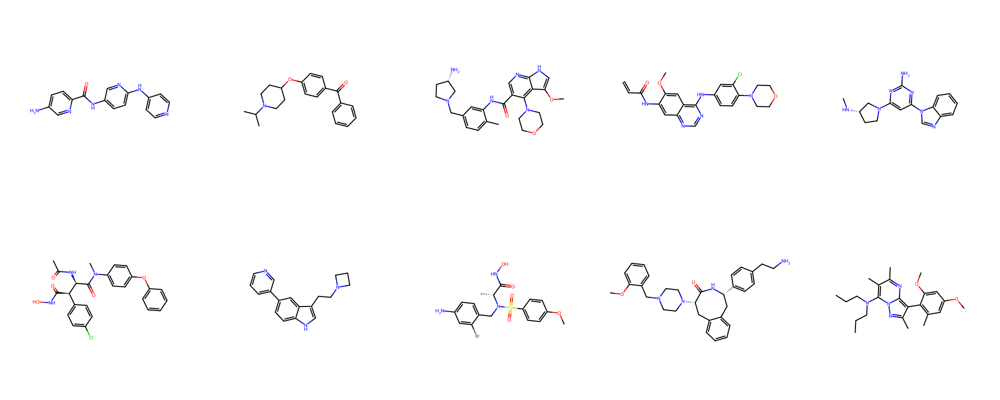

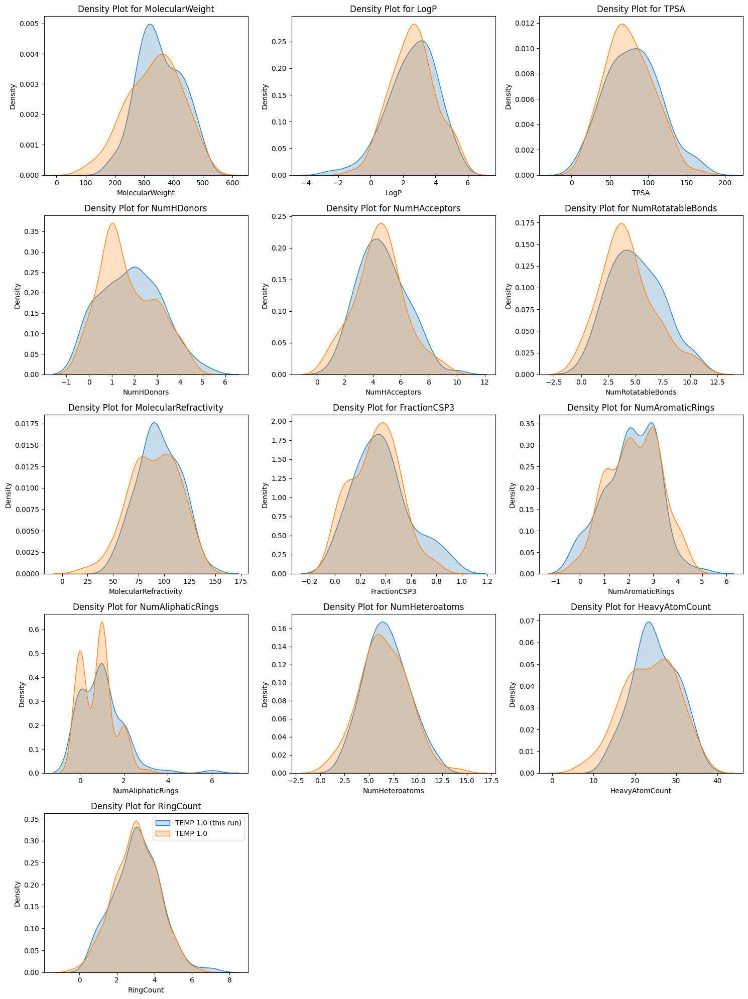

In [195]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=1.0)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 1.0 (this run)')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

  1%|          | 1/100 [00:16<27:23, 16.60s/it]

CN(Cc1ccc(Br)cc1)S(=O)(=O)N1CC[C@H](N(C)C(=O)/C=C/C#N)C1


  2%|▏         | 2/100 [00:18<13:13,  8.10s/it]

Cc1ccc(N(C)c2nc3ccccc3nc2O)n(C)c1


  3%|▎         | 3/100 [00:21<09:14,  5.71s/it]

CCCN(C)CC(=O)N1CCN(C(=O)c2ccc(CN3CCCC3)cc2)CC1


  4%|▍         | 4/100 [00:23<06:42,  4.19s/it]

O=C1NC(=O)/C(=C2/CN3CCC2C3)S1


  5%|▌         | 5/100 [00:25<05:26,  3.44s/it]

COc1ccc(C#Cc2cccc(OCCN3CC3)c2)cc1


  6%|▌         | 6/100 [00:28<04:59,  3.18s/it]

Cl.S=c1sc2cnc3ncc4[nH]c5ccccc5c4c3c2[C@H]1O


  7%|▋         | 7/100 [00:30<04:39,  3.00s/it]

CN1C2CCC1C(C(=O)OCCN(C)C)C(c1ccc(Cl)cc1)C2


  8%|▊         | 8/100 [00:33<04:23,  2.87s/it]

Cn1c2c(c3c1C(=O)NC(=O)C21CCS3)CC1S2(=O)=O


  9%|▉         | 9/100 [00:36<04:28,  2.95s/it]

O=C(CN1CCC[C@H](N(Cc2ncccn2)Cn2cnnc2)C1)Nc1cccnc1


 10%|█         | 10/100 [00:38<03:53,  2.59s/it]

N=C(N)N/N=C/c1ccc(O)c(Cl)c1


 11%|█         | 11/100 [00:40<03:31,  2.37s/it]

O=C1NCCc2[nH]c(-c3ccncc3)cc21


 12%|█▏        | 12/100 [00:42<03:19,  2.27s/it]

CN(C)Cc1cccnc1C(=O)NCc1ccc(I)cc1


 13%|█▎        | 13/100 [00:44<03:27,  2.38s/it]

O=C1OC2(CCN(CCc3CCCc4ccccc43)CC2)c2ccccc21


 14%|█▍        | 14/100 [00:47<03:19,  2.32s/it]

CCCN(C)[C@H]1CCc2c3ccccc3[nH]c2CC1


 15%|█▌        | 15/100 [00:48<02:44,  1.94s/it]

CN1CC2OC(=O)C1C2


 16%|█▌        | 16/100 [00:50<02:54,  2.08s/it]

Cc1ccc(SCCCc2nc(C(C)(C)N)cc(=O)n2C)n1


 17%|█▋        | 17/100 [00:52<02:40,  1.94s/it]

O=2c1ccc(-c2cnc(O)cn2)o1


 18%|█▊        | 18/100 [00:54<02:49,  2.07s/it]

Cc1ccc(-c2nn3c(=O)[nH]c4ccccc4n3n2)s1


 19%|█▉        | 19/100 [00:57<03:11,  2.37s/it]

NNC(=O)c1nc(-c2cccc([S+](O)[O-])c2)nc2c(Cl)cccc12


 20%|██        | 20/100 [01:00<03:18,  2.49s/it]

COCCn1c(C#N)scc1-c1nc2c3c(c(N4CCOCC4)n2)OCO3


 21%|██        | 21/100 [01:01<02:53,  2.19s/it]

CCCCNC1(c2cnccn2)CCCCC1


 22%|██▏       | 22/100 [01:04<03:02,  2.33s/it]

C[C@H](CO)Nc1nc(SCc2ccc(C)cc2)nc2nc(N)sc12


 23%|██▎       | 23/100 [01:08<03:35,  2.79s/it]

O=C(Nc1cc(-c2cccc(CO)c2)nc(C(O)(C(F)(F)F)C(F)(F)F)n1)c1cccnc1


 24%|██▍       | 24/100 [01:12<03:54,  3.09s/it]

C=C1C2CCC([C@@H]1C(N)=O)[C@@H]1CC[C@@H]2NC(=O)N1.O=C(O)C(F)F


 25%|██▌       | 25/100 [01:15<03:59,  3.19s/it]

CC1c2c(sc3cccc13)C(=O)N([C@H]1CN2CCC1CC2)c1csc2ccccc12


 26%|██▌       | 26/100 [01:17<03:33,  2.88s/it]

COc1ccc(CNC(=O)NCCc2cnc(CCO)s2)cc1


 27%|██▋       | 27/100 [01:20<03:25,  2.82s/it]

N#Cc1ccccc1Oc1cccc(F)c1COC1CC2CNCC(C2)C1


 28%|██▊       | 28/100 [01:22<03:05,  2.57s/it]

COc1ccc2nccc(I)c2c1NC(C)CC(=O)O


 29%|██▉       | 29/100 [01:25<03:12,  2.71s/it]

C=C(c1ccncc1)[C@H]1CN[C@H](C(=O)O)[C@H]1CC(=O)O


 30%|███       | 30/100 [01:29<03:34,  3.07s/it]

C[C@H]1[C@H](O)[C@@H](O)[C@@H]1n1ccc2c(N)nc(-c3cccc(C#N)c3)nc21


 31%|███       | 31/100 [01:31<03:17,  2.86s/it]

C=C(CC)NC(OC)C1CCc2c(ccc(OC)c2OC)C1.Cl


 32%|███▏      | 32/100 [01:35<03:34,  3.16s/it]

CC[C@H](N)C(=O)N[C@H](C(=O)N1N=[N+](C)[O-])C[C@@H]1C#N)C(C)C


 33%|███▎      | 33/100 [01:37<03:06,  2.78s/it]

Nc1c(F)cc(C2=CC(=O)NC2=O)cc1F


 34%|███▍      | 34/100 [01:40<02:59,  2.72s/it]

Cc1c(CC(O)c2ccccc2)c[nH]c2ccc(C(=O)O)cc12


 35%|███▌      | 35/100 [01:42<02:55,  2.71s/it]

COC(c1ccc(Cl)cc1)[C@H]1CN(C)C[C@H]1c1ccccn1


 36%|███▌      | 36/100 [01:45<02:45,  2.58s/it]

O=C1OC2(CCN(CCc3ccccc3)CC2)c2ccccc21


 37%|███▋      | 37/100 [01:48<02:51,  2.71s/it]

CC1(C)Oc2ccc3c(c2O1)C1Cc2ccccc2C3(C2CC2)[C@H]1O


 38%|███▊      | 38/100 [01:50<02:46,  2.69s/it]

Cc1ccc(C)c(S(=O)(=O)N[C@@H]2C3CCN(C)C2)c1


 39%|███▉      | 39/100 [01:54<02:59,  2.94s/it]

C#CCCOC(=O)c1cc2c(c(N3CCOCC3)c1)Nc1cnc(Nc3ncccn3)c(F)c12


 40%|████      | 40/100 [01:56<02:40,  2.67s/it]

Nc1ncnnc1Cc1ccc(C(=O)NCC2CC2)cc1


 41%|████      | 41/100 [02:00<02:58,  3.02s/it]

OC[C@H]1O[C@@H](n2cnc3c(NC4CCCCC4)nc(Cl)nc32)[C@H](O)[C@@H]1O


 42%|████▏     | 42/100 [02:02<02:46,  2.86s/it]

O=C(Nc1cc2cc[nH]c(=O)c2c(O)c1Cl)/C=C/CO


 43%|████▎     | 43/100 [02:05<02:39,  2.80s/it]

O=C(Cc1ccccc1Cl)N[C@@H]1CCN(Cc2ccccc2)C1


 44%|████▍     | 44/100 [02:08<02:43,  2.92s/it]

NS(=O)(=O)c1cc2cc(S(=O)(=O)N3CC[C@H](N)C3)ccc2[nH]1


 45%|████▌     | 45/100 [02:11<02:35,  2.83s/it]

NC(=O)c1nnc(N2CCc3[nH]c4ccc(Cl)cc4c3C2)s1


 46%|████▌     | 46/100 [02:13<02:31,  2.81s/it]

O=C(NCCCN1CCN(S(=O)(=O)c2ccccc2)CC1)C1CCCCC1


 47%|████▋     | 47/100 [02:17<02:41,  3.05s/it]

CCCn1c(=O)c2[nH]c(-c3ccc(-n4cc5ccccc54)cc3)cc2n(CCC)c1=O


 48%|████▊     | 48/100 [02:21<02:52,  3.32s/it]

SCCc1ccccc1CN1CCN(CCn2c(=O)n([nH]c3ccc(Cl)cc3)c3c(F)cccc32)CC1


 49%|████▉     | 49/100 [02:22<02:21,  2.77s/it]

CCCCNC(=O)OCCCCCC(=O)OC


 50%|█████     | 50/100 [02:27<02:51,  3.43s/it]

O=C(N[C@@H]1C[C@@H](N2CCN(c3ncc(Cl)cn3)CC2)CN[C@@H]1C(=O)O)[C@@](Cc1cccs1)C(=O)O


 51%|█████     | 51/100 [02:31<02:49,  3.45s/it]

Cn1cc(-n2nc(C(F)(F)F)c3c(N)ncnc32)cc1-c1ccc(F)c2ccccc12


 52%|█████▏    | 52/100 [02:34<02:43,  3.40s/it]

c1ccc(Oc2cnc(Nc3cnccn3)nc2N2CCN(c3ccc(F)cc3)CC2)cc1


 53%|█████▎    | 53/100 [02:36<02:17,  2.92s/it]

C=CC[[N+](C)(C)c1ccccc1.[I-]


 54%|█████▍    | 54/100 [02:40<02:31,  3.29s/it]

CCOc1ccc2c(c1C(F)(F)F)N(C(=O)Nc1ccc(C(C)(C)C)nc1)C(C(=O)O)c1cccn1-2


 55%|█████▌    | 55/100 [02:43<02:18,  3.07s/it]

C#CCn1c(N2CCC[C@@H](N)C2)nc2cc3c(cc21)CC2


 56%|█████▌    | 56/100 [02:45<01:59,  2.72s/it]

NS(=O)(=O)Oc1ccc(NC(=O)NN)cc1


 57%|█████▋    | 57/100 [02:48<02:04,  2.89s/it]

Cl.O=[N+]([O-])c1cc(N2CCSC2=S)cc(CN2c2ccc(F)cc2)c1


 58%|█████▊    | 58/100 [02:51<02:09,  3.08s/it]

CS(=O)(=O)Nc1ccc()c1Oc1cc(CNc2cncn3cc(C#N)cc23)cc(Cl)c1


 59%|█████▉    | 59/100 [02:55<02:14,  3.29s/it]

CCNc1cc([C@@H](O)[C@@H](O)CNCc2ccc(OC)cc2)cc(OC(C)C)c1OC.Cl


 60%|██████    | 60/100 [02:58<02:07,  3.18s/it]

O=C(O)C(CC1CCOC1=O)NCCCN1CCC(Oc2ccc(Cl)cc2)CC1


 61%|██████    | 61/100 [03:01<02:03,  3.16s/it]

CC(=O)N(O)CC[C@@H](c1ccc(-c2ccccc2)cc1)P(=O)(O)O


 62%|██████▏   | 62/100 [03:03<01:49,  2.88s/it]

CN(C)c1noc(-c2ccc(CCN3CCCC3C)cc2)n1


 63%|██████▎   | 63/100 [03:08<02:02,  3.30s/it]

CCCC[C@H](N[C@@H](c1cccc(F)c1)C(F)(F)F)C(=O)NCCC(=O)Nc1c[nH]c2ncccc12


 64%|██████▍   | 64/100 [03:11<02:02,  3.40s/it]

Cc1cc2nn[nH]c2c2c1Cnc1[nH]nc(-3CCC(=O)NC4(C(N)=O)CCO4)c1-2


 65%|██████▌   | 65/100 [03:13<01:45,  3.02s/it]

COc1ccc(CSc2sc(C)c(C)n2)cc1C(C)=O


 66%|██████▌   | 66/100 [03:17<01:44,  3.06s/it]

NC(=O)c1cc2c(Oc3ccc([N+](=O)[O-])c(Cl)c3)ncnc2cn1


 67%|██████▋   | 67/100 [03:20<01:39,  3.01s/it]

Oc1nc2c(c3[nH]1)C(CNCc1ccccc1F)=Nc1cc(F)ccc1-2


 68%|██████▊   | 68/100 [03:22<01:28,  2.77s/it]

C(#C[C@@@H]1CCCN1)s/c1cc(O)nc(O)c1


 69%|██████▉   | 69/100 [03:24<01:20,  2.60s/it]

Cc1ccccc1/N=c1\sc(C)nc(N2CCOCC2)c1C


 70%|███████   | 70/100 [03:27<01:22,  2.74s/it]

COc1cnc(-c2ccnc(N3C[C@H](C)[C@@H](N)C3)n2)c(OC)c1


 71%|███████   | 71/100 [03:31<01:26,  2.99s/it]

COc1ccccc1N1CCN(C[C@H](NC(=O)c2c2ccccc2)C(=O)N2CCCC2)CC1


 72%|███████▏  | 72/100 [03:32<01:12,  2.60s/it]

c1ccc(COC2=CN3CCC2CC3)cc1


 73%|███████▎  | 73/100 [03:35<01:14,  2.78s/it]

C#CCn1nc([C@@H]2CN3CCC[C@H]23)n(Cc2ccc(F)cc2)c1=O


 74%|███████▍  | 74/100 [03:38<01:10,  2.71s/it]

CC1(C)Oc2ccccc2N(CC#CC(=O)O)c2ccccc2C1=O


 75%|███████▌  | 75/100 [03:42<01:14,  2.96s/it]

O=C(c1cccc(Oc2c(C(F)(F)F)cnc3sc(N4CCOCC4)nn23)c1)N1CCOCC1


 76%|███████▌  | 76/100 [03:45<01:13,  3.07s/it]

Cc1cc(CN2CC[C@H](N3CCC(O)(c4cnccn4)CC3)C2)n2ccnc2n1


 77%|███████▋  | 77/100 [03:48<01:13,  3.21s/it]

Nc1cnc2c(-c3cccc4[nH]nc(S(C)[C@@H](CC(=O)O)c4)c34)ccnc2c1


 78%|███████▊  | 78/100 [03:52<01:10,  3.22s/it]

Cn1nncc1CC(O)COc1ccc(-c2nc3cc(C(N)=O)ccc3[nH]2)c1.Cl


 79%|███████▉  | 79/100 [03:54<01:01,  2.93s/it]

N[C@@]1(C(=O)O)CCNC1c1ccc2[nH]ncc2c1


 80%|████████  | 80/100 [03:57<00:56,  2.84s/it]

Cc1nc(N)nc(-n2c(Nc3cc[nH]n3)nc3ccccc32)n1


 81%|████████  | 81/100 [03:59<00:54,  2.85s/it]

O=C1c2ccccc2S(=O)(=O)N1CSC(=S)Nc1cccc(Br)c1Cl


 82%|████████▏ | 82/100 [04:03<00:55,  3.10s/it]

O=C1CNC(=S)Nc2ccc3c(c21)c2cc(Cl)ccc2n1[C@H](C(F)(F)F)[C@H]3


 83%|████████▎ | 83/100 [04:06<00:49,  2.89s/it]

COc1cccc(CN(C)Cc2cnc3nc(O)c(O)nc3c2)c1


 84%|████████▍ | 84/100 [04:07<00:40,  2.56s/it]

Cc1cccc(Cn2ncnc2Sc2ccccc2)c1


 85%|████████▌ | 85/100 [04:09<00:33,  2.25s/it]

O=C1OCCC(O)[C@@H]1C(=O)O


 86%|████████▌ | 86/100 [04:11<00:31,  2.23s/it]

CN(C)S(=O)(=O)c1ccc2[nH]c(=O)oc2c1


 87%|████████▋ | 87/100 [04:12<00:24,  1.90s/it]

Oc1cccc2[nH]ncc12


 88%|████████▊ | 88/100 [04:15<00:27,  2.27s/it]

O=C(Nc1cc(Cl)c(Cl)c(Cl)c1)N1CCc2cnc3nc(O)ccc3c2C1


 89%|████████▉ | 89/100 [04:20<00:31,  2.90s/it]

CC(C)(C)C#CC(C)(CS(C)(=O)=O)N[C@H](Cc1ccccc1)C(=O)N[C@H](C=O)Cc1ccccc1


 90%|█████████ | 90/100 [04:21<00:24,  2.44s/it]

O=C1NC(=O)C2(CCCC2)N1


 91%|█████████ | 91/100 [04:25<00:24,  2.76s/it]

Cc1ccc(S(=O)(=O)NCCNCCn2c(=O)n(CC3CCCC3)c3ccccc32)c(C)c1


 92%|█████████▏| 92/100 [04:26<00:19,  2.42s/it]

O=C1CC(O)C(C#N)(O)C(=O)N1


 93%|█████████▎| 93/100 [04:29<00:17,  2.53s/it]

CCSc1c(Cl)cc(C(=O)N=[N+]=[N-])cc1OCc1ccccc1


 94%|█████████▍| 94/100 [04:34<00:19,  3.20s/it]

C=CC[C@H](C(=O)Nc1ccc(-c2ccccn2)s1)[C@H](N)C(=O)N1CC[C@H](F)C1.O=C(O)C(F)(F)F


 95%|█████████▌| 95/100 [04:36<00:14,  2.98s/it]

NN=C(CS)Cc1cccc(CNC(=O)N2Cc3ccccc3C2)c1


 96%|█████████▌| 96/100 [04:40<00:12,  3.12s/it]

COC(=O)c1ccc(OCCSc2cc3ccccc3[nH]2)cc1.O=C(O)/C=C/C(=O)O


 97%|█████████▋| 97/100 [04:43<00:09,  3.20s/it]

O=c1cc(OCCC1CCN(CCc2c[nH]c3ccc(-n4cnnc4)cc23)CC1)ccn1


 98%|█████████▊| 98/100 [04:45<00:05,  2.91s/it]

CCCS(=O)(=O)Nc1ccc(F)c(C(F)(F)F)c1F


 99%|█████████▉| 99/100 [04:49<00:03,  3.16s/it]

COc1cccc(C2=NOC([C@H]3CN[C@@H](C(=O)N4CCC[C@@H]4C#N)C3)O2)c1


100%|██████████| 100/100 [04:51<00:00,  2.92s/it]

N[C@H]1CN(c2nc(OCCCc3cccs3)ccc2F)CC1

Percent valid: 74.000%
Percent unique: 95.946%
['O=C1NC(=O)/C(=C2/CN3CCC2C3)S1', 'CC1(C)Oc2ccccc2N(CC#CC(=O)O)c2ccccc2C1=O', 'CCCC[C@H](N[C@@H](c1cccc(F)c1)C(F)(F)F)C(=O)NCCC(=O)Nc1c[nH]c2ncccc12', 'C=CC[C@H](C(=O)Nc1ccc(-c2ccccn2)s1)[C@H](N)C(=O)N1CC[C@H](F)C1.O=C(O)C(F)(F)F', 'Cc1ccc(S(=O)(=O)NCCNCCn2c(=O)n(CC3CCCC3)c3ccccc32)c(C)c1', 'COc1ccc(CNC(=O)NCCc2cnc(CCO)s2)cc1', 'O=C1OC2(CCN(CCc3ccccc3)CC2)c2ccccc21', 'N#Cc1ccccc1Oc1cccc(F)c1COC1CC2CNCC(C2)C1', 'Oc1cccc2[nH]ncc12', 'COC(=O)c1ccc(OCCSc2cc3ccccc3[nH]2)cc1.O=C(O)/C=C/C(=O)O', 'CCNc1cc([C@@H](O)[C@@H](O)CNCc2ccc(OC)cc2)cc(OC(C)C)c1OC.Cl', 'NS(=O)(=O)c1cc2cc(S(=O)(=O)N3CC[C@H](N)C3)ccc2[nH]1', 'OC[C@H]1O[C@@H](n2cnc3c(NC4CCCCC4)nc(Cl)nc32)[C@H](O)[C@@H]1O', 'O=C(Nc1cc(-c2cccc(CO)c2)nc(C(O)(C(F)(F)F)C(F)(F)F)n1)c1cccnc1', 'C#CCn1nc([C@@H]2CN3CCC[C@H]23)n(Cc2ccc(F)cc2)c1=O', 'O=C1NC(=O)C2(CCCC2)N1', 'O=C1OCCC(O)[C@@H]1C(=O)O', 'NNC(=O)c1nc(-c2cccc([S+](O)[O-])c2)nc2c(Cl)cccc12', 'N=C(N)N/N=C/c

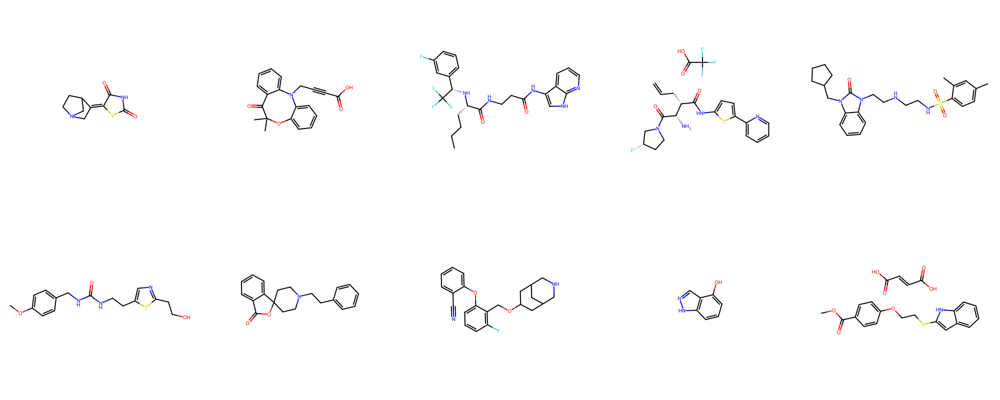

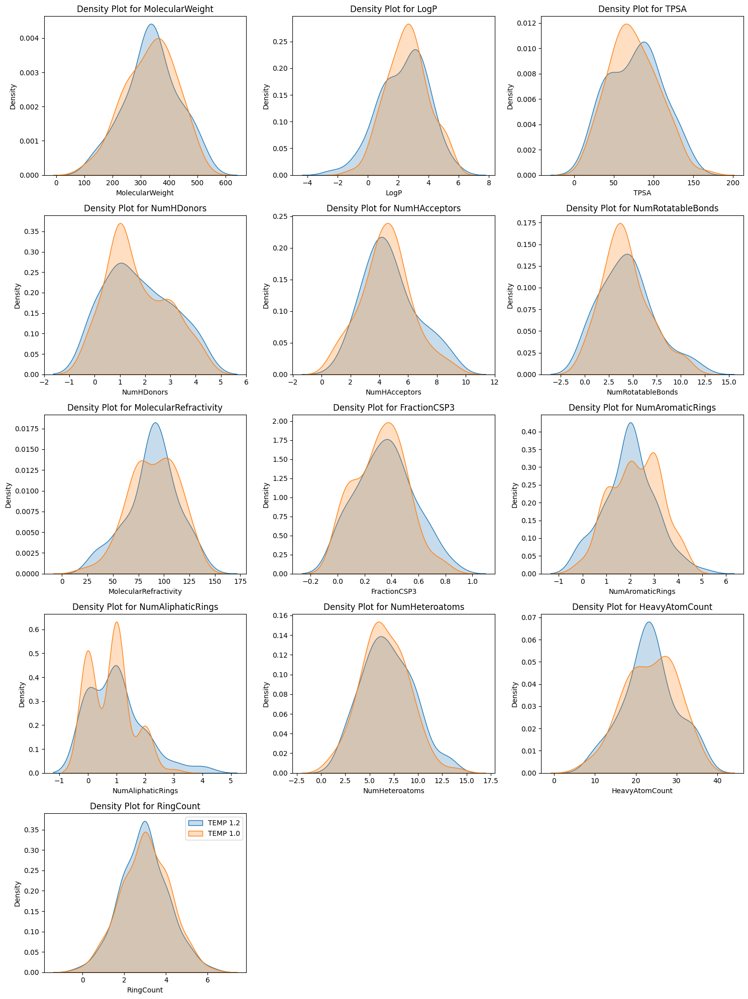

In [197]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=1.2)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 1.2')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

  1%|          | 1/100 [00:16<26:39, 16.15s/it]

CCc1ccc(OCc2nc3c(C(F)(F)F)nn(-c4nccc(S(C)(=O)=O)c4F)c3s2)cc1


  2%|▏         | 2/100 [00:18<13:00,  7.96s/it]

Cn1ncc2c1CCCCC2N1CCN(Cc2cccc(F)c2)CC1


  3%|▎         | 3/100 [00:19<07:33,  4.68s/it]

CCc1cn[nH]c1


  4%|▍         | 4/100 [00:22<06:37,  4.14s/it]

CCn1nc(-c2scnc2S(=O)(=O)c2cccnc2)c2cnc3ccc(Br)cc3c21.Cl


  5%|▌         | 5/100 [00:24<05:27,  3.44s/it]

Br.N=c1c(-c2ccncc2)cn2c1C1CC2CNCC13N4


  6%|▌         | 6/100 [00:28<05:35,  3.57s/it]

O=c1[nH]c3ccc(F)cc3n2CC(Br)=C(Cl)C2=C5CCC(O)C(O)CC4C22CC2)C1


  7%|▋         | 7/100 [00:30<04:43,  3.04s/it]

Cc1ccncc1S(=O)(=O)n1cc(C=O)sc1=O


  8%|▊         | 8/100 [00:34<05:23,  3.51s/it]

N[C@H]1CN(c2c(F)ccc3cc(F)ccc23)CC[C@@H]1C(=O)Nc1cc(C(F)(F)F)n(Cnn1)c1ccccc1


  9%|▉         | 9/100 [00:37<04:45,  3.14s/it]

c1oc2[nH]c(NNC3CCC3)nc2c1C1CCCCCCN3CC1


 10%|█         | 10/100 [00:39<04:17,  2.86s/it]

CCCN(CCC)C(=O)c1ccc(OC)c(OC3CCCC3)c1


 11%|█         | 11/100 [00:43<04:43,  3.19s/it]

CS(=O)(=O)O.Cc1cc(C(=O)O)cc(C(=O)Nc2cc(CCc3ccc(nc4ncccc34)o3)c1


 12%|█▏        | 12/100 [00:47<04:50,  3.30s/it]

Cc1cc(-c2nn(-c3ccc(CN4cc(C(=O)N4C(C)(O)C(=O)O)cc3)cn2)ccn1


 13%|█▎        | 13/100 [00:49<04:33,  3.14s/it]

Cn1c2ccc3[nH]cc(/C=C/CNC(=O)Nc4cnccc4)c3c2c21


 14%|█▍        | 14/100 [00:51<04:02,  2.82s/it]

O=C1N=c2c(cnc(NCCNCc3cccl)cc3)c2C1


 15%|█▌        | 15/100 [00:56<04:34,  3.23s/it]

O=C(NCc1ccc2c(c1)OCn1ccnc1Cl)[C@H](O)c1cc(F)c(O)cc1F.O=C(O)C(F)(F)F


 16%|█▌        | 16/100 [00:58<04:19,  3.09s/it]

Oc1cc2c(cc1I)N(CCc1ccc(F)c(F)c1)CCN2c1ccccn1


 17%|█▋        | 17/100 [01:01<04:08,  2.99s/it]

c1ccc(-c2ccccc2OCCCOc2n[nH]cc2-c2nnc[nH]2)cn1


 18%|█▊        | 18/100 [01:05<04:22,  3.20s/it]

C=C/N(CC=C/[C@@](=O)CC(=O)O)C1CCN(CCc2ccccc2)CC1.O=C(O)C(=O)O


 19%|█▉        | 19/100 [01:07<04:00,  2.97s/it]

O=c1c(O)c(OCc2cccs2)coc2cc3[nH]ncc3cc12


 20%|██        | 20/100 [01:11<04:25,  3.31s/it]

C/C=C1/[C@H]2C=C(oc3c(S(=O)(=O)Nc4cccc(F)c4C)ncn32)[C@H](O)[C@H]1O


 21%|██        | 21/100 [01:14<04:11,  3.18s/it]

(#C/C=C/c1c[nH]cn1)CN1CCc2ccc3c(cc[nH]c3c2)C1=O


 22%|██▏       | 22/100 [01:18<04:16,  3.28s/it]

Oc1ccc(Nc2ccncc2)c2nc(NCCCN(CCNC(CF)c3cn4ccncc4n3)CO)sc12


 23%|██▎       | 23/100 [01:19<03:25,  2.67s/it]

O=c1[nH]ncc2csc3c12


 24%|██▍       | 24/100 [01:21<03:07,  2.47s/it]

Nc1cc(Nc2ccccc23)c(I)c2nc[nH]c12


 25%|██▌       | 25/100 [01:23<02:53,  2.31s/it]

O=C(O)c1cc2ccc(O)c(O)c2[nH]c1=O


 26%|██▌       | 26/100 [01:25<02:56,  2.38s/it]

Cc1ccc(N(C)Cc2c(I)cc3oc(=S)[nH]c3c2N)cc1


 27%|██▋       | 27/100 [01:27<02:44,  2.25s/it]

COc1cccc2c3c(c(Br)cn12)C(=O)NC3


 28%|██▊       | 28/100 [01:31<03:13,  2.69s/it]

Cl.Cl.OC1(C(c2ccccc2)c2ccc(C#CCN3CCCCC3)cc2)CC[Cl+]([O-])C1


 29%|██▉       | 29/100 [01:33<03:01,  2.55s/it]

C1=C(c2csc(NC.Cl)n2)C2CC2CC(C2)CC1C1


 30%|███       | 30/100 [01:35<02:41,  2.31s/it]

CS(=O)(=O)Nc1cccc2ccc(O)cc12


 31%|███       | 31/100 [01:37<02:36,  2.27s/it]

CP(=O)(O)C(/C=C\c1ccccc1F)P(=O)(O)O


 32%|███▏      | 32/100 [01:41<03:00,  2.66s/it]

O=C(C[C@@H](C[S+]([O-])Cc1ccccc1)n1cnnc1)Nc1ncccn1.[Br-]


 33%|███▎      | 33/100 [01:44<03:12,  2.88s/it]

Cl.c1ccc2c(c1)nnn2-c1ccc(CNCC(=O)N2CCC[C@H]2C(=O)NO)cc1


 34%|███▍      | 34/100 [01:47<03:01,  2.76s/it]

N[C@@H](CS)CCS[C@H](N)[C@H]1O-c2ccccc2O1


 35%|███▌      | 35/100 [01:48<02:39,  2.46s/it]

COc1c(C)nc2c(c1(Cl)C#N)CCSC2


 36%|███▌      | 36/100 [01:52<02:55,  2.74s/it]

COCCN[C@H]1CCC2(C1)CNO[c1ccc(OC)cc1O[C@@H]2c1ccc(Cl)s1


 37%|███▋      | 37/100 [01:56<03:12,  3.05s/it]

N=[N+]=N[N+]([O-])CC(C[N+](=O)[O-])c1[n+]([O-])/C=C/c1ccccc1


 38%|███▊      | 38/100 [01:57<02:36,  2.52s/it]

N[C@H](C(=O)O)C(=O)O


 39%|███▉      | 39/100 [01:59<02:34,  2.53s/it]

COc1ccccc1OCCc1nc(N)c2nncn2n1.CS(=O)(=O)O


 40%|████      | 40/100 [02:02<02:32,  2.54s/it]

NCc1ccc(Cc2nc3c(C(N)=O)cc(F)cc3[nH]2)cc1


 41%|████      | 41/100 [02:05<02:41,  2.73s/it]

CSc1nc2cc(OC3CCC[N+](C)(C)C3)ccc2[nH]1.[I-]([O-])=F


 42%|████▏     | 42/100 [02:07<02:19,  2.40s/it]

CNCC1CNC/C1=N/c1cccc()c1I


 43%|████▎     | 43/100 [02:10<02:32,  2.67s/it]

N#CN/N=[N+](C/C=C/c1ccc[n@H]1F)c1cc([N+](=O)[O-])ccn1


 44%|████▍     | 44/100 [02:15<03:01,  3.24s/it]

COc1cc2c(cc1OC)[C@@]13CCC[C@H](=C(C)C)[C@@H]2C(=O)/C(=C\c2cccs2)C3[C@@H]1O3


 45%|████▌     | 45/100 [02:18<03:00,  3.28s/it]

C=C(CN#N)c1nc2nn(NC)c3ccccc2c2c1CCN(C)C(C)Cc1ccncc1)C2


 46%|████▌     | 46/100 [02:22<03:00,  3.33s/it]

Brc1cc([C@H]2CCN(S(=O)(=O)CCOc3ccccc3)C[C@H]2O)cc(Br)c1


 47%|████▋     | 47/100 [02:24<02:49,  3.20s/it]

C/C(=C\N(c1nccc(-c2cc[nH]n2)c1)N)CCCc1ccccc1F


 48%|████▊     | 48/100 [02:28<02:45,  3.17s/it]

COc1csc2nc(C(F)(F)F)c(NC(=O)NCCc3nnn[nH]3)c(=O)o12


 49%|████▉     | 49/100 [02:31<02:45,  3.24s/it]

O=C(NCCN1CC=C(c2c[nH]c3ccccc23)CC1)c1nc2ccccc2c2cncc12


 50%|█████     | 50/100 [02:34<02:42,  3.25s/it]

O=C1c2c(c(O)n(CCN3C(=O)c4ccccc4O3)c2C(=O)NCC2CC2)CCS1


 51%|█████     | 51/100 [02:37<02:33,  3.13s/it]

O=[N+]([O-])c1ncnc2c1ncn2-c1c2ccc(CO)cc2[nH]1


 52%|█████▏    | 52/100 [02:39<02:19,  2.92s/it]

N#C/C(=C\c1c2cc(Br)ccc2OCn2ccnc2)CCC1


 53%|█████▎    | 53/100 [02:43<02:25,  3.09s/it]

Cn1c(-c2nnnn2N)nc2ccc(-c3cc[nH]c3-c3c4nccc(F)c4[nH]3)cc21


 54%|█████▍    | 54/100 [02:46<02:21,  3.07s/it]

C=C[C@@H]1c2ccccc2N[C@H]1CCc1cnc2cc(C(C)(C)C)nn12


 55%|█████▌    | 55/100 [02:52<02:51,  3.82s/it]

Cc1cc(C)[n++](CC)c1-c1nc(NCc2cc(Br)ccc2O)n2c(S)nc(-n3ccnc3)c2n1.[O-][F+3]([O-])([O-])[O-]


 56%|█████▌    | 56/100 [02:55<02:43,  3.71s/it]

Fc1cncc(-c2cccc([C@@H]3CCN(c4ncnc5cccc(F)c45)S3(=O)=O)c2


 57%|█████▋    | 57/100 [02:58<02:32,  3.54s/it]

n1c(CC2(CC2)CC(CNC2CC(F)(F)C2)nnc2C1)CCc1ccc(Cl)cc1


 58%|█████▊    | 58/100 [02:59<01:56,  2.79s/it]

COc1cccc2c1CNCN2


 59%|█████▉    | 59/100 [03:01<01:47,  2.62s/it]

COC(=O)/C(NS(=O)(=O)c1csc2sccc12)N=O


 60%|██████    | 60/100 [03:04<01:49,  2.73s/it]

O=S(=O)(Nc1cc(Cl)n[nH]1)N/N=C1\CC(CN2Cc3cccc(NC


 61%|██████    | 61/100 [03:08<01:55,  2.95s/it]

NCCn1cc(-c2cnn3c(-c4cn[nH]c4)cnc23)cnc1)c1ccc2c2ccccc2c1


 62%|██████▏   | 62/100 [03:10<01:41,  2.66s/it]

N#Cc1cnc(Nc2ccccc2)nc1NCc1ccccn1


 63%|██████▎   | 63/100 [03:13<01:41,  2.73s/it]

O=C(N[C@@H](Cc1c[nH]cn1)C(=O)N[C@H]1CCC1)C(=O)O


 64%|██████▍   | 64/100 [03:17<01:51,  3.10s/it]

CC([C@@]1(CF)CN2CCC[C@@H](c3cc(F)cc(F)c3F)C2)C1)N(O)[C@@H](C)C=O


 65%|██████▌   | 65/100 [03:20<01:52,  3.22s/it]

N[C@H]1CN(C/C=C/CCCO)C(=O)N2c3cc(Cl)ccc4n3C[C@H]2C=NO1


 66%|██████▌   | 66/100 [03:24<01:56,  3.42s/it]

CNC(=O)c1cc(S(N)(=O)=O)c(OSc2cnc(N3CCN(C)CC3)c(C(C)(C)=O)c2OC)s1


 67%|██████▋   | 67/100 [03:27<01:45,  3.19s/it]

CCCCOc1cccc(NC(N2CCN(CF)CC2)c2ccccc2)c1.Cl


 68%|██████▊   | 68/100 [03:30<01:41,  3.18s/it]

Fc.Fc1ncnc(C2CCN(C[C@@H](O)C3CN(c4ccncc4)CC3)CC2)n1


 69%|██████▉   | 69/100 [03:34<01:45,  3.41s/it]

O=C(C[C@@H](Cc1ccc(-c2ccccc2)cc1)C(=O)N1CCC[C@H]1C(=O)O)C(=O)O


 70%|███████   | 70/100 [03:37<01:43,  3.44s/it]

NS(=O)(=O)c/N=C/c1ccc(P(=O)(O)Cc2ccc(C(F)C(F)(F)F)cc2)cc1


 71%|███████   | 71/100 [03:40<01:31,  3.17s/it]

N(#CC1C2=NNNN2c2cccnc2N1c1ccccc1)c1ccccc1


 72%|███████▏  | 72/100 [03:43<01:30,  3.23s/it]

NS(=O)(=O)c1noCC(=O)NC(CC2CCCCC2)C(=O)O)C(=O)NP(=O)(F)O


 73%|███████▎  | 73/100 [03:45<01:18,  2.91s/it]

NCC(CC(=O)O)c1cccc(F)c1.Oc1c[nH]cn1


 74%|███████▍  | 74/100 [03:47<01:08,  2.63s/it]

Nc1ncnc([C@H]2CN3CC[C@@H]2C3)n1


 75%|███████▌  | 75/100 [03:50<01:09,  2.77s/it]

O=n1nccc2sc3c(c(O)c21)CC(N1CC=(c2oc(O)cn2)CC1)CS3


 76%|███████▌  | 76/100 [03:53<01:04,  2.70s/it]

Cc1cccc2c1S(=O)(=O)c1cnn(CC)c1N2Cc1cccnc1


 77%|███████▋  | 77/100 [03:58<01:14,  3.25s/it]

CC(C(Cl)[N+](CCc1cccnc1)C#N)=NNC1(C(=O)N2CCCC(c3ccccc3)C[C@@H]2CO)c2sccc2CO


 78%|███████▊  | 78/100 [04:01<01:09,  3.16s/it]

CNc1nc2[nH]c(-c3ccc(S(C)(=O)=O)cc3)cc2c2c1ncn2C


 79%|███████▉  | 79/100 [04:04<01:07,  3.22s/it]

NS(=O)(=O)c1ccc(-n2nc(COCc3ccc(Cl)cc3)cc2C(F)(F)F)cc1


 80%|████████  | 80/100 [04:06<00:56,  2.85s/it]

Br.N=C(N)N/N=C/c1ccc2c(c1)C=OCO2


 81%|████████  | 81/100 [04:08<00:52,  2.74s/it]

OCCOC[C@H]1O[C@@+1(Br)[C@@H]2CNC[C@@H]12


 82%|████████▏ | 82/100 [04:13<00:57,  3.18s/it]

COc1cc(Br)nc(O)c1N1C[C@H]2C[C@@H]2C1CN1CCC(CCc2ccc3c(n2)NCCC3)CC1.Cl


 83%|████████▎ | 83/100 [04:14<00:46,  2.74s/it]

O=C1C(Cl)=Nc2ccccc2S1(=O)=O


 84%|████████▍ | 84/100 [04:17<00:45,  2.82s/it]

CCCNc1nnc(SCc2ccccc2)n1[C@@H](N)/C=C/c1ccc(F)cc1


 85%|████████▌ | 85/100 [04:20<00:40,  2.69s/it]

SC[C@H](NC1=NCCO1)CCOc1ccccc1-c1ccccn1


 86%|████████▌ | 86/100 [04:21<00:32,  2.35s/it]

NC[C@@H]c1cc(Br)c(Br)cc1O


 87%|████████▋ | 87/100 [04:24<00:33,  2.58s/it]

CN(C)n1c(Br)c(=O)n(CC(CN2CCC(F)(F)CC2)c2nccs2)c1=O


 88%|████████▊ | 88/100 [04:27<00:32,  2.73s/it]

CCc1cc(CC1=C(Nl)C(=O)O)c2sc(-c3cc4ccccc4n3C1=O)cCC2


 89%|████████▉ | 89/100 [04:31<00:34,  3.12s/it]

CS(=O)(=O)O.NS(=O)(=O)c1c/c(F)cc(Br)c1NCC1CCN(CC2=NCC2)c2ccccc21


 90%|█████████ | 90/100 [04:36<00:36,  3.64s/it]

O=C1C2(C3CC3)C(=O)NC(=O)N2CC1[C@@H]1S[C@H](Cc2ccccc2Cl)[C@@H](c2ccccc2)C(=O)N1


 91%|█████████ | 91/100 [04:39<00:31,  3.51s/it]

COC(=O)N1CCN(c2ncc(C(=O)OC(C)C)c(Cc3ccc(F)cc3)n2)CC1


 92%|█████████▏| 92/100 [04:43<00:29,  3.64s/it]

NC[C@@H]1CN(C2CCN(S(=O)(=O)c3cc(NC4=C(C)CCS4)n4cccnc4)NC2=O)CCO1


 93%|█████████▎| 93/100 [04:46<00:22,  3.26s/it]

C1CC(CNc2ncccc2[N+](=O)[O-])CC1(Cl)Cl


 94%|█████████▍| 94/100 [04:49<00:19,  3.28s/it]

O=C1c2nc2ccc(N3CCNCC3)cc2s2c(Cl)cnc(N(C3CCOCC3)C3)c12


 95%|█████████▌| 95/100 [04:52<00:16,  3.25s/it]

Oc1cc2c(=O)[nH]c(CC3c4ccccc4OC3c3ccccc3)nc2c(O)[nH]1


 96%|█████████▌| 96/100 [04:55<00:12,  3.19s/it]

CN(C)CCN(CC(=O)N(C)C)c1cccc(/C=C2\Oc3ccncc32)c1.Cl


 97%|█████████▋| 97/100 [05:01<00:11,  3.85s/it]

COc1cc2c2[nH]c(=S)c(-c3ccc(S(N)(=O)CN(CC)S(N)(=O)=O)cc3)cc2c(O[C@@H]1OC1CC[C@@H](C)C1


 98%|█████████▊| 98/100 [05:02<00:06,  3.13s/it]

O=C(O)SC11=NSC2CC(C1)N2


 99%|█████████▉| 99/100 [05:05<00:03,  3.07s/it]

CCOc1cccc2c3c(NC(C)(C)C)nccc3n(-c3ccc(Br)cc3)c12


100%|██████████| 100/100 [05:08<00:00,  3.08s/it]

C[C@@H]1C[C@@H](O)c2cc3[nH]c(=O)nc(N)c3cc2O1

Percent valid: 47.000%
Percent unique: 100.000%
['SC[C@H](NC1=NCCO1)CCOc1ccccc1-c1ccccn1', 'CCCNc1nnc(SCc2ccccc2)n1[C@@H](N)/C=C/c1ccc(F)cc1', 'O=C(C[C@@H](Cc1ccc(-c2ccccc2)cc1)C(=O)N1CCC[C@H]1C(=O)O)C(=O)O', 'Nc1ncnc([C@H]2CN3CC[C@@H]2C3)n1', 'O=C1c2c(c(O)n(CCN3C(=O)c4ccccc4O3)c2C(=O)NCC2CC2)CCS1', 'N#Cc1cnc(Nc2ccccc2)nc1NCc1ccccn1', 'O=C(O)c1cc2ccc(O)c(O)c2[nH]c1=O', 'Cc1cccc2c1S(=O)(=O)c1cnn(CC)c1N2Cc1cccnc1', 'c1ccc(-c2ccccc2OCCCOc2n[nH]cc2-c2nnc[nH]2)cn1', 'CS(=O)(=O)O.NS(=O)(=O)c1c/c(F)cc(Br)c1NCC1CCN(CC2=NCC2)c2ccccc21', 'CN(C)CCN(CC(=O)N(C)C)c1cccc(/C=C2\\Oc3ccncc32)c1.Cl', 'C=C/N(CC=C/[C@@](=O)CC(=O)O)C1CCN(CCc2ccccc2)CC1.O=C(O)C(=O)O', 'CCOc1cccc2c3c(NC(C)(C)C)nccc3n(-c3ccc(Br)cc3)c12', 'CCc1ccc(OCc2nc3c(C(F)(F)F)nn(-c4nccc(S(C)(=O)=O)c4F)c3s2)cc1', 'O=C(N[C@@H](Cc1c[nH]cn1)C(=O)N[C@H]1CCC1)C(=O)O', 'C[C@@H]1C[C@@H](O)c2cc3[nH]c(=O)nc(N)c3cc2O1', 'Oc1cc2c(cc1I)N(CCc1ccc(F)c(F)c1)CCN2c1ccccn1', 'Cn1ncc2c1CCCCC2N1CCN(Cc2cccc(F)c2)CC

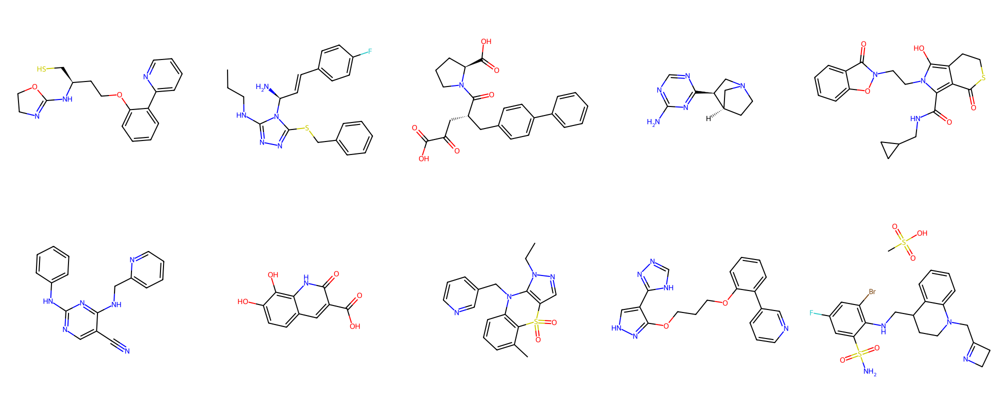

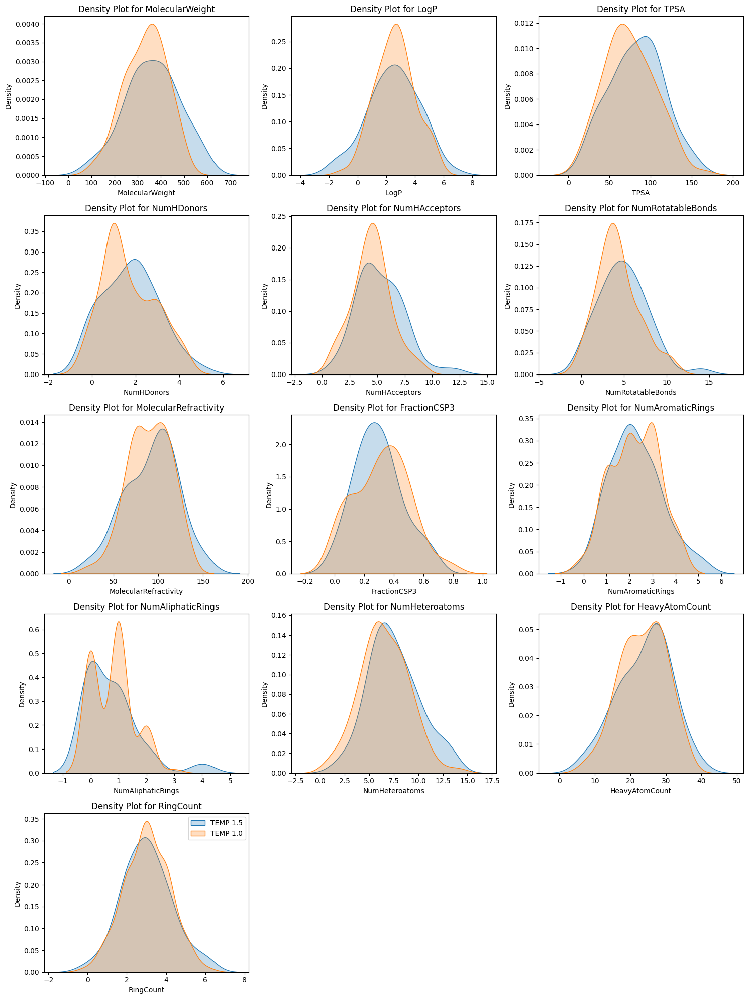

In [198]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=1.5)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 1.5')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

  1%|          | 1/100 [00:17<28:18, 17.16s/it]

Fc1cccc([C@@]2(c3ccccc3-c3cc(F)cnc3)-[C@@H]3C[C@@H](N3CCN(Cc4ccncn4)CC3)CN2)c1


  2%|▏         | 2/100 [00:19<14:08,  8.66s/it]

Nn1nccc1=N[C@H]1CC[C@@H](c2ccccc2)(c2ncccn2)C1


  3%|▎         | 3/100 [00:20<08:20,  5.16s/it]

Sc1[nH]ncn1onc1O


  4%|▍         | 4/100 [00:23<06:21,  3.98s/it]

CCn1n(CCC(N)NP(=O)(O)O)c2ccccc2c1=O


  5%|▌         | 5/100 [00:25<05:20,  3.37s/it]

N#CCc1nc(NCc2cccc(-n3cccc3F)c2)o2ncnc12


  6%|▌         | 6/100 [00:27<04:42,  3.00s/it]

N#Cc1ccc(CNCC(O)C2CCN(C/C=CI)CC2)cc1Cl


  7%|▋         | 7/100 [00:29<04:16,  2.76s/it]

(\S+-]1cc[n+]2cn[nH]1)CCc1cc(F)ccc1Br


  8%|▊         | 8/100 [00:34<05:16,  3.44s/it]

O=C(N[C@H]1C2CC3CC1C[C@H](C3)Cc1cccn(CC(F)(F)F)c1C2)c1c(F)cc2[nH]nccc2c1N1CC1COCCO1


  9%|▉         | 9/100 [00:37<04:48,  3.17s/it]

c1cnccc1C12CCN([C@@H]3C2=O)[C@@H]3n1c1csnn1


 10%|█         | 10/100 [00:38<03:55,  2.62s/it]

O=c1c(O)[nH]oc2cc3ccoc(


 12%|█▏        | 12/100 [00:42<03:12,  2.18s/it]

c1coc(CCCO)c1CN1CCC23CC4(O[C@@H](C4)[C@H]1C3)N(CCN3C2CCOCC2)c1ccccc13
O


 13%|█▎        | 13/100 [00:45<03:23,  2.34s/it]

CC(C)OCc1cc(Nn2ncnc2-c2cnn3cncc3n2)c(Cl)cc1F


 14%|█▍        | 14/100 [00:49<03:58,  2.77s/it]

Cc1c2[nH]c(=O)cc3c2C1CC(Nc1noc3ccccc3c15)C1CC(C)(C2CO4)CO3.32CF


 15%|█▌        | 15/100 [00:51<03:44,  2.64s/it]

CN(C)/C=C1/c2c(-c3ccsc3)nccc2C2CCCCC12O


 16%|█▌        | 16/100 [00:54<03:32,  2.53s/it]

c1cc2n[nH]nc2cc1CN1CCNCC2-c2ccc(O)cc21


 17%|█▋        | 17/100 [00:55<03:13,  2.33s/it]

O=S(=O)1CCF=CC2C(=O)NC3(C1)CN2


 18%|█▊        | 18/100 [00:57<02:46,  2.03s/it]

Oc1c2nnc3ccc(CCO)cn13


 19%|█▉        | 19/100 [00:59<02:52,  2.13s/it]

C(#N)c1cc[n+](NC2CCc3ccc4ncccn4c3C2)n1


 20%|██        | 20/100 [01:01<02:55,  2.19s/it]

lc1ccc2[nH]cc(SC.CCCC#CCO)c2c1CC1CCCNC1


 21%|██        | 21/100 [01:03<02:37,  1.99s/it]

Cn1cc(-c2nonc2N)c2ncnc1-2


 22%|██▏       | 22/100 [01:07<03:14,  2.49s/it]

Cn1cc(/C=C2\Cc3[nH]nc32)c2c(c1-c1n[nH]c(C4CC4)c1S2(=O)=O)CCC2


 23%|██▎       | 23/100 [01:08<02:56,  2.29s/it]

Cn1cc2ncsc(Cc3ccN4CCSC4)c2c1=O


 24%|██▍       | 24/100 [01:11<03:08,  2.48s/it]

N=C1c2[nH]c3cc(-c4c[nH]nc4-n4cnnc4)cc3c2C)ccc1Br


 25%|██▌       | 25/100 [01:14<03:09,  2.52s/it]

CC#CCOc1c2scc3c2c(nn(C3n4cc(OCN)cc4)c33)c21


 26%|██▌       | 26/100 [01:16<02:49,  2.29s/it]

O[C@]1n2/c(=O)[nH]c2n(O)ccc21


 27%|██▋       | 27/100 [01:19<03:12,  2.63s/it]

Oc1cccc(Nc2ccc3c2O[C@H]2[C@@H](O)CC[N+H]31)c1ccc3ccccc3c1


 28%|██▊       | 28/100 [01:21<02:51,  2.39s/it]

N=NN1Cc2C[C@@H]3[C@@H]21CSK.c1


 29%|██▉       | 29/100 [01:25<03:13,  2.73s/it]

O=[N+]([O-])/C=C/NS(S(=O)(=O)/c1cccc(Cn2cnnc2)c1)c1cccncc1


 30%|███       | 30/100 [01:27<03:05,  2.66s/it]

=C[C@@H]1[C@H](c2ccncc2)N[C@H]1[C@@H](NC


 31%|███       | 31/100 [01:31<03:22,  2.93s/it]

CN[C@@H]1C[C@H]1c1nc2(I)[nH]c3cccc(C(=O)Nc4cccc(C#N)c4)c2n1


 32%|███▏      | 32/100 [01:34<03:31,  3.10s/it]

C#CCN(Cc1ccc2ncnc(Nc3cc(C)c(F)cc3)c(=S)n1)S(=O)(=O)c1cccs1


 33%|███▎      | 33/100 [01:37<03:27,  3.09s/it]

=Cn11cncc1-c1c[nH]nc1CN1CCN(c2nsc3ccc4ccccc4c23)CC1


 34%|███▍      | 34/100 [01:42<03:48,  3.47s/it]

N=C(Nc1cc(=S)cccc1/C=C(/C4CC)c1c[nH]cn1)NC[S+](=O)[O-]P(=O)(O)C[N+]


 35%|███▌      | 35/100 [01:44<03:19,  3.07s/it]

O=/N/N(1CSC(COc2ccccc2O)C1)C(F)(F)F


 36%|███▌      | 36/100 [01:46<03:00,  2.81s/it]

Oc1onc(-c2onc(-c3c(F)cccc3F)n2)c1=O


 37%|███▋      | 37/100 [01:49<02:56,  2.80s/it]

CCC(OCc1sc2[nH]c3nc(-c4ns[nH]4)nc-3c2CCO)cc1F


 38%|███▊      | 38/100 [01:52<02:57,  2.86s/it]

Oc1ccc(Cc2c(-c3c[nH]c4ncc(F)cc34)[nH]c3ccccc23)cc1


 39%|███▉      | 39/100 [01:54<02:41,  2.65s/it]

COCS[C@]12CCC[C@@H](/C=N/O1)[C@@]2


 40%|████      | 40/100 [01:57<02:49,  2.83s/it]

O=C(c1ccco1)C1=CCCn2c1nc(-c1cnn3ccccc13)c(C(F)(F)F)n2


 41%|████      | 41/100 [02:00<02:49,  2.87s/it]

N#Cc1sc2c(F)cccc2c1Cc1ccc2nc(NCN4CCOC(N)C4)cc2c1]


 42%|████▏     | 42/100 [02:03<02:57,  3.06s/it]

O=C1LI.c2cccc([N+](=O)[N+](a+])c4ccccc24)c2sc[n+]([O-])c21


 43%|████▎     | 43/100 [02:06<02:41,  2.83s/it]

CP(C)/C=N/NC(=O)OCC[N+]=[N+]=O.[Cl-]


 44%|████▍     | 44/100 [02:07<02:13,  2.38s/it]

C(=Cc1nsnc1-c1ccccc1


 45%|████▌     | 45/100 [02:08<01:42,  1.86s/it]

Con1ccnc1


 46%|████▌     | 46/100 [02:10<01:44,  1.94s/it]

Cl.Clc1ccc(/C=C2\CN3CCC2CC3)cc1


 47%|████▋     | 47/100 [02:13<01:59,  2.25s/it]

Cc1c(-n2cc(Cl)c3ncnc(N(C)C)c32)sc2nc(N)nc(N)N1.CN


 48%|████▊     | 48/100 [02:16<02:05,  2.42s/it]

Oc1ccc2o(c1)N=Cc1cc2c(CSc3c(Br)cccn3)ccc(n1)O2


 49%|████▉     | 49/100 [02:17<01:53,  2.22s/it]

Cn1sc(C(=O)c2cccc(Br)c2Cl)n1


 50%|█████     | 50/100 [02:20<01:58,  2.36s/it]

C/C/N=c1\[nH]c(C(=O)Nc2c(C)cc[nH]c2C)c(N)c1N


 51%|█████     | 51/100 [02:24<02:23,  2.93s/it]

=C(NCc1ccc(Br)cc1)[C@H]1CCC2(C)C)[N+](=O)C[C@@H]1N1CC=CC12I.[3-].[K+]


 52%|█████▏    | 52/100 [02:26<01:59,  2.49s/it]

O/N=C/c1cn2ccnc2[n+]1F


 53%|█████▎    | 53/100 [02:30<02:15,  2.89s/it]

O[C@]1(CF)[C@@H](O)SC[C@H]1Nc1cc(OCc2cccc(Cl)c2)[n+]([O-])c1[O-]


 54%|█████▍    | 54/100 [02:32<02:04,  2.70s/it]

Cc1nc2ccsc2nc1-c1cc2c3cncc(C)n3c2[nH]1


 55%|█████▌    | 55/100 [02:34<01:53,  2.53s/it]

Clc1c[nH]nc1Sc1ccc([N+]([O-])F)cc1F


 56%|█████▌    | 56/100 [02:40<02:33,  3.49s/it]

COc1cc(O[C@@]2(C#N)[C@H]3[C@H](C)[C@@H](c4ccncc4)[C@@H]3[C@H](C(C)C)N3S(=O)(=O)[O-])C62.[Na+]


 57%|█████▋    | 57/100 [02:42<02:15,  3.14s/it]

N[C@@H]OcC2cc(S(=O)(=O)Nc3cccc3F)sc2C=O


 58%|█████▊    | 58/100 [02:44<01:56,  2.78s/it]

Fc1cc(Cc23c[nH]nc1OCc1cccc(c1)C3


 59%|█████▉    | 59/100 [02:45<01:28,  2.16s/it]

[c1c[nH]cn1


 60%|██████    | 60/100 [02:46<01:10,  1.76s/it]

Clc1ccn(-c2cc


 61%|██████    | 61/100 [02:49<01:33,  2.40s/it]

NS(=O)(=O)CSCc1cc(/C=C/S(=O)(=O)N2[C@@H](OC(C)(C)C)S2(=O)=O)ccc1S


 62%|██████▏   | 62/100 [02:56<02:12,  3.50s/it]

Nc1cccc2c(C3CNC3)n[nH]c12


 63%|██████▎   | 63/100 [02:58<01:55,  3.13s/it]

c1cncc(CSc2nnc(O)c3occc23)c1.Ci


 64%|██████▍   | 64/100 [03:01<01:51,  3.11s/it]

Cc1cccc2(CN3CCC3-c3cc4ccccc4o3)c(=C)oc12


 65%|██████▌   | 65/100 [03:03<01:34,  2.70s/it]

CNc1nccnc1C(=O)Nc1nccs1


 66%|██████▌   | 66/100 [03:08<02:01,  3.56s/it]

CSC[C@](=O)N(C[C@@H](C(=O)NO)C[C@@H](CNS(=O)(=O)/C=C/c1ccc(Oc4onc4C)cc1)N4O


 67%|██████▋   | 67/100 [03:12<01:57,  3.56s/it]

Cc1[cH][nH]c(CN2CCc3c3cccs3C2)c1-c1ccnn1-c1ccccc1


 68%|██████▊   | 68/100 [03:14<01:46,  3.31s/it]

NC(c1nc(N)c2cc[nH]c2s1)c1ccc2ncccc2c1


 69%|██████▉   | 69/100 [03:17<01:39,  3.20s/it]

NCc1cn2nc(CCc3cc(F)ccn3)cc(-c3ccco3)c2n1


 70%|███████   | 70/100 [03:20<01:35,  3.17s/it]

1CO[C@@H]1[C@@H](C2=NCCO2)C#CCCN1c1nncn1F


 71%|███████   | 71/100 [03:23<01:22,  2.83s/it]

O/N=c1\s[nH]c2nc-\[nH]cnc12


 72%|███████▏  | 72/100 [03:27<01:31,  3.28s/it]

C[C@@](n1scnc1=O)([C@@H](CN)OCc1cc(F)c(Br)cc1Cl)S(C)(=O)=O


 73%|███████▎  | 73/100 [03:30<01:24,  3.14s/it]

Oc1c(F)cc(-c2nc3nnccc3P(=O)([O-])O)cc1F


 74%|███████▍  | 74/100 [03:34<01:33,  3.58s/it]

C[C@@H](O=[C@@H](CC=C1C2(C=NCC#CCNS1)CC2)C[C@@H](O)[C@@H]1NCCF


 75%|███████▌  | 75/100 [03:38<01:33,  3.73s/it]

Oc1cc2cc(C3(O)CCCN(Cc4ncc(F)c(N5CCOCC5)n4)CC3)c(C2)n1


 76%|███████▌  | 76/100 [03:43<01:35,  3.98s/it]

Nc1nc(-c2cl[nH]nc2C(F)(F)F)cc2nc(C3COc4ccncc4C3)nc(N3CCOCC3)c12


 77%|███████▋  | 77/100 [03:46<01:25,  3.72s/it]

N#CCn1nnc(C2=CCC3CN(CCc4cccc(I)c4)CCC3O3)n1


 78%|███████▊  | 78/100 [03:48<01:12,  3.32s/it]

CSc1c/c(=N/NC(N)=O)csc1-c1ccsc1


 79%|███████▉  | 79/100 [03:51<01:02,  2.95s/it]

CO[C@H](CC(=O)Nc1ccsc1)N(C)C


 80%|████████  | 80/100 [03:55<01:05,  3.29s/it]

OO[C@@H](Cn1cnc(Ioc2Br)c1N(c1cc2c(Br)cccc2[nH]1)O)c1ccc23


 81%|████████  | 81/100 [03:57<00:58,  3.06s/it]

NCCCc1cn(S(=O)(=O)c2ccoc2)c2ccccc12


 82%|████████▏ | 82/100 [04:00<00:54,  3.01s/it]

I.CC(N)=N)cc1[nH]nc2sc3c(c2c1-2F)C1CCCO1


 83%|████████▎ | 83/100 [04:05<01:00,  3.54s/it]

Nc1noc2c1[N+](=O)/C1Cc3ccccc3S(=O)(=O)[O-])C(=O)N1[C@@H]2C.[Na+]


 84%|████████▍ | 84/100 [04:07<00:52,  3.27s/it]

C[C@]12/CCN3C(=O)CCC1CCN4CCN(F)C4.Cl


 85%|████████▌ | 85/100 [04:10<00:46,  3.11s/it]

O=S(=O)(Cscc1Cc1c[nH]cn1)c1ccc(/C=I)s1


 86%|████████▌ | 86/100 [04:13<00:43,  3.12s/it]

CC(=O)c1ccc2c(c1)nc(-c1cno(C)n1)n2CC1CCNCC1


 87%|████████▋ | 87/100 [04:16<00:38,  2.93s/it]

Oc1nsc(N2C3CCC2C(c2ncccc2O)N3)c1Br


 88%|████████▊ | 88/100 [04:20<00:38,  3.17s/it]

O=c1oc2c(S[C@@@H]3CC3)cc=c3n(Cc4ccccc4)cc2c2c1CCO-2


 89%|████████▉ | 89/100 [04:23<00:36,  3.36s/it]

CO[N+]([O-])c1cccc(C(=O)n2nnc3c4c([nH]c3c2)CCSCC42)c1


 90%|█████████ | 90/100 [04:27<00:35,  3.53s/it]

c1cc([128nnn1-c1ccc(OC2CCNCC2)cn1)cc(-c1cccs1)c1cccnc12


 91%|█████████ | 91/100 [04:32<00:34,  3.80s/it]

Nc1c2csc(F)c2[n+]2c5cc([Z7O)sc5CCP(N)(O)c43CC5CC3CN5)c12.[I-]


 92%|█████████▏| 92/100 [04:37<00:33,  4.19s/it]

CC[C@@H]1O[C@H]4CC2(C)c2s[nH]c3c(=/C4c4cccc(SC5CO)c4OC)nc(F)c23)[C@H]1O


 93%|█████████▎| 93/100 [04:40<00:26,  3.75s/it]

CClc1ccc(C2CNCC2/N=N\c2ccc(C(C)C)o2)s1


 94%|█████████▍| 94/100 [04:44<00:23,  3.97s/it]

NS(=O)(=OsP(=O)(O)n1)C[C@H](c2ccc3c(c2)OCCO3)CS(=O)(=O)O.O)C(F)F


 95%|█████████▌| 95/100 [04:45<00:15,  3.13s/it]

C/C=C(\N)C(=O)O


 96%|█████████▌| 96/100 [04:50<00:14,  3.67s/it]

COc1ncc(CS/C(C)=N\S(=O)(=O)c2ccc([N+](=O)[O-])cc2)c(C(F)(F)F)c1.O=CNO


 97%|█████████▋| 97/100 [04:52<00:09,  3.28s/it]

Brc1cccc(Oc2ccc(Nc3c[nH]nc3)cc2)c1


 98%|█████████▊| 98/100 [04:53<00:05,  2.54s/it]

Br.Cl.[Br-]


 99%|█████████▉| 99/100 [05:04<00:04,  4.90s/it]

(=C1/C\CCCCC1COCO\


100%|██████████| 100/100 [05:05<00:00,  3.06s/it]

FN(C1CN2CCOCC2)CC1.Br

Percent valid: 25.000%
Percent unique: 100.000%
['CNc1nccnc1C(=O)Nc1nccs1', 'NCc1cn2nc(CCc3cc(F)ccn3)cc(-c3ccco3)c2n1', 'NS(=O)(=O)CSCc1cc(/C=C/S(=O)(=O)N2[C@@H](OC(C)(C)C)S2(=O)=O)ccc1S', 'Cn1sc(C(=O)c2cccc(Br)c2Cl)n1', 'CC(C)OCc1cc(Nn2ncnc2-c2cnn3cncc3n2)c(Cl)cc1F', 'Cl.Clc1ccc(/C=C2\\CN3CCC2CC3)cc1', 'Oc1ccc(Cc2c(-c3c[nH]c4ncc(F)cc34)[nH]c3ccccc23)cc1', 'CCn1n(CCC(N)NP(=O)(O)O)c2ccccc2c1=O', 'CP(C)/C=N/NC(=O)OCC[N+]=[N+]=O.[Cl-]', 'CO[C@H](CC(=O)Nc1ccsc1)N(C)C', 'C/C=C(\\N)C(=O)O', 'O', 'N#Cc1ccc(CNCC(O)C2CCN(C/C=CI)CC2)cc1Cl', 'Brc1cccc(Oc2ccc(Nc3c[nH]nc3)cc2)c1', 'Oc1nsc(N2C3CCC2C(c2ncccc2O)N3)c1Br', 'C[C@@](n1scnc1=O)([C@@H](CN)OCc1cc(F)c(Br)cc1Cl)S(C)(=O)=O', 'c1cnccc1C12CCN([C@@H]3C2=O)[C@@H]3n1c1csnn1', 'NCCCc1cn(S(=O)(=O)c2ccoc2)c2ccccc12', 'Br.Cl.[Br-]', 'COc1ncc(CS/C(C)=N\\S(=O)(=O)c2ccc([N+](=O)[O-])cc2)c(C(F)(F)F)c1.O=CNO', 'Nc1cccc2c(C3CNC3)n[nH]c12', 'Clc1c[nH]nc1Sc1ccc([N+]([O-])F)cc1F', 'COCS[C@]12CCC[C@@H](/C=N/O1)[C@@]2', 'CN(C)/C=C1/c2c(-c3cc

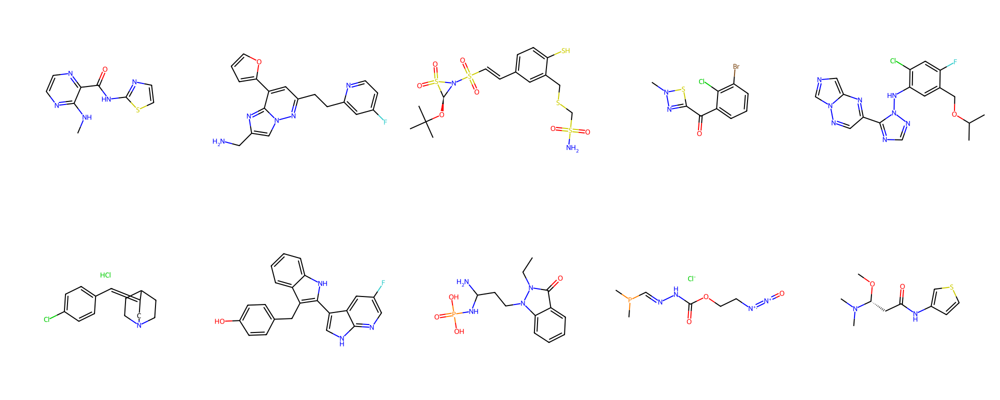

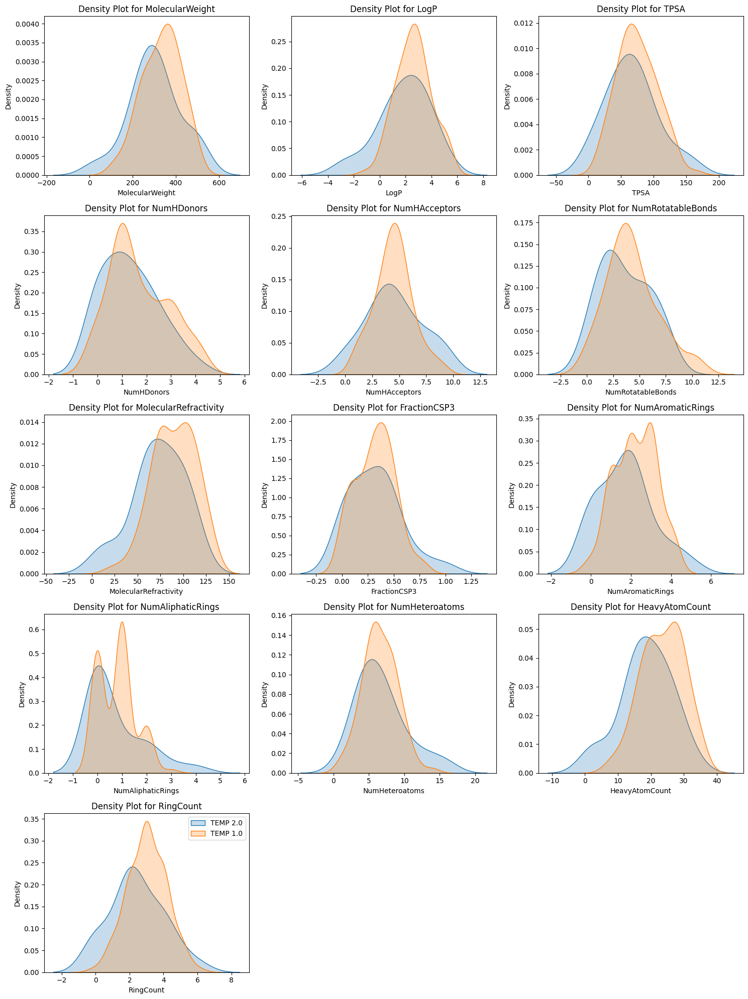

In [199]:
# Temperature Studies Original Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=1.9)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 2.0')
    sns.kdeplot(gen_data[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

# Fine-Tuning for Cystic Fibrosis


[BindingBD](https://www.bindingdb.org/rwd/jsp/dbsearch/PrimarySearch_ki.jsp?target=Cystic+fibrosis+transmembrane+conductance+regulator&tag=tg&kiunit=nM&icunit=nM&column=ki&submit=Search&energyterm=kJ%2Fmole) Used for collecting compounds for cystic fibrosis transmembrane conductance regulator.

For citing:

  BindingDB in 2015: A public database for medicinal chemistry, computational chemistry and systems pharmacology. M.K. Gilson, T. Liu, M. Baitaluk, G. Nicola, L. Hwang and J. Chong Nucleic Acids Research 44:D0145-D1053, doi: 10.1093/nar/gkv1072

In [174]:
import tensorflow as tf
model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_v2.keras"
model = tf.keras.models.load_model(model_path)

# Load and preprocess the fine-tuning dataset
#
fine_tuning_data = pd.read_csv("/content/drive/MyDrive/Datasets/chemdata/BindingDB/cystic_fibrosis.tsv", delimiter='\t')
fine_tuning_smiles_list = fine_tuning_data['Ligand SMILES'].drop_duplicates().tolist()

# Encode and pad the fine-tuning SMILES strings
encoded_fine_tuning_smiles_list = [
    [chars_to_index['<SOS>']] + [chars_to_index.get(char, chars_to_index['<PAD>']) for char in smiles] + [chars_to_index['<EOS>']]
    for smiles in fine_tuning_smiles_list
]
padded_fine_tuning_smiles_list = pad_sequences(encoded_fine_tuning_smiles_list, maxlen=max_length, padding='post', value=chars_to_index['<PAD>'])

# Convert to numpy array
X_fine_tune = np.array(padded_fine_tuning_smiles_list)

# Create target sequences for fine-tuning
y_fine_tune = np.zeros_like(X_fine_tune)
y_fine_tune[:, :-1] = X_fine_tune[:, 1:]
y_fine_tune[:, -1] = chars_to_index['<PAD>']

# Optionally split into training and validation sets
X_fine_tune_train, X_fine_tune_val, y_fine_tune_train, y_fine_tune_val = train_test_split(X_fine_tune, y_fine_tune, test_size=0.2, random_state=42)

# Print number of fine-tuning SMILES strings
print(len(fine_tuning_smiles_list))

1053


In [175]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 153)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 153, 128)       │          5,888 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (1, 153, 128)          │              0 │ embedding[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention      │ (1, 153, 128)          │        263,808 │ add[0][0], add[0][0]   │
│ (MultiHeadAttention)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_66 (Dropout)      │ (1, 153, 128)          │              0 │ multi_head_attention[… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_1 (Add)               │ (1, 153, 128)          │              0 │ add[0][0],             │
│                           │                        │                │ dropout_66[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization       │ (1, 153, 128)          │            256 │ add_1[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (1, 153, 128)          │         16,512 │ layer_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (1, 153, 128)          │         16,512 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_67 (Dropout)      │ (1, 153, 128)          │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_2 (Add)               │ (1, 153, 128)          │              0 │ layer_normalization[0… │
│                           │                        │                │ dropout_67[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_1     │ (1, 153, 128)          │            256 │ add_2[0][0]            │
│ (LayerNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multi_head_attention_1    │ (1, 153, 128)          │        263,808 │ layer_normalization_1… │
│ (MultiHeadAttention)      │                        │                │ layer_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_69 (Dropout)      │ (1, 153, 128)          │              0 │ multi_head_attention_… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_3 (Add)               │ (1, 153, 128)          │              0 │ layer_normalization_1… │
│                           │                        │                │ dropout_69[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ layer_normalization_2     │ (1, 153, 128)          │            256 │ add_3[0][0]            │
│ (LayerNormalization) 

 Total params: 7,171,723 (27.36 MB)

 Trainable params: 2,390,574 (9.12 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,781,149 (18.24 MB)

In [176]:
for i, layer in enumerate(model.layers):
  print(i + 1, layer.name)

1 input_layer
2 embedding
3 add
4 multi_head_attention
5 dropout_66
6 layer_normalization
7 dense
8 dense_1
9 dropout_67
10 layer_normalization_1
11 multi_head_attention_1
12 dropout_69
13 layer_normalization_2
14 dense_2
15 dense_3
16 dropout_70
17 layer_normalization_3
18 multi_head_attention_2
19 dropout_72
20 layer_normalization_4
21 dense_4
22 dense_5
23 dropout_73
24 layer_normalization_5
25 multi_head_attention_3
26 dropout_75
27 layer_normalization_6
28 dense_6
29 dense_7
30 dropout_76
31 layer_normalization_7
32 multi_head_attention_4
33 dropout_78
34 layer_normalization_8
35 dense_8
36 dense_9
37 dropout_79
38 layer_normalization_9
39 multi_head_attention_5
40 dropout_81
41 layer_normalization_10
42 dense_10
43 dense_11
44 dropout_82
45 layer_normalization_11
46 multi_head_attention_6
47 dropout_84
48 layer_normalization_12
49 dense_12
50 dense_13
51 dropout_85
52 layer_normalization_13
53 multi_head_attention_7
54 dropout_87
55 layer_normalization_14
56 dense_14
57 dense_15


In [177]:
## Max 60
num_layers_to_freeze = 18

# Freeze all layers
for layer in model.layers[:num_layers_to_freeze]:
    layer.trainable = False

# Compile the model with a lower learning rate for fine-tuning
fine_tune_optimizer = Adam(learning_rate=ExponentialDecay(
    initial_learning_rate=1e-4,  # Lower learning rate for fine-tuning
    decay_steps=10000,
    decay_rate=0.9,
    staircase=True
), clipvalue=CLIPVALUE)

model.compile(loss='sparse_categorical_crossentropy', optimizer=fine_tune_optimizer, metrics=['accuracy'])

# Configure early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

Epoch 1/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 207s 10s/step - accuracy: 0.8603 - loss: 0.5433 - val_accuracy: 0.8773 - val_loss: 0.4115
Epoch 2/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.8836 - loss: 0.3780 - val_accuracy: 0.8936 - val_loss: 0.3394
Epoch 3/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8963 - loss: 0.3288 - val_accuracy: 0.9062 - val_loss: 0.2980
Epoch 4/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9054 - loss: 0.2938 - val_accuracy: 0.9147 - val_loss: 0.2689
Epoch 5/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9133 - loss: 0.2682 - val_accuracy: 0.9221 - val_loss: 0.2490
Epoch 6/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9189 - loss: 0.2533 - val_accuracy: 0.9267 - val_loss: 0.2327
Epoch 7/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9249 - loss: 0.2327 - val_accuracy: 0.9307 - val_loss: 0.2200
Epoch 8/25
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9287 - loss: 0.2220 - val_accuracy: 0.9345 - 

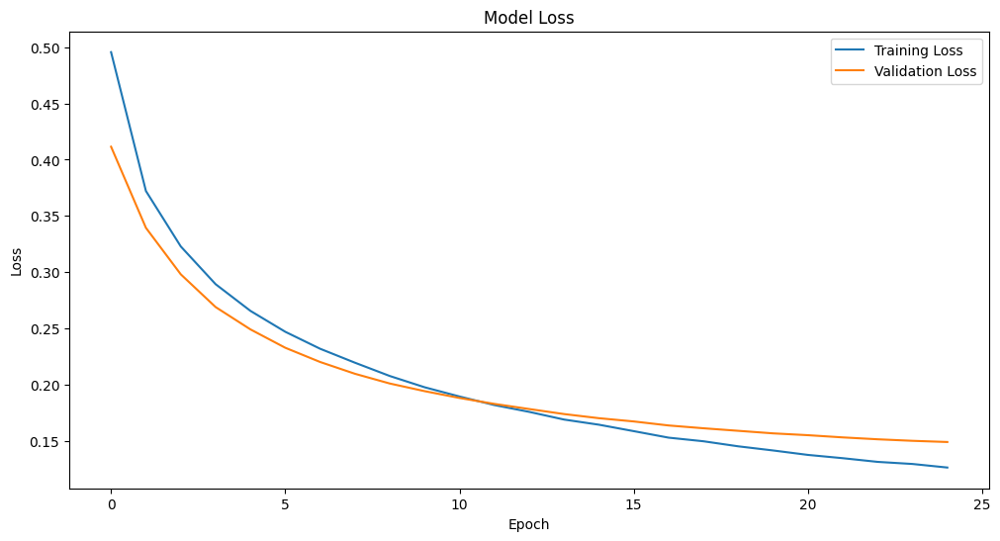

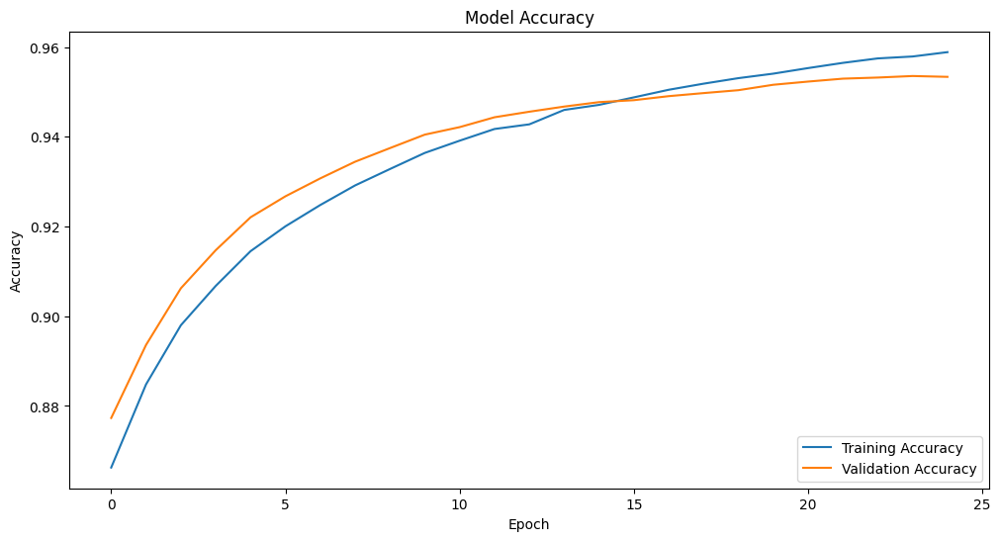

In [178]:
# Fine-tune the model using the fine-tuning dataset
fine_tune_history = model.fit(
    X_fine_tune_train, y_fine_tune_train,
    epochs=25,  # Fewer epochs for fine-tuning
    batch_size=64,
    validation_data=(X_fine_tune_val, y_fine_tune_val),
    callbacks=[early_stopping]
)

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(fine_tune_history.history['loss'], label='Training Loss')
plt.plot(fine_tune_history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.show()

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(fine_tune_history.history['accuracy'], label='Training Accuracy')
plt.plot(fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

In [179]:
# Generate a new SMILES string
generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=TEMPERATURE)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_fine_tuned = evaluate_generated_smiles(generated_smiles_list, fine_tuning_smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_fine_tuned)

  1%|          | 1/100 [00:16<26:24, 16.00s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C4CC4)sc-23)s1


  2%|▏         | 2/100 [00:19<13:40,  8.37s/it]

Cc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1cc([nH]n1)C(F)(F)F


  3%|▎         | 3/100 [00:20<08:28,  5.25s/it]

CC(C)CSc1ccn(n1)C(C)(C)C


  4%|▍         | 4/100 [00:24<07:46,  4.86s/it]

COc1ccc(cc1)[C@H](Oc1cc(Cl)c(C)cc1-c1ccsc1)C(=O)NC1CC(O)(CC1)C(F)(F)F


  5%|▌         | 5/100 [00:27<06:30,  4.11s/it]

CN1C(=O)CC[c2]ccc(NC(=O)c3cccc(n3)C(C)(C)C)c21


  6%|▌         | 6/100 [00:29<05:25,  3.46s/it]

Cc1cn2c3C(=O)c4cc(Cl)ccc4nc-2c(N)n1


  7%|▋         | 7/100 [00:31<04:16,  2.76s/it]

COc1ccc(cc1)C1CCCN(C1


  8%|▊         | 8/100 [00:36<05:24,  3.53s/it]

CC1(C)CC[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCCC2)nc1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


  9%|▉         | 9/100 [00:38<04:44,  3.13s/it]

COc1cccc(c1)C(=O)c1c[nH]c2ccccc2c1=O


 10%|█         | 10/100 [00:41<04:33,  3.04s/it]

CN(C)CCOc1ccc(cc1)-c1nc2ccccc2n(Cc2ccccc2)c1=O


 11%|█         | 11/100 [00:43<04:00,  2.70s/it]

COc1occ(c1C)/N=C(\S)NC1CCC(CC1)F


 12%|█▏        | 12/100 [00:48<04:55,  3.36s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 13%|█▎        | 13/100 [00:52<05:09,  3.56s/it]

[O-][N+](=O)c1cccc(c1)-n1ccc2cc(-c3nc(nc4CCO)c(-c3ccc(F)cc3)nc2c1=O


 14%|█▍        | 14/100 [00:54<04:43,  3.30s/it]

CC(C)(CO)c1cc2n(C)c(cc3C=O)c(=O)n(C)c2cc1C#N


 15%|█▌        | 15/100 [00:58<04:36,  3.26s/it]

OC(=O)c1ccc(cc1)-c1csc(NC(=O)C2(CC2)c2ccc3OCOc3c2)n1


 16%|█▌        | 16/100 [01:01<04:29,  3.21s/it]

Cc1ccc(cc1-c1cc2cc(CN(C)CC)c(F)cc2[nH]1)[N+]([O-])=O


 17%|█▋        | 17/100 [01:03<03:58,  2.88s/it]

Brc1ccc(\C=C2/N(Cc3ccccn3)C2=O)cc1


 18%|█▊        | 18/100 [01:05<03:44,  2.74s/it]

CCCN1CCC[C@@H]2c3c(cccc3C(=O)N(C)C)CCN21


 19%|█▉        | 19/100 [01:08<03:32,  2.63s/it]

Cc1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1N


 20%|██        | 20/100 [01:10<03:29,  2.62s/it]

Cl.Cn1c2c(cccc2c2cnn(Cc3ccccc3)c12)C1CNC1


 21%|██        | 21/100 [01:15<04:27,  3.38s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(NCCC2)nc1)-n1ccc(OCC2(CC2)C(F)(F)F)n1


 22%|██▏       | 22/100 [01:19<04:38,  3.57s/it]

CC1CCN(C1)n1nc(C(=O)NS(=O)(=O)c1ccc(NC2CC2)nc1)-n1ccc(OCCC2CC2)n1


 23%|██▎       | 23/100 [01:22<04:18,  3.35s/it]

Cc1ccc2[nH]c3CCCC3CN2c2nc(-c3cccc(Cl)c3)ccc12


 24%|██▍       | 24/100 [01:27<04:39,  3.67s/it]

COc1ccc(NC(=O)C2(CC2)c2ccc3OC(F)(F)Oc3c2)cc1OC1(CC1)c2ccc(O)cc2[nH]c2c1


 25%|██▌       | 25/100 [01:30<04:34,  3.67s/it]

CCn1c2c3C(NOc4ccccc4-n3c(-c3ccccc3)c2c(=O)n(C)c1=O)c1ccc(F)o1


 26%|██▌       | 26/100 [01:35<04:54,  3.98s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 27%|██▋       | 27/100 [01:40<05:15,  4.32s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 28%|██▊       | 28/100 [01:43<04:37,  3.85s/it]

NC(=O)c1cnc(sc1Nc1ccccc1)S(=O)(=O)c1ccc(Br)cc1


 29%|██▉       | 29/100 [01:48<05:09,  4.36s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OC[C@@H](O)C2(CCC2)C(F)(F)F)n1


 30%|███       | 30/100 [01:53<05:20,  4.58s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(NCCC2)nc1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


 31%|███       | 31/100 [01:58<05:17,  4.60s/it]

CC1CCN(C1)c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NC2CC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 32%|███▏      | 32/100 [02:01<04:42,  4.16s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C4CC4)sc-23)s1


 33%|███▎      | 33/100 [02:03<03:59,  3.58s/it]

Nc1nc(sc1-c1cccs1)-c1ccsc1C(=O)NC1CC1


 34%|███▍      | 34/100 [02:06<03:31,  3.20s/it]

COc1cccc(NC(=O)c2c[nH]c3ccccc3c2=O)c1


 35%|███▌      | 35/100 [02:09<03:30,  3.23s/it]

Cc1cccc(c1)C1CN(CCc2[nH]c3c(C)c(C)cc(C)c3c1=O)-c1ccccc1


 36%|███▌      | 36/100 [02:13<03:32,  3.32s/it]

CC(=O)N1CCN(c2nnc(o2)-c2nc(nc(NCc3ccccc3)n2)-c2cccnc2)CC1


 37%|███▋      | 37/100 [02:15<03:15,  3.10s/it]

Cc1nc2ccccc2n1Cc1cc([nH]c2ncccc12)-c1ccccc1


 38%|███▊      | 38/100 [02:20<03:50,  3.72s/it]

C[C@H](OC(=O)Cc1ccc(cc1)N(C1=N[C@@H](C(=O)N(C)C)C1)c1ccccc1)C1(CC1)c1ccc2OC(F)(F)COc2c1


 39%|███▉      | 39/100 [02:23<03:32,  3.48s/it]

COc1ccc(COc2ccc(Cl)cc2-c2ccnc(n2)N2CCCCC2)c(C)c1


 40%|████      | 40/100 [02:28<03:56,  3.94s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCC2)n1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


 41%|████      | 41/100 [02:33<04:05,  4.15s/it]

CC1(C)C[C@@H](Oc2nc(cs2)C(=O)N1Cc1ccc([N+]([O-])=O)c(Oc2ccccc2)c1)[N+]([O-])=O


 42%|████▏     | 42/100 [02:36<03:36,  3.73s/it]

Ic1ccc(F)c(-c2nnc(o2)-c2ccc(OCc3ccccc3)cc2)c1


 43%|████▎     | 43/100 [02:39<03:24,  3.58s/it]

COc1ccc(C(=O)c2c(OCc3cccnc3)c3c(ccc2N)-c2ccc(Cl)cc2)cc1


 44%|████▍     | 44/100 [02:42<03:04,  3.29s/it]

CC(C)C1(CCOCC1)C(=O)c1cc(ccc1O)-c1cccc(Cl)c1


 45%|████▌     | 45/100 [02:47<03:31,  3.85s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 46%|████▌     | 46/100 [02:50<03:11,  3.55s/it]

CCC(=O)c1cccc(c1)sc1cc(OC)c(OC)cc1c1cccc(OC)c1F


 47%|████▋     | 47/100 [02:53<02:59,  3.38s/it]

[O-][N+](=O)c1ccc(cc1)-c1nc2ccccc2n(Cc2ccccc2)c1=O


 48%|████▊     | 48/100 [02:56<03:03,  3.53s/it]

COc1cccc(c1)-c1n-2c(C(Nc3ccccc-23)c2ccccc2)c2n(C)c(=O)n(C)c(=O)c12


 49%|████▉     | 49/100 [03:00<03:02,  3.58s/it]

COc1ccc(F)cc1C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


 50%|█████     | 50/100 [03:03<02:43,  3.27s/it]

[O-][N+](=O)c1ccc2ncnc(Nc3cccc(c3)Cl)c2c1


 51%|█████     | 51/100 [03:07<02:54,  3.56s/it]

C[C@@](O)(CN)[C@H](C(=O)N1CCn2c(ncc2C1)c1ccc(Cl)cc1)c1ccc2c1CC(=O)NC2=O


 52%|█████▏    | 52/100 [03:10<02:49,  3.54s/it]

N=C(NCc1ccc(Br)cc1)c1ccc2OCc3c(ccc(n3)S(=O)(=O)c3)C(F)(F)F


 53%|█████▎    | 53/100 [03:15<02:59,  3.81s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCN(CCC2CC2)C1=O


 54%|█████▍    | 54/100 [03:19<03:00,  3.93s/it]

Cc1ccc2n(CCC(=O)Nc3nc(nc(N4CCN(C)C(=O)C4)s3)-c3c2n(C)c1=O)-c1cccc(C)c1


 55%|█████▌    | 55/100 [03:22<02:39,  3.54s/it]

O=C(NCCc1ccccc1)-n1cc2c(NCc3ccccc3)ncnc2c1=O


 56%|█████▌    | 56/100 [03:26<02:52,  3.91s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 57%|█████▋    | 57/100 [03:30<02:48,  3.91s/it]

CCCCCc1ccc(Oc2cc(NC(=O)[C@H]3Cc4ccccc4CN3C(=O)[C@H]3CCC)ccc2C)cc1


 58%|█████▊    | 58/100 [03:34<02:34,  3.69s/it]

O=C(c1cccc(c1)[N+]([O-])=O)C1(CC1)c1ccncc1-c1ccccc1


 59%|█████▉    | 59/100 [03:37<02:30,  3.68s/it]

CC(C)(CO)c1cc(NC(=O)C2(CC2)c2ccc3OCOc3c2)c(Br)cc1OC[C@@H](O)CO


 60%|██████    | 60/100 [03:41<02:30,  3.77s/it]

Cc1nc(NC(=O)C2(CC2)c2ccc3OCOc3c2)sc1-c1csc(NC(=O)C2(CC2)C(F)(F)F)n1


 61%|██████    | 61/100 [03:43<02:06,  3.26s/it]

OC(=O)c1cccc2c(n[nH]c12)-c1ccccc1F


 62%|██████▏   | 62/100 [03:46<02:01,  3.21s/it]

Cc1cccc2[nH]c3CCN(Cc3c12)C(=O)c1cc([nH]n1)C(F)(F)F


 63%|██████▎   | 63/100 [03:50<02:03,  3.33s/it]

Cc1ccc(o1)C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


 64%|██████▍   | 64/100 [03:54<02:06,  3.51s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCCC1=O


 65%|██████▌   | 65/100 [03:57<02:01,  3.48s/it]

FC(F)(F)CNc1nc(C(=O)NCc2ccc(Oc3ccccc3)cc2)cc(NC2CCCCC2)n1


 66%|██████▌   | 66/100 [04:00<01:48,  3.19s/it]

CCN(CC)C(=O)c1ccc(Nc2nc(cs2)-c2ccccn2)cc1


 67%|██████▋   | 67/100 [04:03<01:45,  3.20s/it]

COc1ccc(cc1Cl)N(C1CC1)[C@H]1CCN(C1)c1cccc2c1COC(=O)CO2


 68%|██████▊   | 68/100 [04:05<01:32,  2.88s/it]

Ic1ccc(cc1)-c1nc2cc(O)ccc2c(=O)n1CC2


 69%|██████▉   | 69/100 [04:09<01:36,  3.12s/it]

CC(C)CCc1cc(NC(=O)C2(CC2)c2ccc3OCOc3c2)ccc1OCC1CCCCn2c1ccccc12


 70%|███████   | 70/100 [04:12<01:33,  3.10s/it]

COc1cccc2c3C(=NO)C(Br)=C(C)Nc3ccccc3n(Cc3ccccc3)c12


 71%|███████   | 71/100 [04:16<01:40,  3.45s/it]

COc1ccc2c(nn(CC(=O)N(C3CC3)c3ccc4nc(C)oc4c3)c(=O)c2c1)-c1cccc(OC(C)C)c1


 72%|███████▏  | 72/100 [04:19<01:28,  3.16s/it]

CCCc1cc(no1)-c1cncc(NC(=O)c2ccc(Cl)cc2)c1


 73%|███████▎  | 73/100 [04:20<01:08,  2.54s/it]

c1ccc(cc1)C1CCNCC1


 74%|███████▍  | 74/100 [04:22<01:03,  2.45s/it]

COc1ccc(Cl)cc1C1=Nn2c(nnc2-c2ccccn2)C1


 75%|███████▌  | 75/100 [04:25<01:05,  2.61s/it]

CCN(CC)C(=O)c1ccc(cc1)-c1nc2ccccc2n(Cc2ccccc2)c1=O


 76%|███████▌  | 76/100 [04:28<01:07,  2.79s/it]

Nc1c2c(cnn1C(=O)c1ccccc1)C(=O)NCCN1CCC(Oc3ccccc3)CC1


 77%|███████▋  | 77/100 [04:30<00:54,  2.38s/it]

COc1ccccc1C/C=C\c1ccsc1


 78%|███████▊  | 78/100 [04:34<01:07,  3.05s/it]

CC1(C)C[C@H]2N1c1nc(ccc1C(=O)NS(=O)(=O)c1c(CCC2)nc(NCC2(CC2)C(F)(F)F)nc1OC1CC1


 79%|███████▉  | 79/100 [04:39<01:16,  3.62s/it]

Cn1c2c3[C@H](O[C@H](CO)[C@@H](O)Cn3c(-c3cccc(c3)C(F)(F)F)c2c(=O)n(C)c1=O)c1cccc(Cl)n1


 80%|████████  | 80/100 [04:43<01:11,  3.56s/it]

O=C(Nc1nc2ccccc2c2cc(Cl)cnc12)c1ccc2c1)c(Cl)c(O)c(O)c2cc1


 81%|████████  | 81/100 [04:46<01:07,  3.57s/it]

Nc1cc(ccc1NC(=O)c1cncc([N+]([O-])([O-])[O-])c1)-c1cccc(Cl)c1


 82%|████████▏ | 82/100 [04:48<00:56,  3.13s/it]

Nc1nc(-c2ccco2)c2ncn(Cc3ccccc3)c2n1


 83%|████████▎ | 83/100 [04:53<01:02,  3.67s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCCC2)n1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


 84%|████████▍ | 84/100 [04:54<00:47,  2.94s/it]

CCc1c(\C=C2/CN(CC(C)


 85%|████████▌ | 85/100 [04:58<00:45,  3.04s/it]

[O-][N+](=O)c1cccc(c1)-c1nc2cc(Cl)ccc2n(Cc2ccccc2)c1=O


 86%|████████▌ | 86/100 [05:00<00:41,  2.93s/it]

COc1ccc2cccCNC(=O)c3c2n1CCN(Cc1cccc(Cl)c1)CC3


 87%|████████▋ | 87/100 [05:04<00:39,  3.07s/it]

CCOc1ccc(Cl)cc1cc1CN[C@H]1CCCN(C1=O)C(=O)Nc1cccc(OCCCl)c1


 88%|████████▊ | 88/100 [05:07<00:37,  3.14s/it]

CC(C)[C@H](NC(=O)[C@H](Cc1ccccc1)NC(=O)N1CCOCC1)c1ccccc1


 89%|████████▉ | 89/100 [05:11<00:37,  3.39s/it]

COC(=O)c1ccc(cc1)[C@H](O)[C@H](CC(C)(C)c1ccccc1)C(C)(C)c1cccc(O)c1


 90%|█████████ | 90/100 [05:15<00:35,  3.57s/it]

Cc1oc(C)c2cc1CCC1CN(Cc3ccccc3)CCN(c3ccc(c3)C(O)=O)S(=O)(=O)N1=O)CC2


 91%|█████████ | 91/100 [05:19<00:32,  3.62s/it]

O=C(Oc1cccc2[nH]c3CCN(Cc3c12)C(=O)c1cc([nH]n1)C(F)(F)F)C(F)(F)F


 92%|█████████▏| 92/100 [05:22<00:28,  3.59s/it]

Fc1ccc(cc1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccccc1


 93%|█████████▎| 93/100 [05:25<00:23,  3.30s/it]

C[C@@](O)(CSc1ccc(-c2ccc(F)cc2)cc1)C(F)(F)F


 94%|█████████▍| 94/100 [05:29<00:20,  3.48s/it]

Cc1cc(F)ccc1c1n(C(=O)NC[C@@H]2CCCO2)c(=O)c2sc(NC(=O)C(C)(C)C)nc21


 95%|█████████▌| 95/100 [05:32<00:16,  3.29s/it]

COc1ccc(CNc2nc(cs2)-c2sc(NC(=O)C(C)(C)C)nc2C)o1


 96%|█████████▌| 96/100 [05:34<00:12,  3.11s/it]

CC(C)(O)C(=O)N[C@H]1CCC(=O)N(C1=O)c1ccc(Cl)cc1


 97%|█████████▋| 97/100 [05:37<00:08,  2.87s/it]

Cc1cc(C#N)c2cc3c(CNC(C)=O)cc(C)nc3cc2c1


 98%|█████████▊| 98/100 [05:39<00:05,  2.78s/it]

Cc1cc(C)c2c1/C=C(\C#N)C(=O)Nc1ccc(Cl)cc1C


 99%|█████████▉| 99/100 [05:43<00:03,  3.03s/it]

COc1cccc(c1)C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


100%|██████████| 100/100 [05:46<00:00,  3.46s/it]

O=C(Nc1ccc(Cl)cc1)C1CCN(C1.O=C(O)/C=C/C(=O)O)C(=O)O

Percent valid: 70.000%
Percent unique: 78.571%
['CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1', 'Fc1ccc(cc1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccccc1', 'CN(C)CCOc1ccc(cc1)-c1nc2ccccc2n(Cc2ccccc2)c1=O', 'CC(=O)N1CCN(c2nnc(o2)-c2nc(nc(NCc3ccccc3)n2)-c2cccnc2)CC1', 'COc1cccc(c1)C(=O)c1c[nH]c2ccccc2c1=O', 'COc1occ(c1C)/N=C(\\S)NC1CCC(CC1)F', 'Cc1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1N', 'COc1ccc(F)cc1C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1', 'COc1ccc(Cl)cc1C1=Nn2c(nnc2-c2ccccn2)C1', 'CC(C)C1(CCOCC1)C(=O)c1cc(ccc1O)-c1cccc(Cl)c1', 'COc1ccccc1C/C=C\\c1ccsc1', 'COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C4CC4)sc-23)s1', 'CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(NCCC2)nc1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1', 'CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1', 'COc1cccc(c1)C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1', 'CC(C)[C@H](NC(=O)[C@H](Cc1ccccc1)NC(=

In [123]:
# Evaluate the fine-tuned model
fine_tune_loss, fine_tune_accuracy = model.evaluate(X_fine_tune_val, y_fine_tune_val)
print(f"Fine-Tune Loss: {fine_tune_loss}, Fine-Tune Accuracy: {fine_tune_accuracy}")

# Save the fine-tuned model
model.save("/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_fine_tuned_F18.keras")
model.save("/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_fine_tuned_F18.h5")


7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.9583 - loss: 0.1384 
Fine-Tune Loss: 0.14135213196277618, Fine-Tune Accuracy: 0.9572839736938477


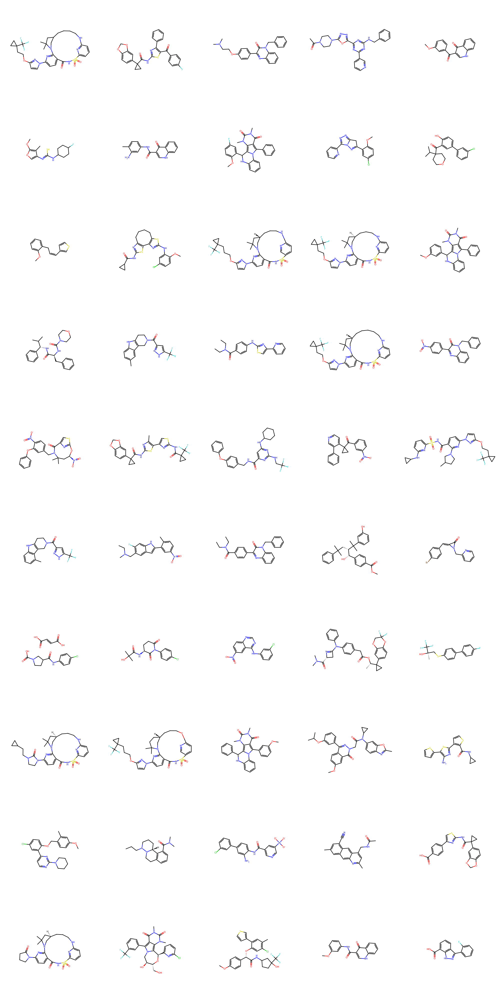

In [180]:
# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_fine_tuned[:50]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

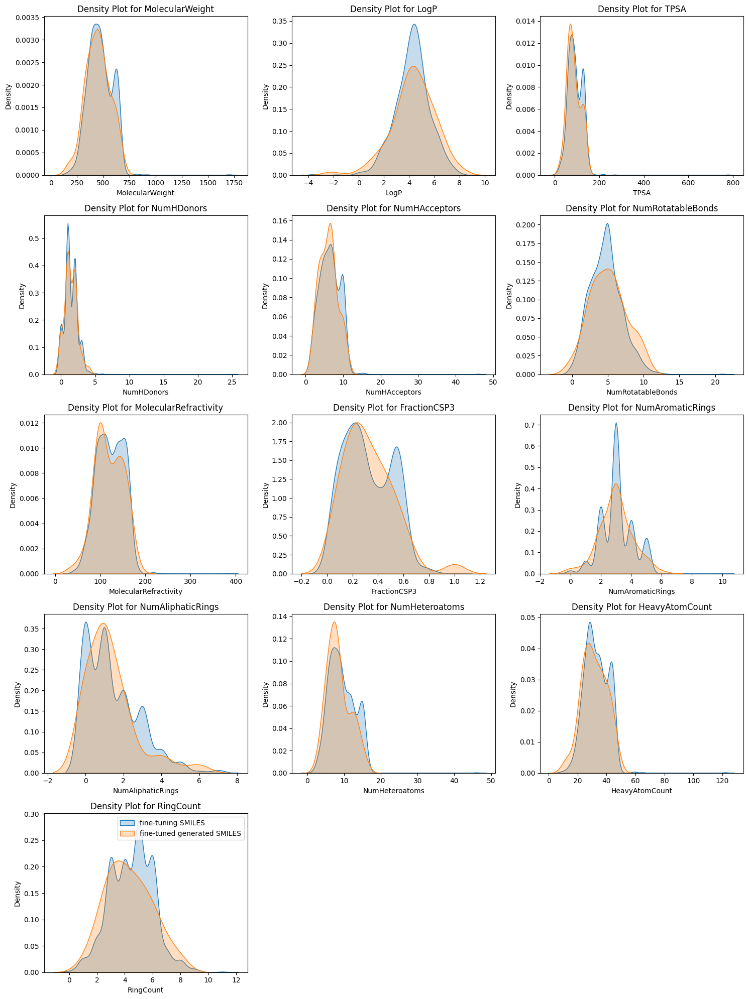

In [172]:
# Create dataframes from generated SMILES data to store molecular descriptors
fine_tuning_df = pd.DataFrame(fine_tuning_smiles_list, columns=['SMILES'])
generated_df_fine_tuned = pd.DataFrame(unique_valid_smiles_fine_tuned, columns=['SMILES'])

# Apply the descriptor function to each row in the dataframe
descriptor_columns_fine_tuned = fine_tuning_df['SMILES'].apply(compute_descriptors)
descriptor_columns_gen_fine_tuned = generated_df_fine_tuned['SMILES'].apply(compute_descriptors)

# Convert the series of dictionaries into a DataFrame
descriptors_fine_tuned_df = pd.DataFrame(descriptor_columns_fine_tuned.tolist())
descriptors_gen_df_fine_tuned = pd.DataFrame(descriptor_columns_gen_fine_tuned.tolist())

# Merge the descriptors back into the original dataframe
fine_tuning_data = pd.concat([fine_tuning_df, descriptors_fine_tuned_df], axis=1)
gen_data_fine_tuned = pd.concat([generated_df_fine_tuned, descriptors_gen_df_fine_tuned], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_fine_tuned_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(fine_tuning_data[column], fill=True, label='fine-tuning SMILES')
    sns.kdeplot(gen_data_fine_tuned[column], fill=True, label='fine-tuned generated SMILES')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()


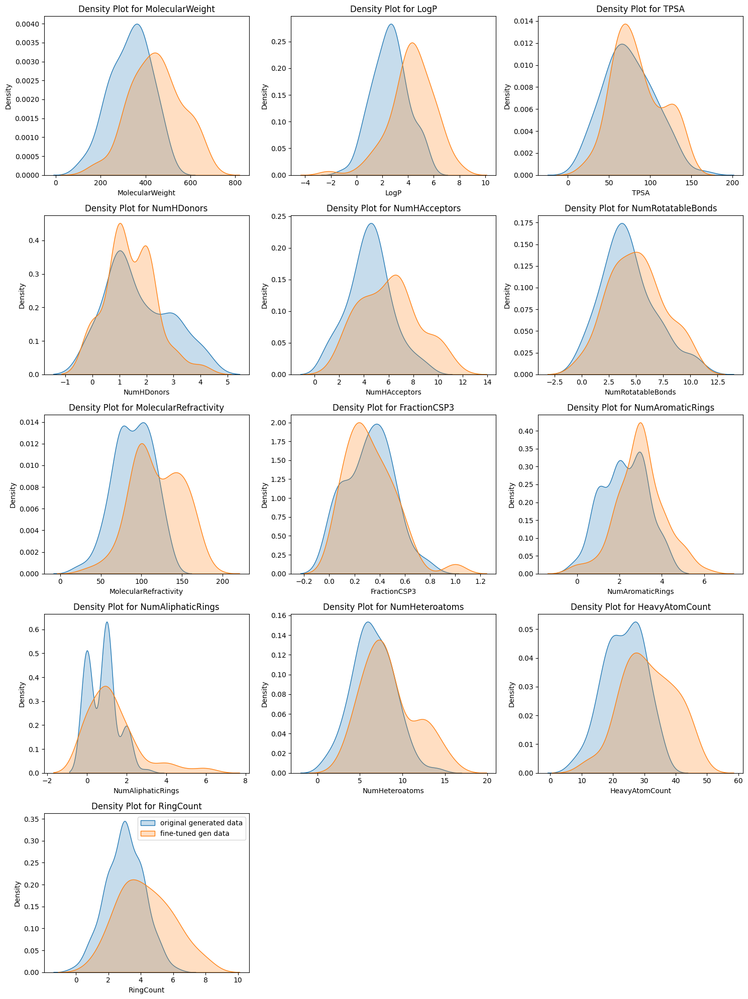

In [173]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(gen_data[column], fill=True, label='original generated data')
    sns.kdeplot(gen_data_fine_tuned[column], fill=True, label='fine-tuned gen data')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 229 variables whereas the saved optimizer has 181 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
  1%|          | 1/100 [00:16<27:21, 16.58s/it]

COc1ccc(cc1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3C(F)(F)Oc3c2)nc1-c1ccccc1


  2%|▏         | 2/100 [00:18<12:36,  7.72s/it]

Cc1cc(F)c2cc3OCCNc3ccc2c1


  3%|▎         | 3/100 [00:20<08:33,  5.29s/it]

COc1cccc(Nc2ncnc3onc(-c4ccc(F)cc4)c23)c1


  4%|▍         | 4/100 [00:25<08:18,  5.20s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCN(CCC2(CC2)C(F)(F)F)C1=O


  5%|▌         | 5/100 [00:30<08:08,  5.15s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCO2)n1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


  6%|▌         | 6/100 [00:34<07:24,  4.72s/it]

Cc1cccc(n1)-c1n-2c(C(Nc3ccccc-23)c2ccccc2)c2n(C)c(=O)n(C)c(=O)c12


  7%|▋         | 7/100 [00:38<06:56,  4.48s/it]

CCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


  8%|▊         | 8/100 [00:41<06:03,  3.96s/it]

COc1ccc(cc1OC)C(=O)NCCNc1nc2cc(C)cc(C)c2cc1C#N


  9%|▉         | 9/100 [00:43<05:19,  3.51s/it]

COc1ccc2c(nn(CC(F)(F)F)c(=O)c2c1)-c1ccccn1


 10%|█         | 10/100 [00:48<05:51,  3.90s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 11%|█         | 11/100 [00:53<06:17,  4.24s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCCC2)n1)N1CC[C@H](OCCC2CCC2)C1=O


 12%|█▏        | 12/100 [00:57<06:03,  4.13s/it]

CCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


 13%|█▎        | 13/100 [01:01<05:47,  3.99s/it]

CC(C)(CO)c1cc(NC(=O)c2ccc(OCCC3(CC3)c3ccc4OCOc4c3)c(F)c2)ccn1


 14%|█▍        | 14/100 [01:04<05:27,  3.81s/it]

COc1cccc(Cl)c1Nc1nc-2c(CCCCc3nc(NC(=O)C(C)(C)C)sc-23)s1


 15%|█▌        | 15/100 [01:09<05:54,  4.17s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 16%|█▌        | 16/100 [01:12<05:12,  3.72s/it]

COc1ccc(cc1)C(=O)NCCNc1nc2cc(C)cc(C)c2cc1C#N


 17%|█▋        | 17/100 [01:14<04:36,  3.33s/it]

CC(=O)Nc1ccc(N)cc1-c1nc2ccccc2n(C)c1=O


 18%|█▊        | 18/100 [01:18<04:34,  3.35s/it]

CC(C)(C)CCN1CCN(C1=O)c1ccc(cc1)S(=O)(=O)c1ccc2c(n1)NCCC2


 19%|█▉        | 19/100 [01:22<05:08,  3.80s/it]

Cc1n[nH]c2ccc(ccc12)N1C[C@H](C[C@@H](O)[C@@H](Nc2cccc(Cl)c2)C(F)(F)F)C[C@@H]1C


 20%|██        | 20/100 [01:26<04:58,  3.73s/it]

COc1ccc(Cl)cc1C1(CC1c1cccc(c1)C(O)=O)C(=O)NC1=SCCC(C)C1=O


 21%|██        | 21/100 [01:29<04:30,  3.42s/it]

COc1cccc(c1)C(=O)NCCNc1nc2cc(C)cc(C)c2cc1C#N


 22%|██▏       | 22/100 [01:32<04:30,  3.47s/it]

Cc1ccc(o1)C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


 23%|██▎       | 23/100 [01:35<04:09,  3.24s/it]

Cc1nc(NC(=O)c2cccnc2Cl)sc1-c1cc(Cl)c(O)cc1O


 24%|██▍       | 24/100 [01:40<04:42,  3.71s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 25%|██▌       | 25/100 [01:43<04:32,  3.63s/it]

COc1ccc(COC(=O)c2cc(Cl)c(N)c(NC(=O)C3CC3)c2)cc1-c1ccccc1


 26%|██▌       | 26/100 [01:46<04:08,  3.36s/it]

COc1ccc(cc1)C(=O)NCCNc1nc2cc(C)cc(C)c2cc1C#N


 27%|██▋       | 27/100 [01:50<04:09,  3.41s/it]

CCN(CC)c1nc(Nc2cccc(c2)C(O)=O)nc(OC(C(F)(F)F)C(F)(F)F)n1


 28%|██▊       | 28/100 [01:53<04:14,  3.54s/it]

CCN(CC)c1nc(Nc2cccc(c2)[N+]([O-])=O)nc(OC(C(F)(F)F)C(F)(F)F)n1


 29%|██▉       | 29/100 [01:56<03:49,  3.24s/it]

CC(C)c1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1N


 30%|███       | 30/100 [02:00<04:06,  3.52s/it]

COc1ccc(cc1)C(=O)N1CCN(c2nc(ccc2C(=O)NS2(=O)=O)-n2ccc(OCC3CC3)n2)CC1


 31%|███       | 31/100 [02:02<03:36,  3.14s/it]

Cc1nc(N2CCC3(CC2)OCCO3)n(Cc2cccs2)n1


 32%|███▏      | 32/100 [02:07<03:55,  3.47s/it]

Cn1c2c3[C@H](O[C@H](CO)Cn3c(-c3nc(CO)cs3)c2c(=O)n(C)c1=O)c1ccc(Cl)o1


 33%|███▎      | 33/100 [02:09<03:30,  3.15s/it]

Cc1cccc(Nc2ncnc3onc(-c4ccc(F)cc4)c23)c1


 34%|███▍      | 34/100 [02:14<03:59,  3.63s/it]

CC(C)(C)C(=O)Nc1ccc2CCc3c(nc2n1)-c1ccc(N1CCN(CC1)[C@@H](C(C)(C)C)C(C)C)C(C)Oc1


 35%|███▌      | 35/100 [02:19<04:27,  4.12s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCN(CCCC2(CC2)C(F)(F)F)C1=O


 36%|███▌      | 36/100 [02:24<04:43,  4.43s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCN(CCCC2(CC2)C(F)(F)F)C1=O


 37%|███▋      | 37/100 [02:28<04:26,  4.23s/it]

CCN(CC)c1nc(Nc2cccc(c2)[N+]([O-])=O)nc(OC(C(F)(F)F)C(F)(F)F)n1


 38%|███▊      | 38/100 [02:31<03:59,  3.86s/it]

COc1cccc(c1)C1C[C@H]1c1nc2ccccc2n(Cc2ccccc2)c1=O


 39%|███▉      | 39/100 [02:33<03:30,  3.45s/it]

Oc1nc2cccc(c2c(=O)o1)-c1ccc(cc1)C(F)(F)F


 40%|████      | 40/100 [02:37<03:27,  3.45s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C(C)(C)C)sc-23)s1


 41%|████      | 41/100 [02:41<03:27,  3.52s/it]

Clc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


 42%|████▏     | 42/100 [02:44<03:19,  3.44s/it]

OC(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccc(F)cc1


 43%|████▎     | 43/100 [02:46<02:59,  3.16s/it]

Cc1cc(C)c2cc(C#N)c(NCCNCCc3ccccn3)nc2c1


 44%|████▍     | 44/100 [02:50<03:12,  3.43s/it]

CCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cc(OCC)cc(OC(C)C)c2)cc1


 45%|████▌     | 45/100 [02:54<03:11,  3.48s/it]

Cn1c2c3C(Oc4ccccc4-n3c(-c3ccccc3)c2c(=O)n(C)c1=O)c1ccc(F)o1


 46%|████▌     | 46/100 [02:57<03:00,  3.34s/it]

CC(C)(C)CCC1CN(C(=O)c2[nH]c3c(Cl)cccc3c2=O)C1(C)C


 47%|████▋     | 47/100 [03:02<03:30,  3.97s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCC2)n1)N1CC[C@H](OCCC2(CC2)C(F)(F)F)C1=O


 48%|████▊     | 48/100 [03:07<03:31,  4.07s/it]

CCOC(=O)c1nc(C)c(cc1NC(=O)c1c[nH]c2ccccc2c1=O)N1CCN(CC(O)COc2ccccc2)CC1


 49%|████▉     | 49/100 [03:12<03:39,  4.31s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 50%|█████     | 50/100 [03:15<03:21,  4.03s/it]

O=c1cc(-c2ccsc2)nc2cccc(c12)N1CC(c2nnc(o2)-c2ccccc2)C1


 51%|█████     | 51/100 [03:18<03:04,  3.77s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCc3nc(NC(=O)C(C)C)sc-23)s1


 52%|█████▏    | 52/100 [03:21<02:50,  3.55s/it]

Cc1nc(N)nc(c1C[C@@H]1CN(C(=O)c2cccnc2)C(F)(F)F)c1


 53%|█████▎    | 53/100 [03:24<02:40,  3.42s/it]

CCCn1c(=O)c2c(nc3[nH]c(C)nc31)-c1cc(Cl)ccc1C(F)(F)F


 54%|█████▍    | 54/100 [03:29<02:51,  3.74s/it]

CC(C)(C)c1cc(NC(=O)C2(CC2)c2cn(nn2)-c2ccc3c(N)nc(N)nc3c2)cc(OCC(F)(F)F)n1


 55%|█████▌    | 55/100 [03:34<03:09,  4.21s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCN(CCCC2(CC2)C(F)(F)F)C1=O


 56%|█████▌    | 56/100 [03:39<03:17,  4.50s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(NCCC2)nc1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 57%|█████▋    | 57/100 [03:42<02:50,  3.96s/it]

OC(=O)c1ccc(nc1)-c1nc2ccccc2n(Cc2ccccc2)c1=O


 58%|█████▊    | 58/100 [03:45<02:32,  3.63s/it]

CCN(CC)c1nc(Nc2ccc(F)cc2)nc(OCC(F)(F)C(F)F)n1


 59%|█████▉    | 59/100 [03:50<02:47,  4.07s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 60%|██████    | 60/100 [03:52<02:21,  3.53s/it]

Cc1cccc(NC(=O)c2c[nH]c3ccccc3c2=O)c1N


 61%|██████    | 61/100 [03:56<02:22,  3.64s/it]

CN(C)c1ccc(cc1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccccc1


 62%|██████▏   | 62/100 [03:59<02:07,  3.35s/it]

CN(CCCl)C(=O)c1ccc(cc1)-c1ccc(cc1)C(F)(F)F


 63%|██████▎   | 63/100 [04:01<01:52,  3.04s/it]

CN(C(=O)Cn1nnc(-c2cccs2)n1)c1ccc(F)cc1


 64%|██████▍   | 64/100 [04:05<01:58,  3.30s/it]

COc1ccc(Cl)cc1C1(CC1c1ccc2OCOc1c2c1n(C)c(=O)n(C)c(=O)n1)C(=O)NCC


 65%|██████▌   | 65/100 [04:09<01:58,  3.39s/it]

Cn1c2c3C(Nc4ccccc4-n3c(-c3ccccc3)c2c(=O)n(C#N)c1=O)c1nccs1


 66%|██████▌   | 66/100 [04:12<01:55,  3.39s/it]

CC(C)(C)c1cc(NC(=O)C2(CC2)c2ccc3OCOc3c2)cc(-c2ccccc2)n1


 67%|██████▋   | 67/100 [04:18<02:14,  4.09s/it]

COc1ccc(cc1CO[C@@H]1[C@@H](N([C@@H]([C@H]1C(C)(C)C)C(O)=O)C(=O)[C@@H]1CCCCO1)c1ccccc1)C(F)(F)F


 68%|██████▊   | 68/100 [04:22<02:10,  4.08s/it]

COc1ccc(cc1Nc1nc-2c(CCCc3nc(NC(=O)C(C)(C)C)sc-23)s1)[N+]([O-])=O


 69%|██████▉   | 69/100 [04:26<02:05,  4.06s/it]

CCc1cccc(c1)-c1n-2c(CC(Nc3ccccc-23)c2ccsc2)c2n(C)c(=O)n(C)c(=O)c12


 70%|███████   | 70/100 [04:28<01:48,  3.61s/it]

COc1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)c(OC)c1


 71%|███████   | 71/100 [04:32<01:47,  3.69s/it]

COc1ccc(cc1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccc(F)cc1


 72%|███████▏  | 72/100 [04:36<01:45,  3.76s/it]

CCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


 73%|███████▎  | 73/100 [04:39<01:33,  3.45s/it]

COc1ccc(cc1)C(=O)NC1CCN(CC1)CCc1nc2ccccc2n1C


 74%|███████▍  | 74/100 [04:43<01:34,  3.65s/it]

CC(C)(C)CCCC[C@H]1C[C@H](CN([C@H](C1)O1)c1ccccc1)S(=O)(=O)c1ccccc1


 75%|███████▌  | 75/100 [04:46<01:25,  3.43s/it]

COc1ccc(Cl)cc1Nc1nc(cs1)-c1sc(NC(=O)C(C)(C)C)nc1C


 76%|███████▌  | 76/100 [04:49<01:19,  3.33s/it]

COc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1cc([nH]n1)C(F)(F)F


 77%|███████▋  | 77/100 [04:54<01:26,  3.77s/it]

Cc1cccc(c1)-c1n-2c(C(Nc3ccccc-23)c2cccc(c2)[N+]([O-])=O)c2n(C)c(=O)n(C)c(=O)c12


 78%|███████▊  | 78/100 [04:57<01:20,  3.67s/it]

COc1ccc(Cl)cc1Cn1nc(cc1-c1sc(NC(=O)C(C)(C)C)nc1C)C(=O)NC


 79%|███████▉  | 79/100 [05:02<01:23,  3.99s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 80%|████████  | 80/100 [05:06<01:23,  4.16s/it]

CN(CCOc1cn(nn1)-c1ccc2c(c1)N1CC(CC1(C)C)OC(=O)c1ccccc1c1)C(=O)COc1cccc(Cl)c1


 81%|████████  | 81/100 [05:10<01:16,  4.01s/it]

Cc1cccc(c1)C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


 82%|████████▏ | 82/100 [05:15<01:16,  4.23s/it]

Cc1cccc(c1)-c1n-2c(C(Nc3ccccc-23)c2cccc(c2)[N+]([O-])=O)c2n(C)c(=O)n(C)c(=O)c12


 83%|████████▎ | 83/100 [05:20<01:16,  4.51s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 84%|████████▍ | 84/100 [05:23<01:07,  4.19s/it]

CC(C)CCOc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1cc([nH]n1)C(F)(F)F


 85%|████████▌ | 85/100 [05:27<01:01,  4.08s/it]

CCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


 86%|████████▌ | 86/100 [05:32<01:00,  4.35s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 87%|████████▋ | 87/100 [05:36<00:54,  4.21s/it]

CCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


 88%|████████▊ | 88/100 [05:41<00:52,  4.35s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)c1ccn(CCO2)n1)N1CC[C@H](OCCC2(CC2)C(F)(F)F)C1=O


 89%|████████▉ | 89/100 [05:46<00:49,  4.47s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCO2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 90%|█████████ | 90/100 [05:50<00:45,  4.56s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCCC2)nc1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 91%|█████████ | 91/100 [05:53<00:37,  4.12s/it]

COc1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1-c1ccc(Cl)cc1


 92%|█████████▏| 92/100 [05:56<00:29,  3.66s/it]

C[C@H](CO)Nc1nc(nc2nc(NCCCCO)sc12)-c1ccccn1


 93%|█████████▎| 93/100 [05:59<00:24,  3.52s/it]

Cn1c2c3C(NCCn3c(-c3ccccc3)nc2c(=O)n(C)c1=O)c1ccc(Cl)o1


 94%|█████████▍| 94/100 [06:02<00:19,  3.29s/it]

Cc1nc(NC(=O)c2cccs2)sc1-c1csc(Nc2ccc(Cl)cc2)n1


 95%|█████████▌| 95/100 [06:12<00:26,  5.26s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCCC2)nc1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 96%|█████████▌| 96/100 [06:18<00:22,  5.56s/it]

CC1(C)CCC2CN(c3nc(ccc3C(=O)NS(=O)(=O)c3ccccc3)-n3ccc(OCCC(C)(C)C(F)(F)F)n3)C(=O)N(C)c12


 97%|█████████▋| 97/100 [06:22<00:15,  5.12s/it]

COC(=O)c1ccc(\C=C2/SC(=S)N(C2=O)c2cccc(c2)C(F)(F)F)cc1


 98%|█████████▊| 98/100 [06:26<00:09,  4.66s/it]

COc1ccc(cc1)C1(CC1)C(=O)NCc1ccc2n(C)c(=O)n(C)cc2c1


 99%|█████████▉| 99/100 [06:29<00:04,  4.24s/it]

CCN(CC)c1nc(Nc2ccc(F)cc2)nc(OCC(F)(F)C(F)F)n1


100%|██████████| 100/100 [06:31<00:00,  3.91s/it]

Nc1c2cnn1CCCCCCCCc1ccccc1

Percent valid: 87.000%
Percent unique: 55.172%
['CC(C)CCOc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1cc([nH]n1)C(F)(F)F', 'CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1', 'CC(C)(C)c1cc(NC(=O)C2(CC2)c2cn(nn2)-c2ccc3c(N)nc(N)nc3c2)cc(OCC(F)(F)F)n1', 'Clc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1', 'COc1ccc(Cl)cc1Cn1nc(cc1-c1sc(NC(=O)C(C)(C)C)nc1C)C(=O)NC', 'CC(C)c1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1N', 'CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCO2)n1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1', 'CC(=O)Nc1ccc(N)cc1-c1nc2ccccc2n(C)c1=O', 'COc1ccc(cc1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccc(F)cc1', 'COc1ccc(cc1)C(=O)NC1CCN(CC1)CCc1nc2ccccc2n1C', 'COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C(C)(C)C)sc-23)s1', 'Cc1cccc(c1)C1Nc2ccccc2-n2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1', 'CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1', 'CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)c1ccn(CCO2)n1)N1CC[C@H](OCCC2(CC2)C(F)(F)F)C1

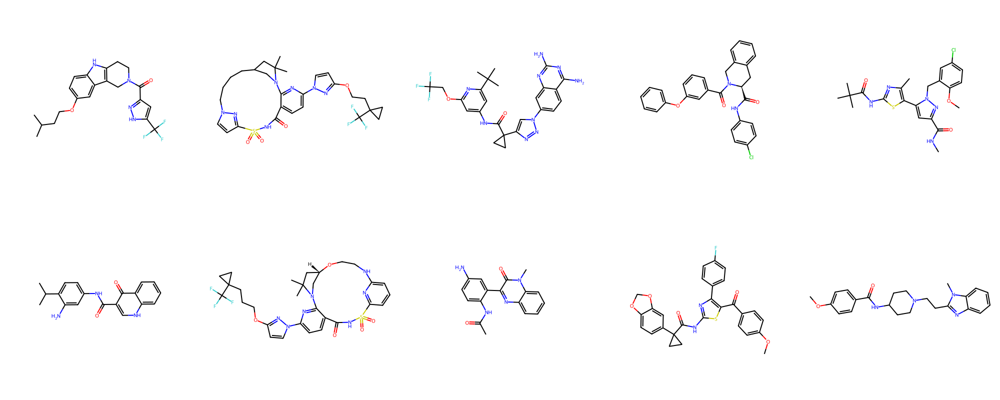

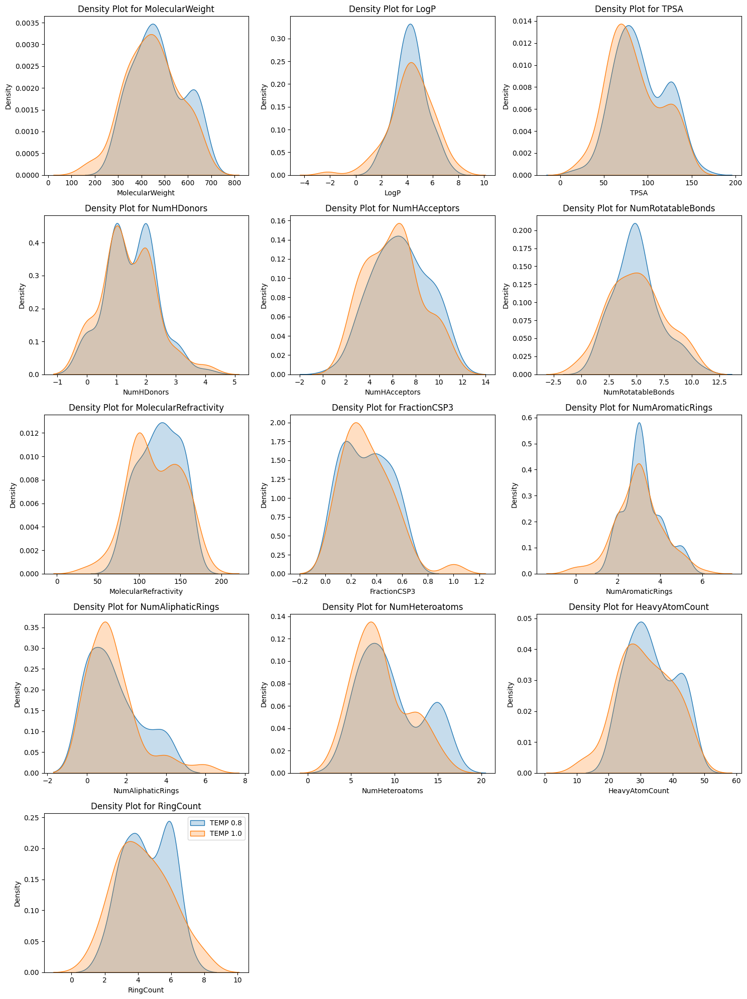

In [203]:
# Temperature Studies Fine-Tuned Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_fine_tuned_F18.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=0.8)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, fine_tuning_smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 0.8')
    sns.kdeplot(gen_data_fine_tuned[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 229 variables whereas the saved optimizer has 181 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
  1%|          | 1/100 [00:16<27:56, 16.94s/it]

CC(C)n1c(NC(=O)c2cc(cc2F)n(CC2CC2)c2ncc(nc22)C2CC2)nc1=O


  2%|▏         | 2/100 [00:20<14:39,  8.98s/it]

Cn1c2c(CCCN3CCCCC3)cccc2c2cc(-c3ccc(F)cc3)cc(=O)c12


  3%|▎         | 3/100 [00:25<11:43,  7.26s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccn(CCO2)n1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


  4%|▍         | 4/100 [00:29<09:38,  6.02s/it]

CS(=O)(=O)c1ccc(cc1)-c1nc2c(C(Nc3ccccc-23)c(C#N)c1O)C(F)(F)F


  5%|▌         | 5/100 [00:32<07:40,  4.85s/it]

COc1cccc(Nc2ncnc3snn(-c4ccc(Cl)cc4)c23)c1


  6%|▌         | 6/100 [00:34<06:18,  4.02s/it]

Cc1ccc(o1)C1NCc2c1sc(nn2)-c1ccccc1Cl


  7%|▋         | 7/100 [00:39<06:24,  4.13s/it]

CCCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1


  8%|▊         | 8/100 [00:43<06:12,  4.04s/it]

CSc1cccc(Nc2nc(cs2)-c2ccc(cc2)S(=O)(=O)NC(=O)c2ccccn2)c1


  9%|▉         | 9/100 [00:46<05:48,  3.82s/it]

CC(C)c1cccc(COC[C@H](O)CNC(c2ccno2)c2cccc(F)c2)c1


 10%|█         | 10/100 [00:52<06:49,  4.55s/it]

COc1ncc(cc1CO[C@@H]1[C@@H](N([C@@H]([C@H]1C(C)(C)C)C(O)=O)C(=O)[C@@H]1CCCCO1)c1ccccc1C)C1(CO1


 11%|█         | 11/100 [00:56<06:19,  4.27s/it]

CC(C)(C)c1cc(c(NC(=O)c2c[nH]c3ccccc3c2=O)cc1O)C(C)(C)C


 12%|█▏        | 12/100 [01:00<06:12,  4.23s/it]

COc1ccc(Cl)cc1Nc1nc(cs1)-c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1C


 13%|█▎        | 13/100 [01:05<06:28,  4.47s/it]

COc1ccc(C)cc1C1(CC1c1cccc(-n1cccc1)c1ccccc1)C(=O)NS(=O)(=O)c1cccc2nc(C)ccc12


 14%|█▍        | 14/100 [01:09<06:20,  4.43s/it]

CC(C)(C)c1cc(c(NC(=O)C2(CC2)c2cN(C)C(=O)c3ccccn3)c(F)c1)C(F)(F)F


 15%|█▌        | 15/100 [01:12<05:45,  4.07s/it]

CCOC(=O)c1cc(-c2csc(n2)C(=O)NCCF)c2cccc(OC)c12


 16%|█▌        | 16/100 [01:15<05:12,  3.72s/it]

CCCN(CC)c1nc(C(=O)NCC)c(nc1C(F)(F)F)-c1ccco1


 17%|█▋        | 17/100 [01:19<04:55,  3.57s/it]

COC(=O)CCn1c(nc2ccc3n(c2=O)CCNC3=O)S(=O)(=O)c1=O


 18%|█▊        | 18/100 [01:22<04:39,  3.41s/it]

NC(=O)c1cc2cc[nH]c2cc1NC(=O)c1ccc(cc1)C(F)(F)F


 19%|█▉        | 19/100 [01:24<04:07,  3.06s/it]

O=C(Nc1ccccc1)c1c[nH]c2ccccc2c1=O


 20%|██        | 20/100 [01:28<04:35,  3.45s/it]

CCc1nc(NC(=O)Cn2c(-c3ccc(F)cc3)cc3ccc(OCC(C)C#N)cc32)sc1-c1ccsc1


 21%|██        | 21/100 [01:34<05:33,  4.22s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CC[C@H](OCCC2C3(CC3)C222CC2)C1=O


 22%|██▏       | 22/100 [01:38<05:10,  3.98s/it]

COc1ccc(Cl)c(Nc2nc(cs2)-c2sc(NC(=O)C(C)(C)C)nc2C)c1


 23%|██▎       | 23/100 [01:41<04:50,  3.77s/it]

CCCn1c(\C=C\C(=O)NC2COc3OC(C)(C)C2)n(C)c(=O)c1=O


 24%|██▍       | 24/100 [01:44<04:30,  3.57s/it]

Cc1ccc(o1)[C@H]1N=C(c2cccnc2)c2ccccc2-n2cccc21


 25%|██▌       | 25/100 [01:49<04:54,  3.93s/it]

CC(C)(CO)c1cc2cc(NC(=O)C3(CC3)c3ccc4OC(F)(F)Oc4c3)c(F)cc2n1C[C@@H](O)CO


 26%|██▌       | 26/100 [01:52<04:26,  3.60s/it]

Fc1ccc(nn2CCN(Cc3c[nH]c4ccccc34)C(O)=O)cc1


 27%|██▋       | 27/100 [01:56<04:39,  3.83s/it]

CN(C(=O)Cn1c(-c2ccc(Cl)o2)c2ccc(OCC3CC3)cc2c1=O)c1ccc2nc(C)oc2c1


 28%|██▊       | 28/100 [01:59<04:11,  3.50s/it]

Oc1ccc2nc(N3CCN(CC3)Cc3cc(O)ccc3O)ccc2c1


 29%|██▉       | 29/100 [02:02<04:03,  3.43s/it]

Cc1nc(NC(C)(C)C)sc1C(=O)NC1CCN(CC1)C(=O)Cc1ccccc1


 30%|███       | 30/100 [02:07<04:39,  3.99s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 31%|███       | 31/100 [02:13<05:09,  4.48s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 32%|███▏      | 32/100 [02:19<05:28,  4.82s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCCCC2)nc1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 33%|███▎      | 33/100 [02:22<04:57,  4.44s/it]

Cc1cccc(F)c1Nc1nc-2c(CCCc3nc(NC(=O)C(C)(C)C)sc-23)s1


 34%|███▍      | 34/100 [02:27<04:56,  4.49s/it]

Cc1cccc(c1)-c1n-2c(c(C(N)=O)c(C(N)=O)n(C)c2=O)c2n(C)c(=O)n(C)c(=O)c12


 35%|███▌      | 35/100 [02:30<04:32,  4.20s/it]

OC(=O)c1ccc(\C=C2/SC(=S)N(C2=O)c2cccc(c2)C(F)(F)F)cc1


 36%|███▌      | 36/100 [02:33<03:59,  3.74s/it]

COCCN1CCN(CC(O)c2[nH]c3cc(C)ccc3c2=O)CC1


 37%|███▋      | 37/100 [02:38<04:27,  4.24s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 38%|███▊      | 38/100 [02:42<04:10,  4.04s/it]

Cc1ccc2c(nn1)-c1sc(NC(=O)C3(CC3)C(F)(F)F)nc1C)C(C)(C)C


 39%|███▉      | 39/100 [02:47<04:32,  4.47s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCC2(CC2)C(F)(F)F)n1


 40%|████      | 40/100 [02:50<03:47,  3.79s/it]

CCN(CC)C(=O)c1cc(nnc1C)-c1ccccc1


 41%|████      | 41/100 [02:53<03:29,  3.56s/it]

COc1ccc(cc1)C(=O)NCCNc1nc2cc(C)cc(C)c2cc1C#N


 42%|████▏     | 42/100 [02:58<04:01,  4.17s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCCC2)nc1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1


 43%|████▎     | 43/100 [03:02<03:50,  4.04s/it]

COc1ccc(S(=O)(=O)N(Cc2ccccc2)[C@H](CC(O)C(=O)O)C(=O)NO)cc1


 44%|████▍     | 44/100 [03:07<04:05,  4.38s/it]

CN(CCOc1ccn(n1)-c1ccc2c(n1)N1C[C@@H](CC1(C)C)CCNc1cccc(n1)S(=O)(=O)NC2=O)C(C)C


 45%|████▌     | 45/100 [03:13<04:17,  4.69s/it]

CN(C)CCC(c1cnn(c1)-c1ccc2c(n1)N1C[C@H](CC1(C)C)CCCNc1cccc(n1)S(=O)(=O)NC2=O)C1CCCCCC1


 46%|████▌     | 46/100 [03:15<03:30,  3.89s/it]

C[C@@H]1CCCCC1c1cc(no1)-c1ccccc1


 47%|████▋     | 47/100 [03:20<03:46,  4.27s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 48%|████▊     | 48/100 [03:24<03:44,  4.31s/it]

CCCOCCn1c(=O)c(NCCN2CCN(Cc3nc4c(F)c(F)ccc4[nH]3)CC2)nc2ccc(N(C)C)cc12


 49%|████▉     | 49/100 [03:27<03:21,  3.95s/it]

CCc1nc(NC(=O)C(C)(C)C)sc1-c1cc(nn1CC(C)(C)C)C(C)C


 50%|█████     | 50/100 [03:31<03:13,  3.87s/it]

CN(Cc1c(\C=C\c2ccccc2)c(=O)c1nc2ccccc2[nH]1)C(=O)N1CCCCC1


 51%|█████     | 51/100 [03:36<03:32,  4.34s/it]

Cn1c2c3[C@@H](O[C@@H](CO)Cn3c(-c3nc(C#N)cs3)c2c(=O)n(C)c1=O)c1ncc(s1)[C@H](C)C(F)(F)F


 52%|█████▏    | 52/100 [03:39<03:10,  3.98s/it]

Cc1ccc2n(Cc3cccc4[nH]ncc34)c3c(cccc3-2)C(=O)N(C)C


 53%|█████▎    | 53/100 [03:42<02:47,  3.57s/it]

Cc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1ccc(Br)o1


 54%|█████▍    | 54/100 [03:45<02:41,  3.52s/it]

OC(=O)c1ccc(\C=C2/SC(=S)N(C2=O)c2cccc(c2)C(F)(F)F)cs1


 55%|█████▌    | 55/100 [03:50<02:57,  3.93s/it]

CN(C(=O)Cn1nc(-c2cccc(Cl)c2)c2ccc(OC3CC4(CC3)COC(=O)N4)cc2c1=O)c1ccc2OCOc2c1


 56%|█████▌    | 56/100 [03:53<02:38,  3.60s/it]

Cc1nc(C(=O)NCC(C)(O)C(F)(F)F)c(N)cc1C(F)(F)F


 57%|█████▋    | 57/100 [03:58<02:52,  4.01s/it]

COc1cc(Cl)c(cc1nn(Cc1ccccc1)c(=O)c1cc(C#N)c(nc1)C#N)n1ccc(OCCC2(CC2)C(F)(F)F)n1


 58%|█████▊    | 58/100 [04:00<02:25,  3.46s/it]

CCc1ccc(o1)S(=O)(=O)N1CCC(C)(C)C1


 59%|█████▉    | 59/100 [04:04<02:23,  3.49s/it]

CCOC(=O)c1cc2cc(C)c(NC(=O)c3nnc(-c4ccc(OC)cc4)o3)cc2o1


 60%|██████    | 60/100 [04:07<02:18,  3.46s/it]

Cc1ccc(o1)C1NCCn2c1c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


 61%|██████    | 61/100 [04:09<01:55,  2.96s/it]

O=C(NCc1cccs1)c1cnn2ccccc2c1


 62%|██████▏   | 62/100 [04:13<01:58,  3.11s/it]

[O-]S(=O)(=O)c1ccc(cc1)-c1nc2cc(F)c(F)cc2n(C2CCCC2)c1=O


 63%|██████▎   | 63/100 [04:16<01:54,  3.10s/it]

Nc1c(nc2sc(NC(=O)C(=O)c3ccc(O)cc3)nc12)-c1ccccc1


 64%|██████▍   | 64/100 [04:21<02:17,  3.82s/it]

Cn1c2c3C(Oc4ccc(cc4-n3c(-c3ccccc3)c2c(=O)n(C)c1=O)-c1cccc([N+]([O-])c1)[O-]([O-])=O)c1


 65%|██████▌   | 65/100 [04:25<02:11,  3.75s/it]

C[C@](O)(CN1CCN(CCNCc2ccc3c(n2)NC[C@H](C)C3)C1=O)C(F)(F)F


 66%|██████▌   | 66/100 [04:28<02:02,  3.61s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C4CC4)sc-23)s1


 67%|██████▋   | 67/100 [04:31<01:55,  3.51s/it]

COc1ccc(Cl)cc1Nc1nc-2c-3c(CCCc4nc(ccc-45)sc-23)s1


 68%|██████▊   | 68/100 [04:34<01:48,  3.38s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCc3nc(NC(C)=O)sc-23)s1


 69%|██████▉   | 69/100 [04:38<01:51,  3.61s/it]

COc1ccc(Cl)cc1Nc1nc(cs1)-c1sc(NC(=O)c2csc(NC(=O)C(C)(C)C)n2)nc1C


 70%|███████   | 70/100 [04:42<01:46,  3.55s/it]

CCOC(=O)c1ccc(cc1)C(=O)N1CCN(CC1)c1nc2cc(Br)ccc2cc1C#N


 71%|███████   | 71/100 [04:45<01:41,  3.52s/it]

OC(=O)c1ccc(\C=C2/SC(=S)N(C2=O)c2ccc(cc2)C(F)(F)F)cc1


 72%|███████▏  | 72/100 [04:50<01:45,  3.77s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=N)(=O)c1cccc(NCCC2)n1)N1CCC(C)CC1=O


 73%|███████▎  | 73/100 [04:54<01:43,  3.84s/it]

CCN(Cc1cnn(c1)-c1ccccc1)c1nc(-c2ccc2oc3ccccc3c2c1=O)[C@H](O)CO


 74%|███████▍  | 74/100 [04:57<01:38,  3.78s/it]

Cn1c(-c2ccccc2)c(c2nc(N)nc(OCc3cccc(F)c3)c21)-c1cccc(Cl)c1


 75%|███████▌  | 75/100 [05:01<01:34,  3.76s/it]

Cc1nc(N)sc1CNC(=O)Cn1c(C)c(C)c(n1)N1CCC(Oc2ccc(Cl)cc2)C1=O


 76%|███████▌  | 76/100 [05:05<01:32,  3.86s/it]

Nc1ncnn2CCCC(O)CN(Cc3ccc4ccccc4c3)c(C#N)c(-c3cnc(nc3)C(F)(F)F)c12


 77%|███████▋  | 77/100 [05:11<01:40,  4.38s/it]

CC(C)C1CCN(C1)c1nc(Cl)c(cc1C(=O)NS(=O)(=O)c1ccc(cn1)C(F)(F)F)-n1ccc(OCC(C2C3CC3)C22CC2)n1


 78%|███████▊  | 78/100 [05:16<01:45,  4.78s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CCN(CCCCC23CC4CC(C(C3)C2)C2)C1=O


 79%|███████▉  | 79/100 [05:18<01:18,  3.72s/it]

CC(C)(C)c1cccc(N)c1


 80%|████████  | 80/100 [05:21<01:12,  3.60s/it]

OC(=O)c1ccc(\C=C2/SC(=S)N(C2=O)c2cccc(c2)C(F)(F)F)cc1


 81%|████████  | 81/100 [05:26<01:15,  3.96s/it]

CCC[C@H](NC(=O)[C@@H]1N=C(c2cccc(c2)OC)c2cccc(c2)CN1C[C@@H]1COc2cccc(OC)c2)C1


 82%|████████▏ | 82/100 [05:30<01:10,  3.92s/it]

O=C(Nc1nc(c(s1)C(=O)c1cccnc1)-c1ccccc1)C1(CC1)c1ccc2OCOc2c1


 83%|████████▎ | 83/100 [05:33<01:01,  3.63s/it]

CCN(CC)C(=O)c1cnc(NC(=O)C2(CC2)c2ccc3OCOc3c2)s1


 84%|████████▍ | 84/100 [05:37<01:00,  3.76s/it]

NC(=O)c1cc(sc1NC(=O)c1c[nH]c2c(F)cccc2c1=O)S(=O)(=O)N1CCC(F)(F)C1


 85%|████████▌ | 85/100 [05:40<00:53,  3.57s/it]

Brc1ccc(\C=C2/SC(=S)N(C2=O)c2cccc(c2)C(F)(F)F)cc1


 86%|████████▌ | 86/100 [05:45<00:57,  4.12s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCO2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 87%|████████▋ | 87/100 [05:48<00:50,  3.88s/it]

OCCN(CCO)Cc1cc2ncnc(n1)S(=O)(=O)c1ccc(OCCC2)c2ccccc12


 88%|████████▊ | 88/100 [05:52<00:44,  3.68s/it]

Oc1ccc(\C=C2/SC(=S)N(C2=O)c2cccc(c2)C(F)(F)F)c(O)c1


 89%|████████▉ | 89/100 [05:55<00:39,  3.61s/it]

Cc1csc(n1)-c1nc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccco1


 90%|█████████ | 90/100 [06:00<00:40,  4.09s/it]

CC1(C)CC[C@H]2CCCNc3cccc(n3)S(=O)(=O)NC(=O)c3ccc(nc3N12)-n1ccc(OCCC(C2CC2)C2CC2)n1


 91%|█████████ | 91/100 [06:04<00:36,  4.05s/it]

CC1(C)C[C@](C)(N2CCN(CCc3nc(oc4ccccc34)-c3ccccc3)C2=O)C(O)=CC1O


 92%|█████████▏| 92/100 [06:07<00:28,  3.51s/it]

Cc1nc2scNc-2c(CNc3ccccc3F)n2c(=O)c1C


 93%|█████████▎| 93/100 [06:10<00:25,  3.60s/it]

COc1cccc(c1)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccccc1


 94%|█████████▍| 94/100 [06:15<00:23,  3.85s/it]

C[C@@H]1C[C@H](C)N(Cc2nc(-c3ccncc3)c(c2C#N)-c2cc(nn2C)C(F)F)C(F)(F)F1


 95%|█████████▌| 95/100 [06:19<00:19,  3.94s/it]

NC(=O)c1nn(CC(=O)N2CCC3(CC2)OCc2cc3ccccc3c2)c(=O)c2c(nc12)-c1ccccc1


 96%|█████████▌| 96/100 [06:22<00:14,  3.66s/it]

CCc1cc(no1)-c1ccccc1OCc1ccc(Br)cc1OCc1cccc(OC)c1


 97%|█████████▋| 97/100 [06:26<00:11,  3.73s/it]

Cc1nc(NC(=O)C(C)(C)c2ccc3c(n2)N(Cc2ccccc2)CC3)sc1-c1cccc(F)c1


 98%|█████████▊| 98/100 [06:27<00:06,  3.03s/it]

Clc1ccnc(Nc2ccccc2)c1


 99%|█████████▉| 99/100 [06:32<00:03,  3.45s/it]

Cc1ccc2n1CCC(C)n1c(=O)n(CC(=O)NC2C3CC4CC(C3)CC2)c(=O)c1ccc(OCCC2CCCC2)n1


100%|██████████| 100/100 [06:36<00:00,  3.97s/it]

C[C@]1(O)[C@H](O)[C@@H](O)[C@H](c2nc(C(=O)NCc3cccc(Cl)c3)c(O)c(=O)n2C)N1

Percent valid: 68.000%
Percent unique: 72.059%
['CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCCC2)nc1)-n1ccc(OCCCC2(CC2)C(F)(F)F)n1', 'C[C@]1(O)[C@H](O)[C@@H](O)[C@H](c2nc(C(=O)NCc3cccc(Cl)c3)c(O)c(=O)n2C)N1', 'CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCC2(CC2)C(F)(F)F)n1', 'Cc1nc(N)sc1CNC(=O)Cn1c(C)c(C)c(n1)N1CCC(Oc2ccc(Cl)cc2)C1=O', 'CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1', 'CCc1nc(NC(=O)Cn2c(-c3ccc(F)cc3)cc3ccc(OCC(C)C#N)cc32)sc1-c1ccsc1', 'Cn1c(-c2ccccc2)c(c2nc(N)nc(OCc3cccc(F)c3)c21)-c1cccc(Cl)c1', 'COc1ccc(S(=O)(=O)N(Cc2ccccc2)[C@H](CC(O)C(=O)O)C(=O)NO)cc1', 'Oc1ccc2nc(N3CCN(CC3)Cc3cc(O)ccc3O)ccc2c1', 'CCc1ccc(o1)S(=O)(=O)N1CCC(C)(C)C1', 'CCCCCCc1ccc(NC(=O)[C@@H]2Cc3ccccc3CN2C(=O)c2cccc(Oc3ccccc3)c2)cc1', 'Cc1cccc(F)c1Nc1nc-2c(CCCc3nc(NC(=O)C(C)(C)C)sc-23)s1', 'CCN(CC)C(=O)c1cnc(NC(=O)C2(CC2)c2ccc3OCOc3c2)s1', 'CCCN(CC)c1nc(C(=O)NCC)c(nc

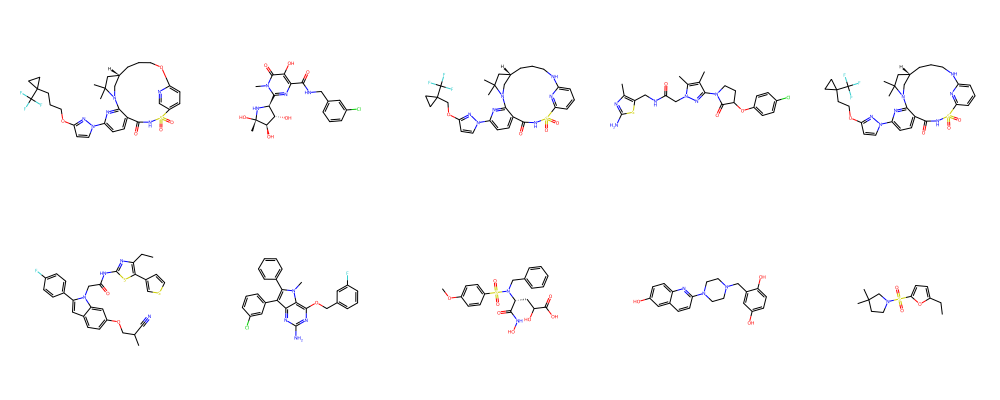

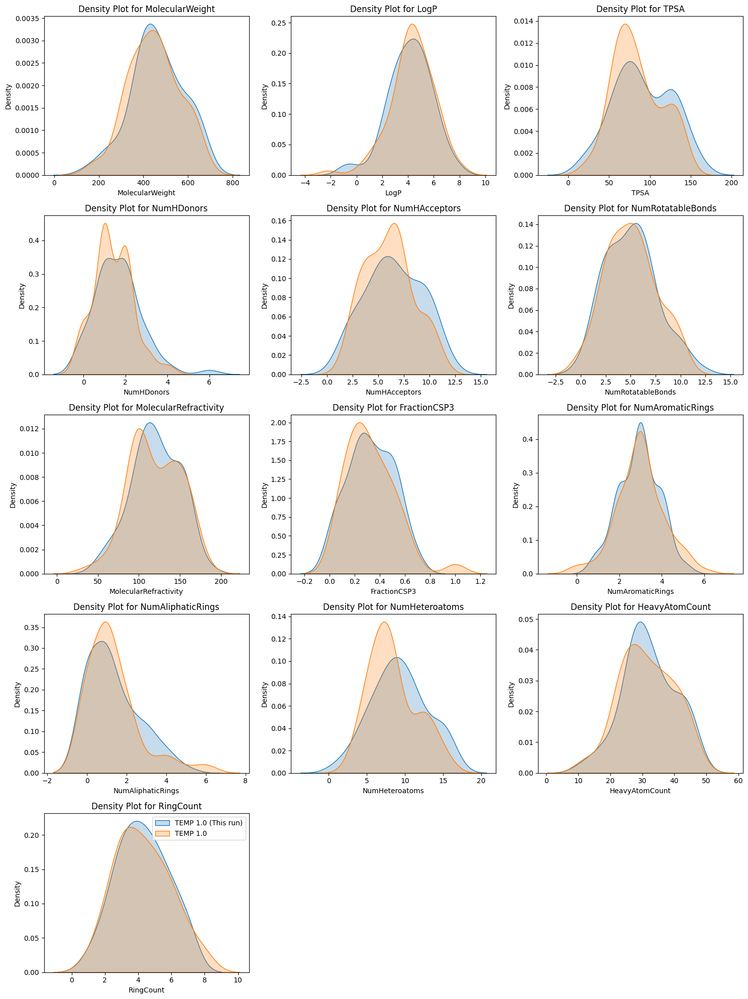

In [204]:
# Temperature Studies Fine-Tuned Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_fine_tuned_F18.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=1.0)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, fine_tuning_smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 1.0 (This run)')
    sns.kdeplot(gen_data_fine_tuned[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 229 variables whereas the saved optimizer has 181 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
  1%|          | 1/100 [00:15<26:23, 16.00s/it]

CCCCCc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1cc([nH]n1)C(F)(F)F


  2%|▏         | 2/100 [00:18<13:20,  8.17s/it]

CC1Cn2c3c(nn(Cc3cc1cccc1-c1ccccc1)-2)N(C)C1=O


  3%|▎         | 3/100 [00:22<10:13,  6.33s/it]

CC1CNCc2cc(CCN3CCN(c4cccc5OC[C@@H](NC(=O)[C@H](C)C(C)(C)C)C34)ccn2)C1


  4%|▍         | 4/100 [00:25<07:41,  4.80s/it]

CCOC(=O)Cc1nc(C)c(s1)c1ccc(S(N)(=O)=O)cc1


  5%|▌         | 5/100 [00:29<07:11,  4.54s/it]

Nc1ncnc2nc(Cc3ccc(cc3)-c3ccccc3)c(C#N)c(-c3ccc4c(c3)OC(F)(F)O4)c12


  6%|▌         | 6/100 [00:33<07:07,  4.55s/it]

CN(CC=C)[C@@H]1[C@@H](N([C@H]([C@@H](O)C(C)C)C(O)=O)C([O-])=[NH]1)c1ccccc1N


  7%|▋         | 7/100 [00:37<06:28,  4.18s/it]

Cc1ccsc1CN[C@H]1C[C@H](O)c2c(ccc(O)c21)-c1ccc2nc(C)oc2c1


  8%|▊         | 8/100 [00:39<05:39,  3.69s/it]

Clc1ccc(NC(=O)c2cnc(nc2)-c2ccc3ccccc3c2)cn1


  9%|▉         | 9/100 [00:45<06:38,  4.38s/it]

CCOc1ccc(cc1CN[C@H]1[C@@H]([C@H](N([C@@H]1c1ccccc1)C(=O)C1CCCCC1)C(O)=O)C(C)(C)C)C(C)(C)[C@@H]1


 10%|█         | 10/100 [00:48<05:59,  3.99s/it]

Cn1c2c3Ncccc3nc(C(F)(F)F)n3c(=O)c(-c4ccccc4F)sc1c23


 11%|█         | 11/100 [00:52<05:49,  3.92s/it]

CC(C)[C@@H](NC(=O)[C@H](Cc1ccccc1)NC(=O)C1CCCCC1)c1ccc2OCOc2c1


 12%|█▏        | 12/100 [00:55<05:16,  3.59s/it]

Oc1nc2ccc(cc2n2c(-c3ccccc3)cnn12)[N+](=O)[O-]


 13%|█▎        | 13/100 [00:59<05:16,  3.63s/it]

C[n+]1ccc(Cl)cc1C1/C(=C\c2cn(nc3-c3ccccc3F)c2)C(=O)N1CCCCO1


 14%|█▍        | 14/100 [01:02<05:01,  3.51s/it]

-\C=C\c1cc[nH]n1)-c1csc(NC(=O)C2(CC2)c2ccc3OCOc3c2)n1


 15%|█▌        | 15/100 [01:05<04:37,  3.27s/it]

COc1ccc(C)cc1C(=O)NC[C@@H]1CCN(CCc2ccccc2)C1


 16%|█▌        | 16/100 [01:07<04:19,  3.09s/it]

CNCc1cnc(cc1Oc1ccc(Br)cc1)S(=O)(=O)c1ccccc1


 17%|█▋        | 17/100 [01:10<04:15,  3.08s/it]

Brc1ccc(-c2csc(NC(=O)C3(CC3)c3ccc4OCOc4c3)n2)cc1


 18%|█▊        | 18/100 [01:13<03:58,  2.91s/it]

COc1nc(C(=O)NC(=O)C((C)C)C()C)cc(N)c1C#N


 19%|█▉        | 19/100 [01:17<04:10,  3.10s/it]

CS(=O)(=O)O.Cc1oc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccccc1


 20%|██        | 20/100 [01:20<04:07,  3.10s/it]

CC1(C)C[C@H]2Oc3ccc(O)cc3C([S+]2[O-])[N+]([O-])=O


 21%|██        | 21/100 [01:24<04:27,  3.39s/it]

Cc1cc(c2cnn(CCCO)c2c1)N(CCc1ccc(Cl)cc1)C(=O)c1cc([nH]n1)C(F)(F)F


 22%|██▏       | 22/100 [01:29<05:03,  3.90s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)n1


 23%|██▎       | 23/100 [01:32<04:45,  3.71s/it]

Cc1cccc2[nH]c3CCN(Cc3c3c12)C(=O)c1cc([nH]n1)C(F)(F)F


 24%|██▍       | 24/100 [01:35<04:29,  3.55s/it]

COc1ccc(CNc2nc(nc3CCN(Cc4ccccc4)Cc3c2)-c2ccccn2)cc1


 25%|██▌       | 25/100 [01:41<05:15,  4.21s/it]

COc1ccc(cc1CN[C@H]1[C@@H]([C@H](N([C@H]1c1ccccc1)C(=O)C1CCCCC1)C(O)=O)C(C)(C)C)C1CCC(C)(C)C1


 26%|██▌       | 26/100 [01:44<04:55,  3.99s/it]

Brc1ccc(cc1)-c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1cccs1


 27%|██▋       | 27/100 [01:48<04:49,  3.97s/it]

Cc1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccc(OCC2(CC2)C(F)(F)F)cc1


 28%|██▊       | 28/100 [01:51<04:17,  3.58s/it]

FC(F)(F)c1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1


 29%|██▉       | 29/100 [01:55<04:18,  3.64s/it]

C[Cs+]([O-])c1cccc(Nc2nc(cs2)-c2ccc3[ZnH]c(C(F)(F)F)c3c2)c1


 30%|███       | 30/100 [02:01<04:57,  4.25s/it]

[2H]C1CC[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCCC2)n1)-n1ccc(OCCCC(C2CC2)C23CC(F)(F)C2)n1


 31%|███       | 31/100 [02:03<04:18,  3.74s/it]

O=C(NCCCc1ccc2OCOc3c1)c1cc(O)cc(Br)c3C1=O


 32%|███▏      | 32/100 [02:06<04:07,  3.64s/it]

CC(CC=C\c1ccc(NC(=O)C2(CC2)c2ccc3OCOc3c2)cc1)(C)C(=O)O


 33%|███▎      | 33/100 [02:09<03:40,  3.30s/it]

C[C@H]1[C@H](CCl)CC[C@@]1(C)c1ccc(O)cc1


 34%|███▍      | 34/100 [02:12<03:31,  3.20s/it]

Nc1ccn2c(CCN3CCCCC3)c(Cl)nc2c1)c1n(C)c(=O)n(C)n1


 35%|███▌      | 35/100 [02:16<03:49,  3.54s/it]

CC(C)(C)c1cc2cc(NC(=O)c3c[nH]c4ccccc4c3=O)c(N3CCN(CCO)C[C@@H]3O)c2cc1


 36%|███▌      | 36/100 [02:19<03:39,  3.42s/it]

[O-][N+](=O)c1cccc(c1)-c1nc2ccccc2n(Cc2ccccc2)c1=O


 37%|███▋      | 37/100 [02:23<03:38,  3.47s/it]

C[C@@H]1CCCN1CCc1n[nH]c2cc(sc3-n3ccc(OCCO4CCCC4)cc3)ccc12


 38%|███▊      | 38/100 [02:29<04:22,  4.24s/it]

CC1(C)C[C@@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCO2)n1)-n1ccc(OCCCN(CC2CC2)C2(CC2)C22CC)n(C)C)c1


 39%|███▉      | 39/100 [02:33<04:07,  4.06s/it]

COc1cccc(c1)C1-c2ccccc2-n2c1n(C)c(=O)n(C)c(=O)c1c2-c1ccccc1


 40%|████      | 40/100 [02:35<03:27,  3.46s/it]

CCn1c2ccccc2c2cn(-c3ccccc3F)nc12


 41%|████      | 41/100 [02:39<03:39,  3.72s/it]

COC(=O)CNc1nnc(oC(=O)c2NC(=O)c3ccc(OCC(CO)(CC2)C(F)(F)F)cc1C)-c1cccs1


 42%|████▏     | 42/100 [02:41<03:10,  3.28s/it]

[O-][n+]1cccc(c1)c1n(nnn1)-c1ccccc1F


 43%|████▎     | 43/100 [02:45<03:19,  3.50s/it]

CN(C(=O)Cn1nc(-c2cccc(F)c2)c2ccc(OC3CCCC3)cc2c1=O)c1ccc2nnc(C)c2c1


 44%|████▍     | 44/100 [02:48<03:05,  3.31s/it]

CCN(CC)c1nc(Nc2cccc(Cl)c2)nc(OCC(F)(F)C(F)F)n1


 45%|████▌     | 45/100 [02:52<03:14,  3.53s/it]

COc1ccc(cc1)C1=C([C@H](C(=O)Nc2cccc(c2)[)N+]([O-])=O)C(=O)NC1=O


 46%|████▌     | 46/100 [02:56<03:09,  3.50s/it]

Clc1cccc(c1)C1Nc2ccc3O/C(=C/n2c3c2c2c1)-c1(C)C)c1cccc(n1


 47%|████▋     | 47/100 [03:00<03:15,  3.69s/it]

OC(=O)c1ccc(cc1Cl)C(=O)c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nn1-c1ccccc1


 48%|████▊     | 48/100 [03:05<03:38,  4.21s/it]

COc1ccc(cc1CN[C@H]1[C@@H]([C@H](N([C@H]1c1ccccc1)C(=O)C1CCCCC1)C(O)=O)C(C)(C)C)C(C)(C)C


 49%|████▉     | 49/100 [03:08<03:12,  3.78s/it]

Nc1nc(cs1)-c1nc2cc(Cl)c(Cl)cc2c(=O)n1Cc1cccs1


 50%|█████     | 50/100 [03:13<03:27,  4.14s/it]

Cn1c2CN(Cc3ccncc3F)C(=O)C[C@H]1c1nc(C(=O)NS(=O)(=O)c2cccc(c2)C(F)(F)F)c(=O)[nH]1=O


 51%|█████     | 51/100 [03:18<03:32,  4.34s/it]

OC(=O)c1sc(NC(=O)C2CCCCC2)nc1-c1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1cccc(F)c1


 52%|█████▏    | 52/100 [03:22<03:27,  4.33s/it]

CC(C)c1nc(NC(=O)C(C)(C)CC(C)(C)c1ccccc1)n(C(C)(C)C)n1cc(=O)c(N)[1-]


 53%|█████▎    | 53/100 [03:24<02:56,  3.75s/it]

COc1ccc2nc3cCCNc4ccc(Br)cc4cc3n(C1)c2=S


 54%|█████▍    | 54/100 [03:28<02:45,  3.60s/it]

CCCCn1c(=O)c2[nH]c3CCN(Cc3c2n(C)c2ccccc31)c2ccccc2n1


 55%|█████▌    | 55/100 [03:30<02:21,  3.13s/it]

Cc1cc(no1)-c1ccccc1Oc1ccc(C#N)cc1


 56%|█████▌    | 56/100 [03:34<02:37,  3.58s/it]

COc1ccc2c(nnn2CCN(Cc2ccncs2)c2ccc(C#N)c(n2)N(CC3CC3)C2=O)C(C)C12CCOC(C2)CC1


 57%|█████▋    | 57/100 [03:38<02:29,  3.48s/it]

Brc1ccc(Nc2nc(cs2)-c2sc(NC(=O)C(C)(C)C)nc2C(N)=O)cc1


 58%|█████▊    | 58/100 [03:43<02:46,  3.97s/it]

CC1(O)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(CCCC2)cc1)-n1ccc(OCCC2(CC2)C(F)(F)F(F)F)n1


 59%|█████▉    | 59/100 [03:47<02:48,  4.11s/it]

CC1(C)CCNC(=O)[C@H](C[C@H](CCC2CCCC2)OCOc2ccccc2)C(O)=C1CCC(=O)Cc1ccccc1


 60%|██████    | 60/100 [03:51<02:36,  3.91s/it]

COc1ccc(COc2ccccc2-c2cc(=O)n(C)c(=O)n(C)c1)c1ccc(Cl)cc1


 61%|██████    | 61/100 [03:53<02:11,  3.37s/it]

CCN(CC)C(=O)c1ccc(cc1)[N+]([O-])=O


 62%|██████▏   | 62/100 [03:56<02:09,  3.40s/it]

CC(=O)Nc1nn2c(cnc2-c1nc2cc(C)ccc2c(C)c1c2=O)C(=O)c1ccccn1


 63%|██████▎   | 63/100 [04:00<02:09,  3.51s/it]

CC(C)(C)CCSC[C@@H](NC(=O)C2(CC2)c2ccc3OCOc3c2)C(F)(F)F)C(=O)S


 64%|██████▍   | 64/100 [04:03<01:58,  3.28s/it]

OC(=O)c1cccc(c1)-c1nc2ccccc2n(Cc2ccco2)c1=O


 65%|██████▌   | 65/100 [04:08<02:17,  3.93s/it]

CC1(C)C[C@H]2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1cccc(NCCC2)n1)N1CC[C@H](OCCC2(CC2)C(F)(F)F)C1=O


 66%|██████▌   | 66/100 [04:11<01:57,  3.45s/it]

/C=C1\C(=O)c2c\c2[nH]c3c(C)c(N)ccc3c12


 67%|██████▋   | 67/100 [04:14<01:51,  3.38s/it]

CCc1ccc(o1)C1Oc2ccccN=C(N)C1c1sc(NC(=O)C(C)(C)C)nc1C


 68%|██████▊   | 68/100 [04:18<01:59,  3.74s/it]

COc1ccc(cc1C(=O)N[C@@H]1CCN(C1)c1nc2cc(C)cc(C)c2cc1C)[C@@H](O)C(O)C(F)(F)F


 69%|██████▉   | 69/100 [04:22<01:51,  3.59s/it]

NC(=O)CN1CCN(CC1)c1nc(nc2CCN(Cc3ccccc3)Cc12)-c1cccs1


 70%|███████   | 70/100 [04:25<01:46,  3.53s/it]

CCOc1cc(Cc2[nH]nc(CCC(O)CBr)c2Br)ccc1Cc1ccc(C#N)c(OC)c1


 71%|███████   | 71/100 [04:28<01:39,  3.41s/it]

C[C@H](Nc1nc2ccccc2cc1=O)c1nc(-c2cncs2)[nH]c(=O)c1O


 72%|███████▏  | 72/100 [04:32<01:39,  3.55s/it]

CC(C)(C)C(=O)NCCCn1c(nc2ccccc2c1=O)S(=O)(=O)c1cccc2nc(Cl)ccc12


 73%|███████▎  | 73/100 [04:34<01:20,  2.97s/it]

CC(CO)c1cc(O)c2cc(I)ccc2n1


 74%|███████▍  | 74/100 [04:36<01:14,  2.85s/it]

CC(CO)c1csc(NC(=O)C2(CC2)c2ccc3OCOc3c2)n1


 75%|███████▌  | 75/100 [04:38<01:06,  2.64s/it]

CNC(=O)c1cc(C)c2cccc(c2c1)-c1ccccc1


 76%|███████▌  | 76/100 [04:40<00:59,  2.50s/it]

OC(=O)c1cccc(Nc2nc(cs2)-c2ccccc2)c1


 77%|███████▋  | 77/100 [04:44<01:02,  2.72s/it]

CCCC(C)CCCC1(CC1)C(=O)c1nn(CC(O)=O)c(=O)c2cccc(Br)c12


 78%|███████▊  | 78/100 [04:48<01:11,  3.24s/it]

O=C(Nc1nc(c(s1)C(=O)c1ccc(cc1)-c1ccccc1)-c1ccccc1)C1(CC1)c1ccc2OOC(F)=O


 79%|███████▉  | 79/100 [04:51<01:06,  3.16s/it]

COc1nc(C(N)=O)c2[nH]c3c(cc2n1Cc1ccccc1)C(F)(F)F


 80%|████████  | 80/100 [04:55<01:05,  3.26s/it]

CC(C)(C)CS(=O)(=O)c1ccc(NC(=O)c2c[nH]c3ncccc3c2=O)c(Cl)c1


 81%|████████  | 81/100 [04:59<01:09,  3.65s/it]

COc1ccc(Cl)cc1Nc1nc-2c(CCCCc3nc(NC(=O)C(C)(C)C)s3)sc2C[N+]([O-])=O)c1[O-]


 82%|████████▏ | 82/100 [05:02<00:59,  3.29s/it]

CCCc1c(CO)n(C)c(=O)c2nc(-c3ccccc3F)sc12


 83%|████████▎ | 83/100 [05:05<00:55,  3.26s/it]

COc1nc(C(=O)NCCCOc2ccc(Br)cc2)c(N)c(N)c1C(F)(F)C(F)F


 84%|████████▍ | 84/100 [05:09<00:57,  3.62s/it]

CC(C)C[C@H]1O[C@H](Oc2c(O)c(N1C(=O)c1cnn(Cc3sccc3C#N)c1C)c1ccccc1)C(F)(F)F


 85%|████████▌ | 85/100 [05:12<00:49,  3.33s/it]

CCc1nn(C(C)C)c(=O)c1C[nH]c1-c1cc(Cl)ccc1Cl


 86%|████████▌ | 86/100 [05:15<00:45,  3.25s/it]

[O-][N+](=O)c1cccc(c1)-c1nc2ccccc2n(Cc2ccco2)c1=O


 87%|████████▋ | 87/100 [05:18<00:42,  3.24s/it]

Clc1ncccc1c1sc(NC(=O)C2(CC2)c2ccc3OC)nc(n1)N1CCSC1=O


 88%|████████▊ | 88/100 [05:23<00:43,  3.59s/it]

(\C\\\c1ccc(Cl)cc1)\c1ccc(nc1)-c1csc(NC(=S)NC(=O)C2(CC2)c2ccc3OCOc3c2)n1


 89%|████████▉ | 89/100 [05:26<00:37,  3.45s/it]

Cc1ccc2[nH]c3CCN(Cc3nc2c1)C(=O)c1cc([nH]n1)C(F)(F)F


 90%|█████████ | 90/100 [05:30<00:38,  3.84s/it]

O=C(Nc1nc(c(s1)C(=O)c1ccccc1)-c1sc(Nc2ccccc2)nc1Cl)C1C[C@H](O1)CS(=O)(=O)CC1


 91%|█████████ | 91/100 [05:33<00:29,  3.31s/it]

N#Cc1cccc(OC2CCN(CCCc3ccccc3)C2)c1


 92%|█████████▏| 92/100 [05:36<00:27,  3.47s/it]

CC1(C)C[S+](C)(C)C[C@@H]1C(=O)NCCCNc1cccc(OCCC2(CC2)c2ccccn2)c1


 93%|█████████▎| 93/100 [05:39<00:21,  3.13s/it]

CC(C)n1nc(-c2ccc(F)c(F)c2)c2c(N)ncnc12


 94%|█████████▍| 94/100 [05:41<00:17,  2.93s/it]

Cn1c(-c2ccccc2)c2n(cc2nc1=O)-c1ccccc1C#N


 95%|█████████▌| 95/100 [05:45<00:15,  3.06s/it]

[O-][N+](=O)c1cccC(c2nc(cnc2-n2ccnc2)-c2ccc(O)cc2)-c1


 96%|█████████▌| 96/100 [05:49<00:14,  3.57s/it]

CC1(C)CC2CN1c1nc(ccc1C(=O)NS(=O)(=O)c1ccc(OCC1)n1)-n1ccc(OCCC2(CC2)C(F)(F)F)c1


 97%|█████████▋| 97/100 [05:54<00:11,  3.77s/it]

Cn1c2c3C(N[C@@H](CO)Cn3c(-c3cccc(c3)C#N)c2c(=O)n(C)c1=O)c1cc(Cl)cc(-n1


 98%|█████████▊| 98/100 [05:57<00:07,  3.65s/it]

COC(=O)c1n(C)c2ccc(Cl)cc2c(=O)c1Cc1cc([nH]n1)C(F)(F)F


 99%|█████████▉| 99/100 [05:59<00:03,  3.19s/it]

CSc1cccc(Nc2nc(cs2)-c2ccc(F)cc2)c1


100%|██████████| 100/100 [06:02<00:00,  3.63s/it]

CCCCCc1ccc(NC(=O)[C@H]2Cc3c(cccc3CO2)C2(CC2)C(O)=O)cc1

Percent valid: 50.000%
Percent unique: 86.000%
['Cc1cc(c2cnn(CCCO)c2c1)N(CCc1ccc(Cl)cc1)C(=O)c1cc([nH]n1)C(F)(F)F', 'OC(=O)c1cccc(c1)-c1nc2ccccc2n(Cc2ccco2)c1=O', 'CC(C)n1nc(-c2ccc(F)c(F)c2)c2c(N)ncnc12', 'Clc1ccc(NC(=O)c2cnc(nc2)-c2ccc3ccccc3c2)cn1', 'COC(=O)c1n(C)c2ccc(Cl)cc2c(=O)c1Cc1cc([nH]n1)C(F)(F)F', 'CC(CC=C\\c1ccc(NC(=O)C2(CC2)c2ccc3OCOc3c2)cc1)(C)C(=O)O', 'CCCCCc1ccc2[nH]c3CCN(Cc3c2c1)C(=O)c1cc([nH]n1)C(F)(F)F', 'CC(CO)c1cc(O)c2cc(I)ccc2n1', '[O-][N+](=O)c1cccc(c1)-c1nc2ccccc2n(Cc2ccco2)c1=O', 'Brc1ccc(Nc2nc(cs2)-c2sc(NC(=O)C(C)(C)C)nc2C(N)=O)cc1', 'COc1ccc(cc1CN[C@H]1[C@@H]([C@H](N([C@H]1c1ccccc1)C(=O)C1CCCCC1)C(O)=O)C(C)(C)C)C(C)(C)C', 'Cc1cc(no1)-c1ccccc1Oc1ccc(C#N)cc1', 'FC(F)(F)c1ccc(NC(=O)c2c[nH]c3ccccc3c2=O)cc1', 'N#Cc1cccc(OC2CCN(CCCc3ccccc3)C2)c1', 'OC(=O)c1cccc(Nc2nc(cs2)-c2ccccc2)c1', 'CCn1c2ccccc2c2cn(-c3ccccc3F)nc12', 'CCN(CC)C(=O)c1ccc(cc1)[N+]([O-])=O', 'Cc1sc(NC(=O)C2(CC2)c2ccc3OCOc3c2)nc1-c1ccc(OCC2(CC2)

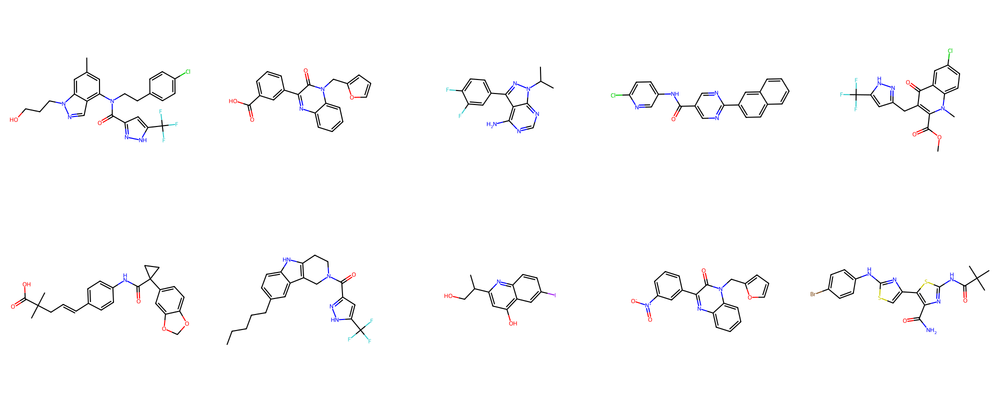

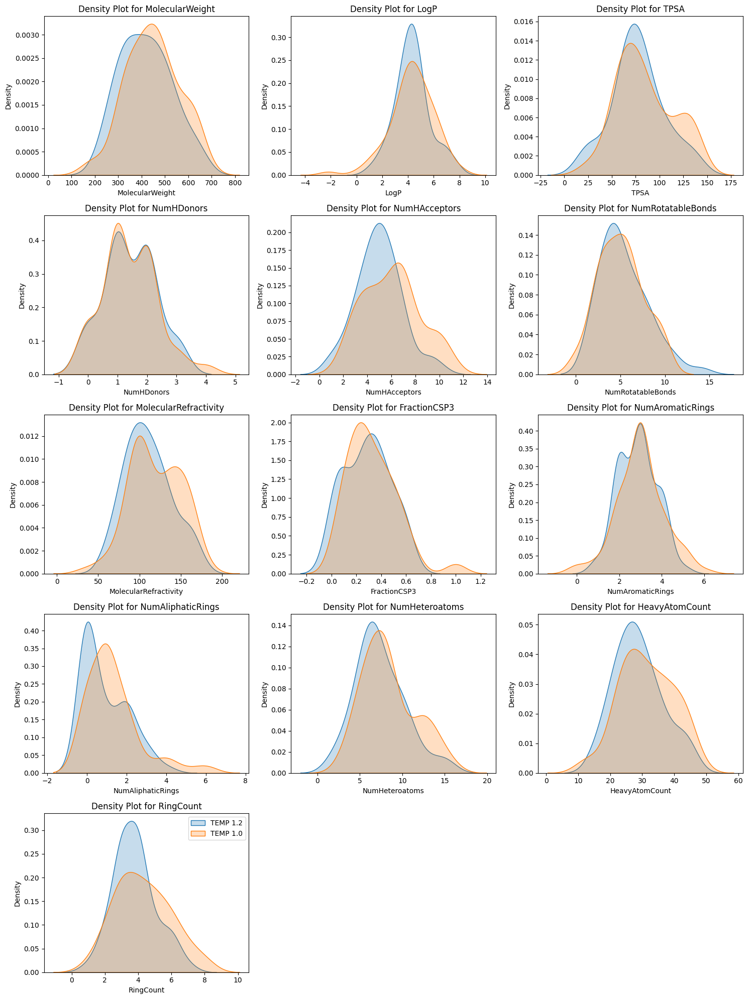

In [205]:
# Temperature Studies Fine-Tuned Model

model_path = "/content/drive/MyDrive/InspiritAI/1:1Mentorship/sanjay_oruganti/TD_128_L8_H4_fine_tuned_F18.keras"
temp_model = tf.keras.models.load_model(model_path)

generated_smiles_list = []
for i in tqdm(range(100)):
    generated_smiles = generate_smiles(temp_model, start_token='<SOS>', max_length=max_length, chars_to_index=chars_to_index, index_to_chars=index_to_chars, temperature=1.2)
    generated_smiles_list.append(generated_smiles)

validity, uniqueness, unique_valid_smiles_temp = evaluate_generated_smiles(generated_smiles_list, fine_tuning_smiles_list)
print(f"\nPercent valid: {validity:.3f}%")
print(f"Percent unique: {uniqueness:.3f}%")
print(unique_valid_smiles_temp)

# Example: Display the first 10 unique valid SMILES strings as a grid image
molecule_list = [Chem.MolFromSmiles(smiles) for smiles in unique_valid_smiles_temp[:10]]

# Generate a grid image of the molecules
# Adjust 'subImgSize' for the size of each molecule image, and 'molsPerRow' for the layout
grid_image = Draw.MolsToGridImage(molecule_list, molsPerRow=5, subImgSize=(400, 400))

# Display the grid image
display(grid_image)

temp_df = pd.DataFrame(unique_valid_smiles_temp, columns=['SMILES'])
descriptor_columns_temp_df = temp_df['SMILES'].apply(compute_descriptors)
descriptors_temp_df = pd.DataFrame(descriptor_columns_temp_df.tolist())
temp_data = pd.concat([temp_df, descriptors_temp_df], axis=1)

# Display the updated dataframe
# Set up the matplotlib figure
plt.figure(figsize=(15, 20))

descriptor_cols = descriptors_temp_df.columns.to_list()

# Loop through the columns and create a density plot for each
for i, column in enumerate(descriptor_cols, 1):
    plt.subplot(5, 3, i)
    sns.kdeplot(temp_data[column], fill=True, label='TEMP 1.2')
    sns.kdeplot(gen_data_fine_tuned[column], fill=True, label='TEMP 1.0')
    plt.title(f'Density Plot for {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.legend()
plt.show()